# Assignment #4 - Reinforcement Learning

### <font color="red"> DUE: Nov 26 (Tuesday) 11:00 pm </font>  

<font color="blue"> Abhilash Mandlekar </font>

# I. Overview

In this assignment I am training the Rummy game by using algorithms of Reinforcement learning. The two temporal difference learning algorithms are used to train the agent of Rummy game.<br>

Temporal Difference (TD) learning refers to a class of model-free reinforcement learning methods. These methods perform updtaes based on current estimates and uses dynamic programming approach to update the tables (like Q-table, rewards etc). The two TD learning methods SARSA and Q-learning are discussed further in this assignment.<br>

The model Rummy agent, is trained using Q-learning approach. Q-learing is better known for its performance since it deals better with the exploration and exploitation. <br>

After training the game, I have saved the model in a pickle file. By uploading this saved model to sever, model has played the games on server with other player's model.

The basic rules of the Rummy game are discribed below:

# II. Problems 



## Rummy (Our Way)
![](https://upload.wikimedia.org/wikipedia/commons/9/9a/3_playing_cards.jpg)



### Description:
Rummy is mostly played by 4 players where each player get 10 cards and rest of placed as closed deck.  

But for this assignment to keep it simple, we have changed some rules, reduced the deck of cards and distribution of the cards among each player. Otherwise, the our Q table would be large to handle on our local machines.  

So in this game each player will get 3 cards randomly from 'A' to '5'. With each turn you have to pick a card either from the pile of closed or open cards depending on the cards you have. After that you have to select a card to drop to the pile from your deck. Your goal is to make all of your 3 cards of same number. As soon as one player reaches the goal state, it will meld the cards and game will stop and all other player will get score as the sum of their cards in hand. Player with minimum score will win the game.  

Each player will play for the 10 rounds and if nobody reach to the meld stage then each will player will get score equivalent to the sum of their cards in hand.

Player with the lowest score wins the game.



### <font color="red"> Game Introduction and Rules: </font>

You can only till max turns which is now 20. If you are able to meld your cards, you win otherwise you lose points as per your stash score.

Lets Simulate a Game Round :
The Goal of this game is to collect cards with the same rank.
Naming Conventions to follow H : Hearts, S : Spades, D : Diamonds, C : Clubs. Stash/Hand are the cards which you have. Stash/Hand Score: The sum of the rank of cards. 

- On the first turn you will be given 3 cards from the randomly shuffled deck. Eg: 3H, 2S, AD. Stash Score: 6
- In the next step you will have to either pick a card from pile or the deck. On the first turn, the top card of the deck is on the pile. The card on the pile is visible to you. So Card on the Pile : 2D . You have to decide whether you have to pick this card or you have to pick from pile. Since you alread
- Following the pickup step, you will have to drop one card from the stash/hand. Your Hand : 3H, 2S, AD, 2D
- You can drop any of these cards, but remember if you drop 2S or 2D you might not be able to make a series. So you have to decide whether to drop 3H or AD. Since there are maximum 20 turns, you have to keep your score low as well, Higher the score the higher points you lose. So you decide to drop 3H. Your hand/stash will be: 2S, 2D, AD
- Your opponent will play his hand, he/she shall pick up a card from a pile or deck and the drop a card to the pile.
- Now its your turn. The card on the Pile : 5H. Since picking up this card won't help you much. You decide to pick a card from the Deck. You get lucky, you get a 2C card. Your hand now is 2S, 2D, 2C, AD. Hurray! You can now meld these cards and drop the last card to make your score 0.
- You win this round. Your opponent Stash/Hand score : 15. So you are at 0 points and your opponent is at 15 points. You are ahead of him since you have to keep your score as low as possible.


## Rummy Environment

Importing Libraries

In [29]:
import random 
from functools import reduce
from collections import defaultdict
import numpy as np
from copy import copy
%matplotlib inline
import matplotlib.pyplot as plt
import pickle
import seaborn as sb

Here, we define the SUITS, RANKS of the cards and their RANK_VALUE.

In [30]:
SUIT = ['H','S','D','C']
RANK = ['A', '2', '3', '4', '5','6','7']
RANK_VALUE = {'A': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'T': 10, 'Q': 10, 'K': 10}

## Card Class Definition
__init__  : Defines the card details such as rank, suit and calculates the rank value


In [31]:
class Card :
    def __init__(self,rank,suit):
        self.rank = rank
        self.suit = suit
        self.rank_to_val = RANK_VALUE[self.rank]
    
    def __str__(self):
        return f'{self.rank}{self.suit}'

    def __repr__(self):
        return f'{self.rank}{self.suit}'

    
    def __eq__(self,other):
        return self.rank == other.rank and self.suit == other.suit
  
# Deck class contains some basic operations performed with the cards:
# 1. Shuffling the cards.
# 2. Drawing card from the deck.

## Deck Class Definition
__shuffle__ : Shuffles the deck in random order

__draw_card__ : Draws a card from the top of the deck

In [32]:
class Deck:
    def __init__(self,packs):
        self.packs = packs
        self.cards = []
        for pack in range(0,packs) :
            for suit in SUIT :
                for rank in RANK :
                    self.cards.append(Card(rank,suit))
    
    def shuffle(self):
        random.shuffle(self.cards)
    
    def draw_card(self):
        card = self.cards[0]
        self.cards.pop(0)
        return card

## Player Class:

### 1.__init__(self,name,stash=list(),isBot=False): 
Initializing stash, name, isBot/dealer points for each player.

### 2. deal_card(self,card):
This method appends the card in the stash and check the condition that length of stash should not be greater than nuber of cards length in game.

### 3. drop_card(self,card):
This method removes the card from stash and add that card into pile.

### 4. meld(self):
This method tries to find the cards with the same rank in the hand. If it finds then it will merge the cards in the hand to the melded cards array in the game. 

### 5. stash_score(self):
This method calculates sum of all the cards in stash according to the rank of each card.

### 6. get_info(self,debug):
This function fetch all the information of the player.

In [33]:
class Player:
  
    """  
        Player class to create a player object.
        eg: player = Player("player1", list(), isBot = False)
        Above declaration will be for your agent.
        All the player names should be unique or else you will get error.
        
    """

    def __init__(self,name,stash=list(),isBot=False,points=0,conn=None):
        self.stash = stash
        self.name = name
        self.game = None
        self.isBot = isBot
        self.points = points
        self.conn = conn
        
    def deal_card(self,card):
        try :
            self.stash.append(card)
            if len(stash) > self.game.cardsLength + 1 :
                raise ValueError('Cannot have cards greater than ')
        except ValueError as err:
            print(err.args)
            
    def drop_card(self,card):
        self.stash.remove(card)
        self.game.add_pile(card)
        return -1

    
    def meld(self):
        card_hash = defaultdict(list)
        for card in self.stash:
            card_hash[card.rank].append(card)
        melded_card_ranks = []
        for (card_rank,meld_cards) in card_hash.items():
            if len(meld_cards) >= 3 :
                self.game.meld.append(meld_cards)
                melded_card_ranks.append(card_rank)
                for card in meld_cards:
                    self.stash.remove(card)
        
        for card_rank in melded_card_ranks :
            card_hash.pop(card_rank)
        return len(melded_card_ranks) > 0

    def stash_score(self) :
        score = 0
        for card in self.stash :
            score += RANK_VALUE[card.rank]
        return score
    
    def get_info(self,debug):
        if debug :
            print(f'Player Name : {self.name} \n Stash Score: {self.stash_score()} \n Stash : {", ".join(str(x) for x in self.stash)}')
        card_ranks = []
        card_suits = []
        pileset = None
        pile = None
        for card in self.stash :
            card_suits.append(RANK_VALUE[card.rank])
            card_ranks.append(card.suit)
        if len(self.game.pile) > 0 : 
            return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks, "PileRank": self.game.pile[-1].rank, "PileSuit":self.game.pile[-1].suit}
        return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks}


## Game Enviroment:

### 1. __init():  

### 2. add_pile(self, card):  This method takes a card as argument and first checks number of cards in the deck. If its is ‘0’ then add the cards from file to deck and append the passed card to the pile.

### 3. pick_card(self, player, action):  This methods helps player picking up the card from either Pile or Deck based on action.
			We have defined, If action = 0 then, player will pick a card from Pile
			And if action. = 1 then player will pick card from Deck. 
			Meld condition will be check after player picks the card, if the meld condition satisfied, player won. 
            You can modify the rewards in return, only the values

### 4. pick_from_pile(self, player): This method helps player picking card from the pile and simultaneously a card from pile gets reduced.

### 5. pick_from_deck(self, player): This method is similar to above method but it helps picking up card from the Deck. 

### 6. get_player(self, player_name): This function fetch the details of the player given player_name.

### 7. computer_play(self, player): This method defines the play of the computer/Dealer in following sequence:
			--> Randomly taking actions from picking up card from deck/pile.
			--> Checking the meld condition afterwards.
			--> If the meld condition does not satisfied, remove the card from his stash.

### 8. play(self): This method defines all the function city of play for the player:
		  --> Decrementing the maximum number of turns defined per game.
		  --> For each player, it will check the 'stash', if the 'Stash' for any player = 0 (That player won), it will add the value of each card in stash for all other players.
		  --> Or If maximum number of turns in each round becomes 0, it will add the card values in stash for all the players and return.
      
### 9. drop_card(self,player,card) This method drops a card from the player given player object and card object and returns the reward associated with it.

      --> You can modify the rewards which gets returned in the value.


### 9. reset(self, players): This method will reinitialize all the deck, pile and players.

### 10. _update_turn(self): This method is used to count the number of turns in the game.

In [34]:
class RummyAgent() :
    """
    Simple Rummy Environment
    
    Simple Rummy is a game where you need to make all the cards in your hand same before your opponent does.
    Here you are given 3 cards in your hand/stash to play.
    For the first move you have to pick a card from the deck or from the pile. 
    The card in deck would be random but you can see the card from the pile.
    In the next move you will have to drop a card from your hand.
    Your goal is to collect all the cards of the same rank. 
    Higher the rank of the card, the higher points you lose in the game. 
    You need to keep the stash score low. Eg, if you can AH,7S,5D your strategy would be to either find the first pair of the card or by removing the highest card in the deck.
    You only have 20 turns to either win the same or collect low scoring card.
    You can't see other players cards or their stash scores.
    
    Parameters
    ====
    players: Player objects which will play the game.
    max_card_length : Number of cards each player can have
    max_turns: Number of turns in a rummy game
    """

    def __init__(self,players,max_card_length=5,max_turns=20) :
        self.max_card_length = max_card_length
        self.max_turns = max_turns
        self.reset(players)
        
    def update_player_cards(self,players):
        for player in players :
            player = Player(player.name,list(),isBot=player.isBot,points=player.points,conn=player.conn)
            stash = []
            for i in range(self.max_card_length):
                player.stash.append(self.deck.draw_card())
            player.game = self
            self.players.append(player)
        self.pile = [self.deck.draw_card()]

    def add_pile(self,card):
        if len(self.deck.cards) == 0 :
            self.deck.cards.extend(self.pile)
            self.deck.shuffle()
            self.pile = []
        self.pile.append(card)
        
        
    def pick_card(self,player,action):
        if action == 0:
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
        if player.meld() :
            return {"reward" : 10}
        else :
            return {"reward" : -1}
#             return -player.stash_score()
       
    def pick_from_pile(self,player):
        card = self.pile[-1]
        self.pile.pop()
        return player.stash.append(card)
     
    def pick_from_deck(self,player):
        return player.stash.append(self.deck.draw_card())
    
    def get_player(self,player_name):
        return_player = [player for player in self.players if player.name == player_name]
        if len(return_player) != 1:
            print("Invalid Player")
            return None
        else:
            return return_player[0]
    
    def drop_card(self,player,card):
        player.drop_card(card)
        return {"reward" : -1}
    
  
    def computer_play(self,player):
        #Gets a card from deck or pile
        if random.randint(0,1) == 1 :
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
            
        #tries to meld if it can
#         if random.randint(0,10) > 5 :
        player.meld()
        
        #removes a card from the stash
        if len(player.stash) != 0:
            card = player.stash[(random.randint(0,len(player.stash) - 1))]
            player.drop_card(card)
        
    def play(self):
        for player in self.players :
            if len(player.stash) == 0 :
                return True
        if self.max_turns <= 0 :
            return True
        return False

    def _update_turn(self):
        self.max_turns -= 1  
    
    def reset(self,players,max_turns=20):
        self.players = []
        self.deck = Deck(1)
        self.deck.shuffle()
        self.meld = []
        self.pile = []
        self.max_turns = max_turns
        self.update_player_cards(players)




### Example Run with Random Players

This following code shows how to create an environment and players to play 10 games with 20 maximum rounds. This only includes random picking up of card and dropping.  

In [35]:
p1 = Player('tabish',list())
p2 = Player('comp1',list(),isBot=True)
rummy = RummyAgent([p1,p2],max_card_length=3,max_turns=20)

In [36]:
maxiter = 3
debug = True
for j in range(maxiter):
        for player in rummy.players :
            player.points = player.stash_score()
        
        rummy.reset(rummy.players)
        random.shuffle(rummy.players)
        # int i = 0 
        if debug :
            print(f'**********************************\n\t\tGame Starts : {j}\n***********************************')
        while not rummy.play() :    
            rummy._update_turn()
            print(rummy.max_turns)       
            for player in rummy.players:
                if player.isBot :
                    if rummy.play():
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    rummy.computer_play(player)
                    if debug :
                        player.get_info(debug)
                        if player.stash == 0 :
                            print(f'{player.name} wins the round')

                else :
                    if rummy.play() :
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    player_info = player.get_info(debug)
                    action_taken = np.random.choice(1)
                    if debug :
                        print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                    result_1 = rummy.pick_card(player,action_taken)
                    result_1 = result_1["reward"]

                    if debug : 
                        print(f'{player.name} takes action {action_taken}')
                    #player stash will have no cards if the player has melded them 
                    #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                    if len(player.stash) == 1:
                        rummy.drop_card(player,player.stash[0])
                        if debug :
                            print(f'{player.name} Wins the round')

                    elif len(player.stash) != 0 :

                        player_info = player.get_info(debug)
                        s = player_info['CardRanks']
                        action_taken = np.random.choice(4)
                        card = player.stash[action_taken]
                        if debug :
                            print(f'{player.name} drops card {card}')

                        result_1 = rummy.drop_card(player,card)
                        result_1 = result_1["reward"]
#                             pdb.set_trace()
                    else :
                        if debug :
                            print(f'{player.name} Wins the round')
                    if debug :
                        player.get_info(debug)
        


**********************************
		Game Starts : 0
***********************************
19
tabish Plays
Player Name : tabish 
 Stash Score: 15 
 Stash : 5D, 3H, 7D
Card in pile S5
tabish takes action 0
Player Name : tabish 
 Stash Score: 20 
 Stash : 5D, 3H, 7D, 5S
tabish drops card 5S
Player Name : tabish 
 Stash Score: 15 
 Stash : 5D, 3H, 7D
comp1 Plays
Player Name : comp1 
 Stash Score: 13 
 Stash : 2C, 4H, 7C
18
tabish Plays
Player Name : tabish 
 Stash Score: 15 
 Stash : 5D, 3H, 7D
Card in pile S5
tabish takes action 0
Player Name : tabish 
 Stash Score: 20 
 Stash : 5D, 3H, 7D, 5S
tabish drops card 7D
Player Name : tabish 
 Stash Score: 13 
 Stash : 5D, 3H, 5S
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : 2C, 7C, 2D
17
tabish Plays
Player Name : tabish 
 Stash Score: 13 
 Stash : 5D, 3H, 5S
Card in pile H4
tabish takes action 0
Player Name : tabish 
 Stash Score: 17 
 Stash : 5D, 3H, 5S, 4H
tabish drops card 4H
Player Name : tabish 
 Stash Score: 13 
 Stash : 5D,

# III. Methods

- Decide your TD learning approach: SARSA or Q-learning? 
- Decide your function approximator.
- Describe your approach and the reason why you select it.
- Finish epsilon_greedy function and other TODOs. Explain it.
- Explain your codes.

## Review of SARSA and Q-learning

### SARSA Learning
SARSA is an on-policy algorithm where, in the current state, S an action, A is taken and the agent gets a reward, R and ends up in next state, S1 and takes action, A1 in S1.


#### Updation of Q-table
$$Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma Q(s_{t+1}, a_{t+1}) - Q(s_t, a_t))$$
#### Algorithm
    Initialize Q(s, a) arbitrarily
    REPEAT (for each episode):
        Initialize s
        Choose a from s using policy derived from Q
        Repeat (for each step of episode):
            Take action a, observe r, s'
            Choose a' from s' using policy derived from Q
            Update the Q-table as per the formula given above for SARSA learning
            s <-- s'
            a <-- a'
        until s is terminal


### Q Learning

Q-learning attempts to learn the value of being in a given state, and taking the specific action.<br>

Q-Learning is a table of values for every state (row) and action (column) possible in the environment. Within each cell of the table, we learn a value for how good it is to take a given action within a given state. <br>

We start by initializing the table to be uniform (all zeros), and then as we observe the rewards we obtain for various actions, we update the table accordingly.

We make updates to our Q-table using the Bellman equation, which states that the expected long-term reward for a given action is equal to the immediate reward from the current action combined with the expected reward from the best future action taken at the following state. In this way, we reuse our own Q-table when estimating how to update our table for future actions.<br>

#### Updation of Q-table in Q-learning
$$Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma \max_a Q(s_{t+1}, a) - Q(s_t, a_t))$$

#### Algorithm

    Initialize Q(s, a) arbitrarily
    REPEAT (for each episode):
        Initialize s
        Repeat (for each step of episode):
            Choose a from s using policy derived from Q
            Take action a, observe r, s'
            Update the Q-table as per the formula given above for Q-learning
            s <-- s'
        until s is terminal

## Choice of TD learning and reason

SARSA chooses an action following the same current policy and updates its Q-values whereas Q-learning chooses the greedy action, that is, the action that gives the maximum Q-value for the state.<br>

Since the agent should learn the optimal policies as well as explore all the possibilities, it is always a good idea to use Q-learning over SARSA learning.<br>

SARSA only looks up the next policy value while Q-learning looks up the next maximum policy value. Q-learning has the capabilitiy to continue learning while changing policies.

## Choice of Function Approximation and Reason

Picking an action can be simple by selecting one with maximum Q value. 

$$
a^* = \arg \max_a Q(S_t, a)
$$

However, this can cause limited experience to develop good Q estimation, and eventually a good policy. 
Without new data, greedy action selection will repeat the same actions, or repeatedly *exploit* your current knowledge. Thus, you need to *explore* other non-greedy actions to increase the experience to improve the Q estimation. 

This is called "exploration-exploitation dilemma." 


One of the way for this dilemma is $\epsilon$-greedy action selection. With a parameter $\epsilon \in [0, 1]$, we can control the exploration and exploitation level. When $\epsilon = 0$, the actions are selected in greedy manner, but when $\epsilon = 1$, the actions are selected randomly. 

## RL Agent for Rummy

The below class Rummy() creates an RL Agent for Rummy game.

In [164]:
class Rummy():
    
    def __init__(self, env):
        print(env.players[0].name)
        env.reset(env.players)
        random.shuffle(env.players)
        env._update_turn()
        #self.update_cards = env.update_player_cards()
        self.p1 = env.get_player(env.players[0].name)       
        #self.pck_card = env.pick_card(self.p1, 0)
        #self.drp_card = env.drop_card(self.p1, card)
        self.actions = [0,1]
        self.action_taken = len(self.actions)
        self.action_taken1 = len(self.actions)
        # self.Q table including the surrounding border
        #self.Q = np.zeros((self.size[0], self.size[1], self.n_a))
        self.Q = np.zeros((8, 8, 3))
        
    def epsilon_greed(self, epsilon, s):
        if np.random.uniform() < epsilon:
            a = np.random.randint(self.action_taken)
        else:
            i_max = np.where(self.Q[s[0], s[1], :] == np.max(self.Q[s[0], s[1], :]))[0]
            a = int(np.random.choice(i_max))
        return a
        
    def train(self, env, **params):
        gamma = params.pop('gamma', 0.99)
        alpha = params.pop('alpha', 0.1)
        epsilon= params.pop('epsilon', 0.1)
        maxiter= params.pop('maxiter', 1000) 
        maxstep= params.pop('maxstep', 1000)
        
        s_rewards = []
        reward_result = []
        for player in env.players :
            player.points = player.stash_score()
        
        for j in range(maxstep):
            steps = 0 
            env.reset(env.players)
            random.shuffle(env.players)
            env._update_turn()
            if debug :
                print(f'**********************************\n\t\tGame Starts : {j}\n***********************************')
            #while not env.play() :       
            for player in env.players:
                if player.isBot :
                    if env.play():
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    env.computer_play(player)
                    if debug :
                        player.get_info(debug)
                        if player.stash == 0 :
                            reward_result.append(10)
                            print(f'{player.name} wins the round')

                else :
                    for i in range(maxiter):
                        if(player.meld()):
                            reward_result.append(10)
                            s_rewards.append(np.sum(reward_result))
                            break;
                        s_rewards.append(np.sum(reward_result))

                        if env.play() :
                            continue
                        if debug :
                            print(f'{player.name} Plays')
                        player_info = player.get_info(debug)                      
                        s = player_info['CardSuit'] #get current cards
                        action_taken = self.epsilon_greed(epsilon, s)
                        if debug :
                            print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                        result_1 = env.pick_card(player,action_taken)
                        r = result_1["reward"]
                        reward_result.append(r)
                        if debug : 
                            print(f'{player.name} takes action {action_taken}')
                        #player stash will have no cards if the player has melded them 
                        #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                        if len(player.stash) == 1:
                            env.drop_card(player,player.stash[0])
                            if debug :
                                print(f'{player.name} Wins the round')


                        elif len(player.stash) != 0 :

                            player_info = player.get_info(debug)
                            s1 = player_info['CardSuit']

                            action_taken1 = self.epsilon_greed(epsilon, s1) 
                            print("State " , s1)
                            #print("State Q:", self.Q)
                            self.Q[s[0], s[1], action_taken] += alpha * (r + (gamma * self.Q[s1[0], s1[1], action_taken]) - self.Q[s[0], s[1], action_taken])
                            card = player.stash[action_taken]
                            if debug :
                                print(f'{player.name} drops card {card}')

                            result_1 = env.drop_card(player,card)
                            r = result_1["reward"]
                            reward_result.append(r)
                            steps+=1
    #                             pdb.set_trace()
                        else :
                            if debug :
                                print(f'{player.name} Wins the round')
                        if debug :
                            player.get_info(debug)
        return steps, s_rewards, self.Q
  
    def test(self):
        s_rewards = []
        reward_result = []
        maxstep = 3
        maxiter = 20
        for player in env.players :
            player.points = player.stash_score()
        
        for j in range(maxstep):
            steps = 0 
            env.reset(env.players)
            random.shuffle(env.players)
            env._update_turn()
            if debug :
                print(f'**********************************\n\t\tGame Starts : {j}\n***********************************')
            #while not env.play() :       
            for player in env.players:
                if player.isBot :
                    if env.play():
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    env.computer_play(player)
                    if debug :
                        player.get_info(debug)
                        if player.stash == 0 :
                            reward_result.append(10)
                            print(f'{player.name} wins the round')

                else :
                    for i in range(maxiter):
                        if(player.meld()):
                            reward_result.append(10)
                            s_rewards.append(np.sum(reward_result))
                            break;
                        s_rewards.append(np.sum(reward_result))

                        if env.play() :
                            continue
                        if debug :
                            print(f'{player.name} Plays')
                        player_info = player.get_info(debug)                      
                        s = player_info['CardSuit'] #get current cards
                        action_taken = self.epsilon_greed(epsilon, s)
                        if debug :
                            print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                        result_1 = env.pick_card(player,action_taken)
                        r = result_1["reward"]
                        reward_result.append(r)
                        if debug : 
                            print(f'{player.name} takes action {action_taken}')
                        if len(player.stash) == 1:
                            env.drop_card(player,player.stash[0])
                            if debug :
                                print(f'{player.name} Wins the round')


                        elif len(player.stash) != 0 :

                            player_info = player.get_info(debug)
                            s1 = player_info['CardSuit']

                            action_taken1 = self.epsilon_greed(epsilon, s1) 
                            print("State " , s1)
                            #print("State Q:", self.Q)
                            card = player.stash[action_taken]
                            if debug :
                                print(f'{player.name} drops card {card}')

                            result_1 = env.drop_card(player,card)
                            r = result_1["reward"]
                            reward_result.append(r)
                            steps+=1
    #                             pdb.set_trace()
                        else :
                            if debug :
                                print(f'{player.name} Wins the round')
                        if debug :
                            player.get_info(debug)
        return steps, s_rewards, self.Q

## Explanation of Code

Each time the game starts, the model is initialized by __init__ method. It resets the gaming environment, creates the player, shuffles the card randomly. It also creates Q-table, and initializes the actions to be taken (0 and 1). For the first time I am initializing the Q-table with all zero values. Here I have initialized the Q-table with the dimension of (8,8,3) that is for cards (A, 2, 3, 4, 5, 6, 7) and the 3 states of cards in hand. The zeroth index of Q-table will always remain unchanged (all zeros) because there is no card zero (cards will start from Ace as index one and so on).<br>

As we know that there two actions for picking the card, I have defined action_taken as array of integers zero and one. The action value zero represents the player will pick the card from Pile and the value one represents that the player will pick a card from Deck.<br>

The action taken by the player (Agent) is always choosen by the values in Q-table. To do this, the epsilon_greedy function is used, which will take the highest argument value in Q-table and will return the same.<br>

The Q-table is calculated by dynamic programming approach and by the formula discussed above. Each time the player wins the game, the reward of positive 10 is returned. In the same way if the players continues to play without wining the game, the reward of negative one is returned. If the player wins the game with optimal Q-table values we can stop the training and return these important values.<br>

I have returned the sum of rewards as s_rewards, the number of iterations as steps  and the Q values from the train function. These values are later used to experiment and evaluate the model. These values are also saved and sent to server, so that it can play with other models.  

In [158]:
p1 = Player('p3',list())
p2 = Player('comp3',list(),isBot=True)
rummy_env = RummyAgent([p1],max_card_length=3,max_turns=20)
rummy = Rummy(rummy_env)

p3


In [159]:
steps, s_rewards, Q = rummy.train(rummy_env,
                     gamma=0.99, 
        alpha=0.1,
        epsilon=0.1,
        maxiter=20, 
        maxstep=100)

**********************************
		Game Starts : 0
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 3S, 2H
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 3S, 2H, 6D
State  [3, 3, 2, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 3S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 3S, 6D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 3S, 6D, AS
State  [3, 3, 6, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6D, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6D, AS
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 6D, AS, 3S
State  [3, 6, 1, 3]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 6D, AS, 3S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6D, AS, 3S
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, AS, 3S, 

Player Name : p3 
 Stash Score: 6 
 Stash : 3H, 2C, AC
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 2C, AC, 6D
State  [3, 2, 1, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AC, 6D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AC, 6D
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, AC, 6D, 5C
State  [3, 1, 6, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, AC, 5C, 6D
State  [3, 1, 5, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5C, 6D
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AC, 5C, 6D, 5S
State  [1, 5, 6, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5C, 5S
p3 P

 Stash : 6C, 6H, 4H
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 6H, 4H, 3H
State  [6, 6, 4, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 4H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 4H, 3H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 4H, 3H, AH
State  [6, 4, 3, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, 3H, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, 3H, AH
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 3H, AH, 2D
State  [6, 3, 1, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 3H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 3H, 2D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3H, 2D, 3D
State  [6, 3, 2, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 2D, 3D
p3 Plays
Player Name : p3 
 Stash Sco

Player Name : p3 
 Stash Score: 8 
 Stash : 3S, 3H, 2H
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 3H, 2H, 5C
State  [3, 3, 2, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 3H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 3H, 5C
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3S, 3H, 5C, 7C
State  [3, 3, 5, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 5C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 5C, 7C
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3S, 5C, 7C, 6D
State  [3, 5, 7, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 7C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 7C, 6D
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 3S, 7C, 6D, 6S
State  [3, 7, 6, 6]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 7C, 6S
p3

p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 3C, AS, 7D
State  [7, 3, 1, 7]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AS, 7D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AS, 7D
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, AS, 7D, 7H
State  [3, 1, 7, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 7D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 7D, 7H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : AS, 7D, 7H, 3C
State  [1, 7, 7, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 7H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 7H, 3C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 7H, 3C, 5S
State  [7, 7, 3, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3C, 5S
Card in 

State  [2, 4, 7, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 7C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 7C, 5D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, 7C, 5D, 2H
State  [4, 7, 5, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 5D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 5D, 2H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 5D, 2H, AS
State  [4, 5, 2, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2H, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2H, AS
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 2H, AS, 3H
State  [4, 2, 1, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, AS, 3H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, AS, 3H
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, AS, 3H,

 Stash : 3S, 2D, 6S, 3C
State  [3, 2, 6, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 6S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 6S, 3C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 6S, 3C, 2D
State  [3, 6, 3, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 3C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 3C, 2D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 3C, 2D, AS
State  [6, 3, 2, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, 2D, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, 2D, AS
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 2D, AS, 7S
State  [6, 2, 1, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, AS, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, AS, 7S
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score

p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 5D, 4H, 3D
State  [4, 5, 4, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4H, 3D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 4H, 3D, 5C
State  [5, 4, 3, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 3D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 3D, 5C
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 3D, 5C, 7D
State  [5, 3, 5, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 5C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 5C, 7D
Card in pile D3
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 58
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7S, 6D
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 3H, 2D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3H, 2D, 3D
State  [6, 3, 2, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 2D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 2D, 3D
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 2D, 3D, AS
State  [6, 2, 3, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2D, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2D, AS
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 2D, AS, 4D
State  [6, 2, 1, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AS, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AS, 4D
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, AS, 4D, 6C
State  [6, 1, 4, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, A

p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 4D, 5D, 6S
State  [7, 4, 5, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5D, 6S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 5D, 6S, 4D
State  [7, 5, 6, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 6S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 6S, 4D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6S, 4D, 3D
State  [5, 6, 4, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4D, 3D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 4D, 3D, AS
State  [5, 4, 3, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 3D, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 3D, AS
Card in pi

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7S, AD, 2D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AD, 2D, 3C
State  [7, 1, 2, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 2D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 2D, 3C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 2D, 3C, 5C
State  [1, 2, 3, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 3C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 3C, 5C
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 3C, 5C, 4D
State  [1, 3, 5, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3C, 4D
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 3C, 4D, 5C
State  [1, 3, 4, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4D, 5

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4H, 4C, AC
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 4C, AC, 6H
State  [4, 4, 1, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 4C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 4C, 6H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 4C, 6H, AD
State  [4, 4, 6, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 6H, AD
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 6H, AD
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 6H, AD, 7C
State  [4, 6, 1, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6H, 7C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 6H, 7C, 5D
State  [4, 6, 7, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 7S, AS
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7S, AS, AD
State  [3, 7, 1, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 9 
 Stash : 7S, AS, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 7S, AS, AD
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, AS, AD, 3D
State  [7, 1, 1, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 5 
 Stash : AS, AD, 3D
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AS, AD, 3D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AS, AD, 3D, 6S
State  [1, 1, 3, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3D, 6S
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : AS, 3D, 6S, 6C
State  [1, 3, 6, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3D,

Player Name : p3 
 Stash Score: 7 
 Stash : 4S, 2C, AD
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4S, 2C, AD
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 2C, AD, 5H
State  [4, 2, 1, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, AD, 5H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, AD, 5H
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, AD, 5H, 2C
State  [4, 1, 5, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 5H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 5H, 2C
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 5H, 2C, 7S
State  [1, 5, 2, 7]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 5H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 5H, 7S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 5H, 7S, 2S
State  [1, 5, 7, 2]
p3 drops card

In [160]:
pickle_out = open("dict.pickle","wb")
pickle.dump(Q, pickle_out)
pickle_out.close()

# IV - Results

Following are the Q-values obtained from the above trained model.

In [161]:
Q

array([[[ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        ],
        [-0.79720559, -0.6979035 , -0.6979035 ],
        [-0.99551198, -1.09451647, -0.99551198],
        [-1.48954536, -1.58805582, -1.48954536],
        [-1.3909363 , -1.48954536, -1.3909363 ],
        [-1.19342195, -1.29222853, -1.19342195],
        [-1.3909363 , -1.29222853, -1.3909363 ],
        [-0.89640839, -0.89640839, -0.79720559]],

       [[ 0.        ,  0.        ,  0.        ],
        [-0.89640839, -0.6979035 , -0.79720559],
        [-0.3994004 , -0.3994004 , -0.2997001 ],
        [-0.99551198, -0.89640839, -0.99551198],
        [-1.4895

Text(0, 0.5, 'sum of rewards')

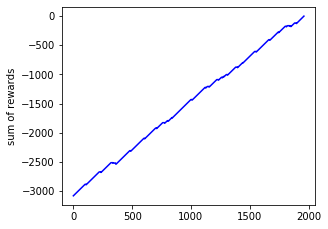

In [162]:
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(221)
plt.plot(s_rewards[::-1],"b-")
plt.ylabel("sum of rewards")


We can see from the below graph that the rewards are improving from large negative values to zeros and it improves later.

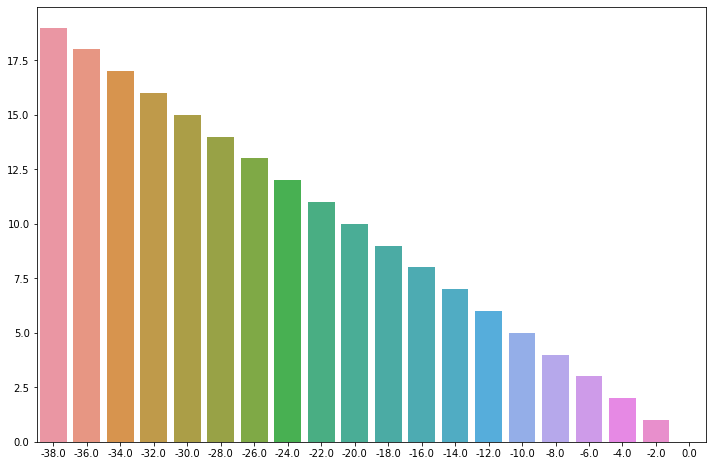

In [163]:
fig = plt.figure(figsize=(12,8))
sb.barplot(s_rewards[:20],range(20))

## Experiment: choice of parameters

I have experimented the model on different gamma, alpha and epsilon values. The below graphs shows the same.<br>


In [173]:
alpha_values = [0.1,0.2,0.3,0.4,0.5]
epoch_vs_alpha=[]
for a in alpha_values:
    steps, s_rewards, Q = rummy.train( rummy_env,
                                   gamma=0.99, 
                                   alpha=a, 
                                   epsilon=0.1, 
                                   maxiter=20, 
                                   maxstep=100)
    epoch_vs_alpha.append(sum(s_rewards)/len(s_rewards))

**********************************
		Game Starts : 0
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, 2H, AS
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 2H, AS, 5D
State  [7, 2, 1, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, AS, 5D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, AS, 5D
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, AS, 5D, 3H
State  [2, 1, 5, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, AS, 3H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, AS, 3H
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, AS, 3H, AH
State  [2, 1, 3, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AS, AH
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AS, AH
Card in pile H3
p3 takes action 2
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 


Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5D, 7C
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 23 
 Stash : 7D, 5D, 7C, 4D
State  [7, 5, 7, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 5D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 5D, 4D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 7D, 5D, 4D, 7C
State  [7, 5, 4, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 4D, 7C
**********************************
		Game Starts : 10
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 3C, 6D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2C, 3C, 6D, 6C
State  [2, 3, 6, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 6D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 6D, 6C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6D, 6C, AC
Stat

State  [4, 4, 2, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 4D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 4D, 3S
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 4D, 3S, 2D
State  [4, 4, 3, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 3S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 3S, 2D
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 3S, 2D, 2S
State  [4, 3, 2, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 3S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 3S, 2S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3S, 2S, 5C
State  [4, 3, 2, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 2S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 2S, 5C
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 2S, 5C,

Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 4S, 5H, 5C
State  [6, 4, 5, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5C
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5H, 5C, AC
State  [6, 5, 5, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AC
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5H, AC, 2S
State  [6, 5, 1, 2]
p3 drops card 5H
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, AC, 2S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, AC, 2S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, AC, 2S, 3C
State  [6, 1, 2, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 2S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 2S, 3C
Card in pile CA
p3 takes act

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 6C, 3S
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 6C, 3S, AD
State  [4, 6, 3, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3S, AD
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3S, AD
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 3S, AD, AC
State  [6, 3, 1, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AD, AC
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AD, AC
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AD, AC, 3S
State  [6, 1, 1, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AC, 3S
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AC, 3S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AD, AC, 3S, 6C
State  [1, 1, 3, 6]
p3 drops card AD
Player Name : p3

State  [3, 7, 3, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 3H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 3H, 5C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 3H, 5C, AH
State  [3, 3, 5, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, 5C, AH
**********************************
		Game Starts : 39
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, AD, 3H
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, AD, 3H, 6S
State  [3, 1, 3, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 3H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 3H, 6S
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : AD, 3H, 6S, 6H
State  [1, 3, 6, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 3H, 6

 Stash : 2S, 6H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 6H, 5D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 6H, 5D, 2H
State  [2, 6, 5, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 5D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 5D, 2H
Card in pile H6
p3 takes action 2
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 45
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 5C, 7H
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 5S, 5C, 7H, 4H
State  [5, 5, 7, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 7H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 7H, 4H
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 7H, 4H, 2S
State  [5, 7, 4, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score

Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, AS, 3H, 6D
State  [2, 1, 3, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, AS, 6D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, AS, 6D
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, AS, 6D, 3H
State  [2, 1, 6, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6D, 3H
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 3H, 3S
State  [1, 6, 3, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6D, 3S
**********************************
		Game Starts : 54
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 2H, 5C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 2H, 5C, 4H
State  [4, 2, 5, 4]
p3 drops card 2H
Player Name : p3 
 Stash 

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AH
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 5H, AH, 7H
State  [6, 5, 1, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 5H, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 5H, 7H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 5H, 7H, 4S
State  [6, 5, 7, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7H, 4S
Card in pile H5
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7H, 4S, AC
State  [6, 7, 4, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 7H, AC
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 7H, AC
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7H, AC, 4S
State  [6, 7, 1, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 7H,

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 6D, 2C
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 6D, 2C, 6H
State  [4, 6, 2, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 6D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 6D, 6H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 6D, 6H, AH
State  [4, 6, 6, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 6H, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 6H, AH
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 6H, AH, 6D
State  [4, 6, 1, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, AH, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, AH, 6D
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, AH, 6D, 7D
State  [6, 1, 6, 7]
p3 drops card 6D
Player Name 

 Stash : AD, 2H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AD, 2H, 2D
Card in pile CA
p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 2H, 2D, 4D
State  [1, 2, 2, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2H, 4D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 2H, 4D, 7H
State  [1, 2, 4, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 4D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 4D, 7H
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : AD, 4D, 7H, 6D
State  [1, 4, 7, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 4D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 4D, 6D
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : AD, 4D, 6D, 7H
State  [1, 4, 6, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 

 Stash : 3S, 7S, 5S, AS
State  [3, 7, 5, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5S, AS
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5S, AS
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 5S, AS, 7C
State  [7, 5, 1, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, AS, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, AS, 7C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, AS, 7C, 5S
State  [7, 1, 7, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 7C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 7C, 5S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : AS, 7C, 5S, 7S
State  [1, 7, 5, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5S, 7S
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Sco

p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7H, 4D, AS
State  [1, 7, 4, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 4D, AS
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 4D, AS
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 4D, AS, 3S
State  [1, 4, 1, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 5 
 Stash : AC, AS, 3S
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, AS, 3S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : AC, AS, 3S, 4D
State  [1, 1, 3, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3S, 4D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 3S, 4D, 6S
State  [1, 3, 4, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 4D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 4D, 6S
Card in pile S3


Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 2H, 7D, 2D
State  [5, 2, 7, 2]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 7D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 7D, 2D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 7D, 2D, 5H
State  [2, 7, 2, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2D, 5H
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 2D, 5H, 2H
State  [7, 2, 5, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 5H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 5H, 2H
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5H, 2H, AS
State  [2, 5, 2, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 5H, AS
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 5H,

 Stash : 4S, 6S, 4D
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6S, 4D, AS
State  [4, 6, 4, 1]
p3 drops card 6S
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 4D, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 4D, AS
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, AS, 6C
State  [4, 4, 1, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 4D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 4D, 6C
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, 6C, AS
State  [4, 4, 6, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 6C, AS
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 6C, AS
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 6C, AS, 4S
State  [4, 6, 1, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AS, 4S
p3 Plays
Player Name : p3 
 Stash Score

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 6S, 2D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 6S, 2D, 2C
State  [7, 6, 2, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 2D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 2D, 2C
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 2D, 2C, 3C
State  [7, 2, 2, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2D, 3C
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 2D, 3C, 2C
State  [7, 2, 3, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3C, 2C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3C, 2C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 3C, 2C, 4D
State  [2, 3, 2, 4]
p3 drops card 3C
Player Name : 

State  [5, 3, 5, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 5S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 5S, 6D
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 5S, 6D, 2S
State  [5, 5, 6, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 5S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 5S, 2S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 5S, 2S, 6D
State  [5, 5, 2, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 2S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 2S, 6D
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 2S, 6D, 2C
State  [5, 2, 6, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, 2S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, 2S, 2C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 2S, 2

Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 2S, 7D, 6S
State  [2, 2, 7, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2S, 6S
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 2S, 6S, 3D
State  [2, 2, 6, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 6S, 3D
**********************************
		Game Starts : 27
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AD
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 3H, AD, 7D
State  [2, 3, 1, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 3H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 3H, 7D
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 3H, 7D, AD
State  [2, 3, 7, 1]
p3 drops card 2H
Player Name : p3 
 Stash

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6H, 7C
Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 2D, 6H, 7C, 7D
State  [2, 6, 7, 7]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6H, 7D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 2D, 6H, 7D, 7C
State  [2, 6, 7, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 7D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 7D, 7C
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6H, 7D, 7C, 3D
State  [6, 7, 7, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7C, 3D
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 6H, 7C, 3D, 5D
State  [6, 7, 3, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 18 
 Stash : 6H,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2S, 6D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 2S, 6D, 7C
State  [5, 2, 6, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 6D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 6D, 7C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 2S, 6D, 7C, 5C
State  [2, 6, 7, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7C, 5C
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 6D, 7C, 5C, 4H
State  [6, 7, 5, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 6D, 7C, 4H, 5C
State  [6, 7, 4, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 7C,

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 3H, 6S, AH
State  [2, 3, 6, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 6S, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 6S, AH
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 6S, AH, 3D
State  [2, 6, 1, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6S, 3D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 2S, 6S, 3D, 7D
State  [2, 6, 3, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 3D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 3D, 7D
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 3D, 7D, AC
State  [2, 3, 7, 1]
p3 drops card 7D
Player Name : 

State  [3, 1, 2, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, 2H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, 2H, 3H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, 2H, 3H, AS
State  [3, 2, 3, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AS
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AS
Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, AS, 4H
State  [2, 3, 1, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3H, 4H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, 4H, AS
State  [2, 3, 4, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 4H, AS
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 4H, AS
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 4H, AS, 2H
S

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3S, 3H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3S, 3H, AS
State  [6, 3, 3, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 7 
 Stash : 3S, 3H, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3S, 3H, AS
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 3H, AS, 6D
State  [3, 3, 1, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AS, 6D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AS, 6D
Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, AS, 6D, 5S
State  [3, 1, 6, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AS, 5S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AS, 5S
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, AS, 5S, 6C
State  [3, 1, 5, 6]
p3 drops card 5S
Player Name : p3

 Stash : 4D, 6C, 4C, AH
State  [4, 6, 4, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 4C, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 4C, AH
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 4C, AH, 5D
State  [6, 4, 1, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4C, 5D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 4C, 5D, 3D
State  [6, 4, 5, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 5D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 5D, 3D
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 5D, 3D, 5H
State  [6, 5, 3, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 5D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 5D, 5H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Sco

 Stash : 3H, AD, 6D, 7H
State  [3, 1, 6, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7H
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 23 
 Stash : 3H, 6D, 7H, 7C
State  [3, 6, 7, 7]
p3 drops card 7H
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3H, 6D, 7C, 2D
State  [3, 6, 7, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 7C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 7C, 2D
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 7C, 2D, 5D
State  [3, 7, 2, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 7C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 7C, 5D
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Sco

Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 4D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 4D, 3D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 4D, 3D, 7D
State  [2, 4, 3, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3D, 7D
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 3D, 7D, 2D
State  [4, 3, 7, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7D, 2D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7D, 2D, 3H
State  [3, 7, 2, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2D, 3H
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 2D, 3H, 7D
State  [3, 2, 3, 7]
p3 drops card

 Stash : 4S, AH, 6D
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, AH, 6D, 4C
State  [4, 1, 6, 4]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 6D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 6D, 4C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 6D, 4C, AD
State  [1, 6, 4, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 4C, AD
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 4C, AD
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4C, AD, 4D
State  [1, 4, 1, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 6 
 Stash : AH, AD, 4D
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AH, AD, 4D
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AH, AD, 4D, 4C
State  [1, 1, 4, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 4D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9

State  [4, 6, 7, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 6C, 2C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 6C, 2C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 6C, 2C, 7S
State  [4, 6, 2, 7]
p3 drops card 4D
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 2C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 2C, 7S
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 2C, 7S, 6D
State  [6, 2, 7, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7S, 6D
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 26 
 Stash : 6C, 7S, 6D, 7H
State  [6, 7, 6, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7S, 7H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 26 
 Stash : 6C, 7S,

p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 2H, 5C, AC
State  [6, 2, 5, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 5C, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 5C, AC
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 5C, AC, 5H
State  [6, 5, 1, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 5C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 5C, 5H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 5C, 5H, AC
State  [6, 5, 5, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 5H, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 5H, AC
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 5H, AC, 6H
State  [5, 5, 1, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, AC, 6H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, AC, 6H
Card in 

State  [7, 7, 2, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 2H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 2H, 5H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 2H, 5H, 2S
State  [7, 2, 5, 2]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 5H, 2S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 5H, 2S, 4S
State  [7, 5, 2, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, 2S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, 2S, 4S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 2S, 4S, 5H
State  [7, 2, 4, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 4S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 4S, 5H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 4S,

State  [3, 6, 2, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, 2H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, 2H, 2C
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 2H, 2C, 5D
State  [6, 2, 2, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 2H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 2H, 5D
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 2H, 5D, 2C
State  [6, 2, 5, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 5D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 5D, 2C
Card in pile H6
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 5D, 2C, 4H
State  [2, 5, 2, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 5D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 5D, 4H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 5D, 4

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 2S, 7D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 2S, 7D, AS
State  [5, 2, 7, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 7D, AS
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 7D, AS
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 7D, AS, 2S
State  [5, 7, 1, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, AS, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, AS, 2S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 7D, AS, 2S, AH
State  [7, 1, 2, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, 2S, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, 2S, AH
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 2S, AH, 5S
State  [7, 2, 1, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7D,

 Stash : 2S, 4H, 3D, 6C
State  [2, 4, 3, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 4H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 4H, 6C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 4H, 6C, 3D
State  [2, 4, 6, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 6C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 6C, 3D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 6C, 3D, 3C
State  [4, 6, 3, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 3D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 3D, 3C
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 3D, 3C, 7C
State  [4, 3, 3, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 3D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 3D, 7C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7D, 3C
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 7D, 3C, 4C
State  [1, 7, 3, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 3C, 4C
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 3C, 4C, 3H
State  [1, 3, 4, 3]
p3 drops card 3C
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 4C, 3H
**********************************
		Game Starts : 37
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 7D, 6D
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 7D, 6D, 2C
State  [7, 7, 6, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 7D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 7D, 2C
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 7D, 2C, 6

Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 3D, 4S, 6C
State  [6, 3, 4, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 6C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3D, 6C, AD
State  [6, 3, 6, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 6C, AD
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 6C, AD
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 6C, AD, 3D
State  [6, 6, 1, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AD, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AD, 3D
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AD, 3D, AH
State  [6, 1, 3, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AD, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, A

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 5S, 3H
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5S, 3H, 2S
State  [1, 5, 3, 2]
p3 drops card 3H
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 5S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 5S, 2S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5S, 2S, 3H
State  [1, 5, 2, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : 5S, 2S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5S, 2S, 3H
Card in pile CA
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 2S, 3H, 4D
State  [5, 2, 3, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 2S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 2S, 4D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 2S, 4D, 6H
State  [5, 2, 4, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 4D

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 2D, 5C
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 2D, 5C, AD
State  [4, 2, 5, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 5C, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 5C, AD
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 5C, AD, 3H
State  [2, 5, 1, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5C, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5C, 3H
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 5C, 3H, 7C
State  [2, 5, 3, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3H, 7C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 3H, 7C, 5C
State  [2, 3, 7, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 7

p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 2C, 3C, 4C
State  [5, 2, 3, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 3C, 4C
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 3C, 4C, 3D
State  [2, 3, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 3C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 3C, 3D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 3C, 3D, 2S
State  [2, 3, 3, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, 3D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, 3D, 2S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 3D, 2S, 3C
State  [2, 3, 2, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2S, 3C
Card in pile C2


Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, 7S, AD, 7H
State  [3, 7, 1, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, AD, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, AD, 7H
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, AD, 7H, 3C
State  [7, 1, 7, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, AD, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, AD, 3C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, AD, 3C, 7H
State  [7, 1, 3, 7]
p3 drops card 7S
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3C, 7H
Card in pile S7
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 3C, 7H, 4D
State  [1, 3, 7, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3

 Stash : 5D, AS, 2H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, AS, 2H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, AS, 2H, 7H
State  [5, 1, 2, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 2H, 7H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 2H, 7H
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 2H, 7H, 6C
State  [5, 2, 7, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 2H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 2H, 6C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 2H, 6C, 7H
State  [5, 2, 6, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 2H, 6C, 7H, 6D
State  [2, 6, 7, 6]
p3 drops card 7H
Player Name : p3 
 Stash Scor

p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 2S, 4C, 6H
State  [4, 2, 4, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 4C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 4C, 6H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, 4C, 6H, 4D
State  [2, 4, 6, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 6H, 4D
**********************************
		Game Starts : 88
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6C, 4C
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, 6C, 4C, 5C
State  [3, 6, 4, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6C, 5C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3D, 6C, 5C, 7S
State  [3, 6, 5, 7]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 St

Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 6D, 2C, 6C
State  [4, 6, 2, 6]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 2C, 6C
**********************************
		Game Starts : 93
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 7C, 6C
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 7C, 6C, 2D
State  [7, 7, 6, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 7C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 7C, 2D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 7C, 2D, 3D
State  [7, 7, 2, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2D, 3D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 2D, 3D, 7C
State  [7, 2, 3, 7]
p3 drops card 7S
Player Name : p3 
 Stas

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 3C, 6S
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 3C, 6S, 6D
State  [7, 3, 6, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 6S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 6S, 6D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 6S, 6D, 3C
State  [7, 6, 6, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 6D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 6D, 3C
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 6D, 3C, 7D
State  [6, 6, 3, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 6D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 6D, 7D
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 6D, 7D, AD
State  [6, 6, 7, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S,

p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, AD, 5S, 5C
State  [2, 1, 5, 5]
p3 drops card 5S
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, AD, 5C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, AD, 5C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, AD, 5C, 5S
State  [2, 1, 5, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 5C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 5C, 5S
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 5C, 5S, 6C
State  [1, 5, 5, 6]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 5C, 6C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 5C, 6C, 5S
State  [1, 5, 6, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 6C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 6C, 5S
Card in pi

 Stash : AC, 3C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3C, 4D
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 3C, 4D, 4C
State  [1, 3, 4, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3C, 4C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 3C, 4C, 4D
State  [1, 3, 4, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 4C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 4C, 4D
Card in pile CA
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 4C, 4D, 5H
State  [3, 4, 4, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4C, 5H
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 4C, 5H, 4D
State  [3, 4, 5, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score:

Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 7D, 5C, 6S
State  [4, 7, 5, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5C, 6S
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 5C, 6S, 2H
State  [7, 5, 6, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 5C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 5C, 2H
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 5C, 2H, 6S
State  [7, 5, 2, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2H, 6S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 2H, 6S, 7D
State  [5, 2, 6, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H,

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, AD, 3S
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, AD, 3S, 7C
State  [3, 1, 3, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, AD, 7C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, AD, 7C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, AD, 7C, 5C
State  [3, 1, 7, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7C, 5C
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 3D, 7C, 5C, 5D
State  [3, 7, 5, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7C, 5D
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 3D, 7C, 5D, 5C
State  [3, 7, 5, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 

p3 drops card 7S
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 3S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 3S, 4S
Card in pile S7
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 3S, 4S, 5D
State  [4, 3, 4, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 3S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 3S, 5D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 3S, 5D, 6D
State  [4, 3, 5, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 5D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 5D, 6D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 5D, 6D, 3S
State  [4, 5, 6, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6D, 3S
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 6D, 3S, 6S
State  [5, 6

 Stash : 2S, 3H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 3H, 4S
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 3H, 4S, 6H
State  [2, 3, 4, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 3H, 6H, 4S
State  [2, 3, 6, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 6H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 6H, 4S
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 3H, 6H, 4S, 5C
State  [3, 6, 4, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 6H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 6H, 5C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3H, 6H, 5C, 7S
State  [3, 6, 5, 7]
p3 drops card 6H
Player Name : p3 
 Stash Scor

State  [7, 2, 2, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, 2H, AD
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, 2H, AD
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 2H, AD, 2D
State  [7, 2, 1, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 5 
 Stash : 2H, AD, 2D
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2H, AD, 2D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, AD, 2D, AH
State  [2, 1, 2, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 5 
 Stash : 2H, 2D, AH
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2H, 2D, AH
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 2D, AH, 6D
State  [2, 2, 1, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6D
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 2D, 6D, 

State  [4, 5, 5, 6]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5D, 6D
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4H, 5D, 6D, 5S
State  [4, 5, 6, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6D, 5S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 6D, 5S, 3S
State  [5, 6, 5, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 5S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 5S, 3S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 5S, 3S, 6D
State  [5, 5, 3, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 3S,

Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 2H, 5H
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 2H, 5H, 3D
State  [3, 2, 5, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 2H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 2H, 3D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 2H, 3D, 5H
State  [3, 2, 3, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3D, 5H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 3D, 5H, 6C
State  [2, 3, 5, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 5H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 5H, 6C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 5H, 6C, 3D
State  [2, 5, 6, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6C, 3D
p3 

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 5S, 5H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5S, 5H, AD
State  [1, 5, 5, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 7 
 Stash : AS, 5H, AD
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AS, 5H, AD
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 5H, AD, 6S
State  [1, 5, 1, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5H, 6S
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 5H, 6S, AD
State  [1, 5, 6, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 6S, AD
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 6S, AD
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6S, AD, 2S
State  [5, 6, 1, 2]
p3 drops card AD
Player Name : 

State  [2, 3, 5, 3]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 5S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 5S, 3H
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 2C, 5S, 3H, 7D
State  [2, 5, 3, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 5S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 5S, 7D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 5S, 7D, 4C
State  [2, 5, 7, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 7D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 7D, 4C
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, 7D, 4C, 3S
State  [2, 7, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 7D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 7D, 3S
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 7D,

p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 7H, AD
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 7H, AD
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 7H, AD, AC
State  [5, 7, 1, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 7H, AC
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 7H, AC
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 7H, AC, 2D
State  [5, 7, 1, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : 5S, AC, 2D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5S, AC, 2D
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, AC, 2D, 7S
State  [5, 1, 2, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AC, 7S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AC, 7S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5S, AC, 7S, 7C
State  [5, 1, 

Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 4S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 4S, 3D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4S, 3D, AH
State  [7, 4, 3, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, 3D, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, 3D, AH
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 3D, AH, 4S
State  [7, 3, 1, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, AH, 4S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, AH, 4S
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, AH, 4S, 5C
State  [3, 1, 4, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, AH, 5C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, AH, 5C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, AH, 5C, 4S
State  [3, 1, 5, 4]
p3 drops card

 Stash : 7S, 4C, 4S
Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 4C, 4S, 6H
State  [7, 4, 4, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 4C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 4C, 6H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 4C, 6H, 4S
State  [7, 4, 6, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 6H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 6H, 4S
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6H, 4S, AD
State  [4, 6, 4, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 4S, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 4S, AD
Card in pile H6
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 1
***********************************
p3 Plays
Player Name : p3 
 Stash Score:

Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 2C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 2C, 4C
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 2C, 4C, 5H
State  [7, 2, 4, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 2C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 2C, 5H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 2C, 5H, 5D
State  [7, 2, 5, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 5H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 5H, 5D
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 5H, 5D, 4H
State  [7, 5, 5, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5H, 4H
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 5H, 4H, AC
State  [7, 5, 4, 1]
p3 drops 

p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 6C, 3H, AC
State  [6, 6, 3, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AC
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 3H, AC, AS
State  [6, 3, 1, 1]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AS
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 3H, AS, 3D
State  [6, 3, 1, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AS, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AS, 3D
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AS, 3D, AD
State  [6, 1, 3, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AS, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AS, AD
Card in pi

State  [6, 7, 1, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7S, 4H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7S, 4H, AS
State  [6, 7, 4, 1]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 4H, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 4H, AS
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 4H, AS, 2H
State  [7, 4, 1, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 4H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 4H, 2H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 4H, 2H, AS
State  [7, 4, 2, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 7 
 Stash : 4H, 2H, AS
**********************************
		Game Starts : 25
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 4H, 

p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 33
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 6D, 4C
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6D, 4C, 3C
State  [7, 6, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 6D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 6D, 3C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6D, 3C, 4D
State  [7, 6, 3, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3C, 4D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 3C, 4D, 6D
State  [7, 3, 4, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4D, 6D
Card in pile S7
p3 takes a

 Stash : 7D, 6S, 6H
Card in pile S2
p3 takes action 2
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 39
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 5C, 6C
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 5C, 6C, 4H
State  [6, 5, 6, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 5C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 5C, 4H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6D, 5C, 4H, 5H
State  [6, 5, 4, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4H, 5H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6D, 4H, 5H, 7H
State  [6, 4, 5, 7]
p3 drops card 4H
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 5H, 7H
p3 Plays
Player Name : p3 
 Stash Sco

State  [1, 7, 2, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 2H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 2H, 4H
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 2H, 4H, 7D
State  [1, 2, 4, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4H, 7D
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 2H, 4H, 7D, 7S
State  [2, 4, 7, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4H, 7S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 2H, 4H, 7S, 7D
State  [2, 4, 7, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 7S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 7S, 7D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 4H, 7S, 7

 Stash : 2D, 3D, 4S, 2H
State  [2, 3, 4, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3D, 2H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 3D, 2H, 4S
State  [2, 3, 2, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 2H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 2H, 4S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 2H, 4S, 3C
State  [3, 2, 4, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 4S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 4S, 3C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 4S, 3C, 2H
State  [3, 4, 3, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 3C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 3C, 2H
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 14

State  [4, 5, 6, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 6S, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 6S, AH
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 6S, AH, 5D
State  [4, 6, 1, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, AH, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, AH, 5D
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, AH, 5D, 7H
State  [6, 1, 5, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, AH, 7H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, AH, 7H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, AH, 7H, 5D
State  [6, 1, 7, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7H, 5D
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : AH, 7H,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 7C, 5C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 7C, 5C, 3C
State  [2, 7, 5, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 5C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 5C, 3C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 5C, 3C, 7C
State  [2, 5, 3, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 3C, 7C
**********************************
		Game Starts : 65
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, AH, 6C
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : AD, AH, 6C, 2H
State  [1, 1, 6, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 4 
 Stash : AD, AH, 2H
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AD, AH, 2H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 7 
 Stash : AD, AH, 2H, 3D

Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 2C, 3D, 4H
State  [6, 2, 3, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 3D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 3D, 4H
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 3D, 4H, 4C
State  [2, 3, 4, 4]
p3 drops card 3D
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 4H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 4H, 4C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4H, 4C, 3D
State  [2, 4, 4, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 4C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 4C, 3D
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 4C, 3D, 2C
State  [4, 4, 3, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 3D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 3D,

p3 drops card 4H
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6S, 3S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 6S, 3S, 2S
State  [3, 6, 3, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 3S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 3S, 2S
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 3S, 2S, 7D
State  [3, 3, 2, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 3S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 3S, 7D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3C, 3S, 7D, 7C
State  [3, 3, 7, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 7D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 7D, 7C
Card in pile S3
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
***********

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, 5S, AH
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 5S, AH, 7D
State  [2, 5, 1, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AH, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AH, 7D
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, AH, 7D, 2S
State  [5, 1, 7, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 7D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 7D, 2S
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7D, 2S, 3H
State  [1, 7, 2, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7D, 3H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AH, 7D, 3H, 6D
State  [1, 7, 3, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 

p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 2D, 3D, 4H
State  [5, 2, 3, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 3D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 3D, 4H
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 3D, 4H, 6D
State  [5, 3, 4, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 3D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 3D, 6D
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 3D, 6D, 4H
State  [5, 3, 6, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6D, 4H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, 6D, 4H, 5C
State  [3, 6, 4, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4H, 5C
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 4S, 7H
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 4S, 7H, 2D
State  [5, 4, 7, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 4S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 4S, 2D
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 4S, 2D, 7H
State  [5, 4, 2, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 2D, 7H
**********************************
		Game Starts : 89
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5H, 7H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7S, 5H, 7H, 4D
State  [7, 5, 7, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 7H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 7H, 4D
Card in pile H5
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 7H, 4D

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 6D, 4S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, 6D, 4S, 4D
State  [2, 6, 4, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 4S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 4S, 4D
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 4S, 4D, 3H
State  [6, 4, 4, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 4S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 4S, 3H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 4S, 3H, 3S
State  [6, 4, 3, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3H, 3S
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 3H, 3S, 7H
State  [6, 3, 3, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 16 
 Stash : 6D,

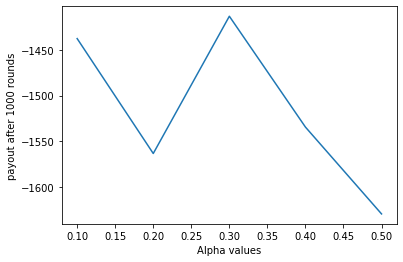

In [174]:
plt.plot(num_alpha_values,avg_payout_vs_alpha)
plt.xlabel('Alpha values')
plt.ylabel('After 100 rounds')
plt.show()

We can see from the graph above that the model performed well for value of alpha = 0.3

In [175]:
epsilon_values = [0.1,0.2,0.3,0.4,0.5]
epoch_vs_epsilon=[]
for e in alpha_values:
    steps, s_rewards, Q = rummy.train( rummy_env,
                                   gamma=0.99, 
                                   alpha=0.3, 
                                   epsilon=e, 
                                   maxiter=20, 
                                   maxstep=100)
    epoch_vs_epsilon.append(sum(s_rewards)/len(s_rewards))

**********************************
		Game Starts : 0
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 4H, AS
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 4H, AS, 2H
State  [6, 4, 1, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 7 
 Stash : 4H, AS, 2H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4H, AS, 2H
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AS, 2H, AC
State  [4, 1, 2, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 6 
 Stash : 4H, AS, AC
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 4H, AS, AC
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AS, AC, 2H
State  [4, 1, 1, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 4 
 Stash : AS, AC, 2H
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AS, AC, 2H
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 7 
 Stash : AS, AC, 2H, 3H
State

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 7C, 5D
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 24 
 Stash : 5H, 7C, 5D, 7H
State  [5, 7, 5, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5D, 7H
Card in pile H5
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 5D, 7H, 3H
State  [7, 5, 7, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 5D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 5D, 3H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5D, 3H, 4S
State  [7, 5, 3, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 3H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 3H, 4S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 3H, 4S, 5D
State  [7, 3, 4, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 3H,

p3 drops card AS
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 5D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 5D, 7D
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 5D, 7D, AS
State  [3, 5, 7, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 7D, AS
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 7D, AS
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 7D, AS, 6H
State  [5, 7, 1, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 7D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 7D, 6H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 7D, 6H, 3C
State  [5, 7, 6, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6H, 3C
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6H, 3C, 4S
State  [5, 6

 Stash : 4H, 5D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 5D, 4D
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5D, 4D, 2D
State  [4, 5, 4, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 4D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 4D, 2D
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 4D, 2D, 6C
State  [4, 4, 2, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 2D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 2D, 6C
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 2D, 6C, 5C
State  [4, 2, 6, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 2D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 2D, 5C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 2D, 5C, 6C
State  [4, 2, 5, 6]
p3 drops card 4H
Player Name : p3 
 Stash Sco

State  [5, 5, 4, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 4S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 4S, 2D
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 4S, 2D, 7C
State  [5, 4, 2, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 4S, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 4S, 7C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 4S, 7C, 2D
State  [5, 4, 7, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 7C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 7C, 2D
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7C, 2D, 3H
State  [4, 7, 2, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 7C, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 7C, 3H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7C,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7C, 3D
Card in pile S7
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 7C, 3D, 5H
State  [4, 7, 3, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 7C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 7C, 5H
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 7C, 5H, 3D
State  [4, 7, 5, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 5H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 5H, 3D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5H, 3D, AH
State  [7, 5, 3, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3D, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3D, AH
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 3D, AH, 5H
State  [7, 3, 1, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 

p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 3S, 7C, AC
State  [2, 3, 7, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 7C, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 7C, AC
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 7C, AC, 6D
State  [3, 7, 1, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 7C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 7C, 6D
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 7C, 6D, AC
State  [3, 7, 6, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 6D, AC
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 6D, AC
Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 6D, AC, 5D
State  [7, 6, 1, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 6D, 5D
**********************************
		Game Starts : 45
*******************

Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 4H, 5D, 4S
State  [1, 4, 5, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 4H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 4H, 4S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 4H, 4S, 5D
State  [1, 4, 4, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 4S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 4S, 5D
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 4S, 5D, AD
State  [4, 4, 5, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, 5D, AD
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, 5D, AD
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 5D, AD, 6H
State  [4, 5, 1, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 5D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 5

 Stash : 4C, 4D, 7C, AC
State  [4, 4, 7, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 4D, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 4D, AC
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 4D, AC, 6C
State  [4, 4, 1, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, AC, 6C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, AC, 6C
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, AC, 6C, 2D
State  [4, 1, 6, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 6C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 6C, 2D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 6C, 2D, 6S
State  [4, 6, 2, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 2D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 2D, 6S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score

**********************************
		Game Starts : 67
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 4D, AH
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 4D, AH, 4S
State  [5, 4, 1, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, 4S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, 4S
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, AH, 4S, 4H
State  [5, 1, 4, 4]
p3 drops card 4S
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, 4H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, 4H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, AH, 4H, 3S
State  [5, 1, 4, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4H, 3S
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 4H, 3S

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, AD, 6H
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, AD, 6H, 4D
State  [6, 1, 6, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AD, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AD, 4D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, AD, 4D, 7S
State  [6, 1, 4, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4D, 7S
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 4D, 7S, 2S
State  [6, 4, 7, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 4D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 4D, 2S
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 4D, 2S, 6S
State  [6, 4, 2, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 14 
 Stash : 6C,

 Stash : 2S, 6C, AD, 2H
State  [2, 6, 1, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 5 
 Stash : 2S, AD, 2H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2S, AD, 2H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, AD, 2H, 7C
State  [2, 1, 2, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 2H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 2H, 7C
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 2H, 7C, 6S
State  [2, 2, 7, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 2H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 2H, 6S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 2H, 6S, 3C
State  [2, 2, 6, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6S, 3C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 7C, 4H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7C, 4H, 3S
State  [1, 7, 4, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 4H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 4H, 3S
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 4H, 3S, AH
State  [1, 4, 3, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 4H, AH
**********************************
		Game Starts : 86
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 6D, AH
Card in pile C5
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 87
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 3H, 3C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 3H, 3C, 7S

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AS, 5C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, AS, 5C, 6C
State  [3, 1, 5, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5C, 6C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 5C, 6C, AC
State  [1, 5, 6, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6C, AC
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6C, AC
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 6C, AC, 3D
State  [1, 6, 1, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6C, 3D
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 6C, 3D, AC
State  [1, 6, 3, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3D

State  [4, 3, 7, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : 4C, 3H, AS
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4C, 3H, AS
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 3H, AS, 6C
State  [4, 3, 1, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, AS, 6C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, AS, 6C
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, AS, 6C, 7D
State  [4, 1, 6, 7]
p3 drops card 6C
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, AS, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, AS, 7D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, AS, 7D, 6S
State  [4, 1, 7, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 7D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 7D, 6S
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 7D, 6

p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AC, 7C, 5H, 3D
State  [1, 7, 5, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 5H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 5H, 3D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AC, 5H, 3D, 6S
State  [1, 5, 3, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3D, 6S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AC, 3D, 6S, 5H
State  [1, 3, 6, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6S, 5H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 6S, 5H, AC
State  [3, 6, 5, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AC
Card in pi

Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 7D, 2C, AS, AH
State  [7, 2, 1, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, 2C, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, 2C, AH
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2C, AH, 4C
State  [7, 2, 1, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AH, 4C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AH, 4C
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, AH, 4C, 5C
State  [7, 1, 4, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, AH, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, AH, 5C
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, AH, 5C, 4C
State  [7, 1, 5, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 5C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH,

 Stash : AS, 2H, 7H
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 2H, 7H, 3S
State  [1, 2, 7, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 7H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 7H, 3S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 7H, 3S, 4S
State  [1, 7, 3, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3S, 4S
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 3S, 4S, 4C
State  [1, 3, 4, 4]
p3 drops card 3S
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 4S, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 4S, 4C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 4S, 4C, AH
State  [1, 4, 4, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 4C, AH
**********************************
		Game 

Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 2D, 3S, 5D
State  [7, 2, 3, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2D, 5D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 2D, 5D, 2S
State  [7, 2, 5, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 5D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 5D, 2S
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 5D, 2S, 2D
State  [7, 5, 2, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 2S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 2S, 2D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 2S, 2D, 7D
State  [5, 2, 2, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 2D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 2D, 7D
Card in pile D5
p3 takes act

p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, AH, 5C, 4C
State  [5, 1, 5, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 5C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 5C, 4C
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : AH, 5C, 4C, 6H
State  [1, 5, 4, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5C, 6H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 5C, 6H, 3H
State  [1, 5, 6, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6H, 3H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AH, 6H, 3H, 6S
State  [1, 6, 3, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 3H, 6S
**********************************
		Game Starts : 37
*******************

p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 4H, 2D, 7C
State  [1, 4, 2, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 4H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 4H, 7C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 4H, 7C, 2D
State  [1, 4, 7, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 7C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 7C, 2D
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 7C, 2D, 6S
State  [4, 7, 2, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 7C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 7C, 6S
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 7C, 6S, 2D
State  [4, 7, 6, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 6S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 6S, 2D
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 5D, 7H
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 5D, 7H, AH
State  [6, 5, 7, 1]
p3 drops card 6S
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 7H, AH
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 7H, AH
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 7H, AH, 6S
State  [5, 7, 1, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, AH, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, AH, 6S
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, AH, 6S, 2H
State  [7, 1, 6, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, AH, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, AH, 2H
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, AH, 2H, 6S
State  [7, 1, 2, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 

p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, 5H, 6D, 4C
State  [3, 5, 6, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6D, 4C
Card in pile H5
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 6D, 4C, 3C
State  [3, 6, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 6D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 6D, 3C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 6D, 3C, 7S
State  [3, 6, 3, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 3C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 3C, 7S
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 3C, 7S, 4S
State  [3, 3, 7, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 3C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 3C, 4S
Card in 

 Stash : 5S, AH, 4C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, AH, 4C, 4H
State  [5, 1, 4, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4C, 4H
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 4C, 4H, 6D
State  [1, 4, 4, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 4H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 4H, 6D
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 4H, 6D, 2S
State  [1, 4, 6, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4H, 2S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 4H, 2S, 6D
State  [1, 4, 2, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 2S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 3S, 6C
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AD, 3S, 6C, 6H
State  [1, 3, 6, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 6C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 6C, 6H
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 6C, 6H, 4D
State  [1, 6, 6, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 6H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 6H, 4D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AD, 6H, 4D, 5C
State  [1, 6, 4, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 4D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 4D, 5C
Card in pile H6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 4D, 5C, 7C
State  [1, 4, 5, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : AD,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, 5S
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 3H, 5S, 3C
State  [2, 3, 5, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 5S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 5S, 3C
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 5S, 3C, AS
State  [2, 5, 3, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3C, AS
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3C, AS
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 3C, AS, 6C
State  [2, 3, 1, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3C, 6C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 3C, 6C, 6S
State  [2, 3, 6, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 6

p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AS, AD
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, AS, AD, 6D
State  [2, 1, 1, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, AS, 6D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, AS, 6D
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, AS, 6D, AD
State  [2, 1, 6, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6D, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6D, AD
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6D, AD, 6S
State  [1, 6, 1, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6S
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6D, 6S, AD
State  [1, 6, 6, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 6S, 

State  [3, 6, 5, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6C, 3S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 6C, 3S, 5D
State  [3, 6, 3, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 3S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 3S, 5D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 3S, 5D, 3C
State  [6, 3, 5, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 5D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 5D, 3C
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 5D, 3C, 5C
State  [3, 5, 3, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5D, 5C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 5D,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 5H, 7H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3D, 5H, 7H, 6H
State  [3, 5, 7, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 7H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 7H, 6H
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3D, 7H, 6H, 5H
State  [3, 7, 6, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 6H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 6H, 5H
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 7H, 6H, 5H, 4C
State  [7, 6, 5, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 6H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 6H, 4C
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7H, 6H, 4C, 5H
State  [7, 6, 4, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 6H,

Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 7D, 4S, 4D
State  [3, 7, 4, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 4S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 4S, 4D
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 4S, 4D, 7H
State  [7, 4, 4, 7]
p3 drops card 4D
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 4S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 4S, 7H
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 4S, 7H, 4D
State  [7, 4, 7, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 7H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 7H, 4D
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 7H, 4D, 3D
State  [4, 7, 4, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 7H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S,

Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 4C, 6D, 5H
State  [4, 4, 6, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 6D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 6D, 5H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6D, 5H, 2S
State  [4, 6, 5, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 5H, 2S
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 5H, 2S, AH
State  [4, 5, 2, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 5H, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 5H, AH
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 5H, AH, 7S
State  [4, 5, 1, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 5H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4H,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 5S, 5C
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 2D, 5S, 5C, 6H
State  [2, 5, 5, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 5S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 5S, 6H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 2D, 5S, 6H, 5C
State  [2, 5, 6, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 6H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 6H, 5C
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6H, 5C, 2S
State  [5, 6, 5, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 5C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 5C, 2S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 5C, 2S, 6H
State  [5, 5, 2, 6]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : 5C,

**********************************
		Game Starts : 31
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, 4D, 2S
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 4D, 2S, AS
State  [4, 4, 2, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2S, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2S, AS
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 2S, AS, 4S
State  [4, 2, 1, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, AS, 4S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, AS, 4S
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, AS, 4S, 6D
State  [2, 1, 4, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, AS, 6D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, AS, 6D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, AS, 6D, 5C
S

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 7H, 5H
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 7H, 5H, AC
State  [4, 7, 5, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 7H, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 7H, AC
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 7H, AC, 5H
State  [4, 7, 1, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, AC, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, AC, 5H
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, AC, 5H, 4C
State  [7, 1, 5, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 5H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 5H, 4C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5H, 4C, AS
State  [1, 5, 4, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 

Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 2H, 3H, 5H
State  [7, 2, 3, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, 5H
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3H, 5H, AC
State  [2, 3, 5, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AC
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3H, AC, 5H
State  [2, 3, 1, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5H
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, AC, 5H, 6H
State  [3, 1, 5, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 5H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 5H,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 4C, 6D
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4C, 6D, AH
State  [2, 4, 6, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 6D, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 6D, AH
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 6D, AH, 2H
State  [4, 6, 1, 2]
p3 drops card 4C
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, AH, 2H
**********************************
		Game Starts : 53
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 6H, 4D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 6H, 4D, AH
State  [5, 6, 4, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : 5H, 4D, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5H, 4D, AH
Card in pile H6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 4D, AH,

p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, AC, AH, 3C
State  [4, 1, 1, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 8 
 Stash : 4S, AC, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4S, AC, 3C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, AC, 3C, AH
State  [4, 1, 3, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3C, AH
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3C, AH
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 3C, AH, 4H
State  [1, 3, 1, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3C, 4H
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 3C, 4H, AH
State  [1, 3, 4, 1]
p3 drops card AC
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 4H, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 4H, AH
Card in pile CA
p3 t

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 4S, 6H
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 4S, 6H, 5D
State  [6, 4, 6, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4S, 5D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4S, 5D, 2S
State  [6, 4, 5, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5D, 2S
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 5D, 2S, 4C
State  [6, 5, 2, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 5D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 5D, 4C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6C, 5D, 4C, 7H
State  [6, 5, 4, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 17 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4C, 4D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 4C, 4D, 3H
State  [1, 4, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 4D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 4D, 3H
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 4D, 3H, 7S
State  [1, 4, 3, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 4D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 4D, 7S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 4D, 7S, 3H
State  [1, 4, 7, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7S, 3H
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 4D, 7S, 3H, 6C
State  [4, 7, 3, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 7S

p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 7D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 7D, 4D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 7D, 4D, 2H
State  [2, 7, 4, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 4D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 4D, 2H
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 4D, 2H, 7D
State  [2, 4, 2, 7]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 2H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 2H, 7D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 2H, 7D, 3H
State  [4, 2, 7, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7D, 3H
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 4D, 7D, 3H, 6S
State  [4, 7, 

State  [1, 5, 3, 3]
p3 drops card 3C
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 5D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 5D, 3H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AC, 5D, 3H, 6S
State  [1, 5, 3, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3H, 6S
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 3H, 6S, 2S
State  [1, 3, 6, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 3H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 3H, 2S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 3H, 2S, 6C
State  [1, 3, 2, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 2S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 2S, 6C
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 2S, 6C, 3

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 6C, 7H
Card in pile H5
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : AC, 6C, 7H, AS
State  [1, 6, 7, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 6C, AS
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 6C, AS
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AC, 6C, AS, 7H
State  [1, 6, 1, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, AS, 7H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, AS, 7H
Card in pile CA
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, AS, 7H, 3D
State  [6, 1, 7, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AS, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AS, 3D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, AS, 3D, 5D
State  [6, 1, 3, 5]
p3 drops card AS
Player Name : 

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 3H, AS
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 3H, AS, 4H
State  [3, 3, 1, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 3H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 3H, 4H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 3H, 4H, 5S
State  [3, 3, 4, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4H, 5S
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 4H, 5S, 6D
State  [3, 4, 5, 6]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4H, 6D
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 4H, 6D, 5S
State  [3, 4, 6, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 

Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 3C, 6C, AH
State  [4, 3, 6, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 6C, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 6C, AH
Card in pile C3
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 6C, AH, 5C
State  [4, 6, 1, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6C, 5C
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4C, 6C, 5C, 4H
State  [4, 6, 5, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 5C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 5C, 4H
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 5C, 4H, 7D
State  [4, 5, 4, 7]
p3 drops card 4H
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C,

State  [3, 7, 2, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2H, 3S
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2H, 3S, 2C
State  [3, 2, 3, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 2H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 2H, 2C
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2H, 2C, 3S
State  [3, 2, 2, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, 2C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, 2C, 3S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2C, 3S, 3D
State  [2, 2, 3, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 3S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 3S, 3D
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 3S, 3D, 6D


State  [6, 2, 6, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, 2D, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, 2D, AC
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 2D, AC, 6C
State  [6, 2, 1, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, AC, 6C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, AC, 6C
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, AC, 6C, 4C
State  [2, 1, 6, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 6C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 6C, 4C
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6C, 4C, AC
State  [2, 6, 4, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 4C, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 4C, AC
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 4C, AC,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 4C, 5D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 4C, 5D, 4D
State  [7, 4, 5, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5D, 4D
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 5D, 4D, 5H
State  [7, 5, 4, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 5D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 5D, 5H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7C, 5D, 5H, 6H
State  [7, 5, 5, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 5H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 5H, 6H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 7C, 5H, 6H, 5D
State  [7, 5, 6, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 16 
 Stash : 5H,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 4S, 7C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 4S, 7C, 3C
State  [5, 4, 7, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 7C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 7C, 3C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 7C, 3C, 4S
State  [5, 7, 3, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 3C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 3C, 4S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 3C, 4S, 5S
State  [7, 3, 4, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4S, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4S, 5S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3C, 4S, 5S, 7C
State  [3, 4, 5, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 16 
 Stash : 4S,

p3 drops card 2C
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3C, 6C
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 3C, 6C, 3D
State  [5, 3, 6, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 3C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 3C, 3D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 3C, 3D, 6C
State  [5, 3, 3, 6]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 3D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 3D, 6C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 3D, 6C, 5S
State  [3, 3, 6, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6C, 5S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 6C, 5S, 3C
State  [3, 6

p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, 4D, 3H, AC
State  [5, 4, 3, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, 3H, AC
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 3H, AC, 5H
State  [4, 3, 1, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5H
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AC, 5H, AS
State  [3, 1, 5, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 5 
 Stash : 3H, AC, AS
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 3H, AC, AS
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AC, AS, 6H
State  [3, 1, 1, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AS, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AS, 6H
Card in pile C

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5S, 2C, 3D
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 2C, 3D, 2D
State  [5, 2, 3, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, 2C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, 2C, 2D
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 2C, 2D, 3D
State  [5, 2, 2, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, 2D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, 2D, 3D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 2D, 3D, 7C
State  [2, 2, 3, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 3D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 3D, 7C
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 2C, 3D, 7C, 7H
State  [2, 3, 7, 7]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 3D,

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, AH, 6C
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, AH, 6C, 6S
State  [2, 1, 6, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, AH, 6S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, AH, 6S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, AH, 6S, 6C
State  [2, 1, 6, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6S, 6C
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AH, 6S, 6C, 5S
State  [1, 6, 6, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 6C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 6C, 5S
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AH, 6C, 5S, 5H
State  [1, 6, 5, 5]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 6C

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 5S, 7D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AS, 5S, 7D, 5D
State  [1, 5, 7, 5]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 7D, 5D
**********************************
		Game Starts : 58
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 7C, 4H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AS, 7C, 4H, 5C
State  [1, 7, 4, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 4H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 4H, 5C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AS, 4H, 5C, 7C
State  [1, 4, 5, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 5C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 5C, 7C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4H, 5C, 7C

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 6H, 3D
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 6H, 3D, AH
State  [2, 6, 3, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, 3D, AH
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, 3D, AH
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3D, AH, 6H
State  [2, 3, 1, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, AH, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, AH, 6H
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, AH, 6H, 6D
State  [3, 1, 6, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, AH, 6D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, AH, 6D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, AH, 6D, 7C
State  [3, 1, 6, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 6

Player Name : p3 
 Stash Score: 9 
 Stash : 5S, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, 3H, AC
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 3H, AC, 3C
State  [5, 3, 1, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, AC, 3C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, AC, 3C
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, AC, 3C, 7C
State  [5, 1, 3, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AC, 7C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AC, 7C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, AC, 7C, 2C
State  [5, 1, 7, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 7C, 2C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 7C, 2C
Card in pile CA
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 7C, 2C, 4H
State  [5, 7, 2, 4]
p3 drops card

**********************************
		Game Starts : 76
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 5D, 6H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 5D, 6H, AS
State  [5, 5, 6, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 6H, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 6H, AS
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6H, AS, 4C
State  [5, 6, 1, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AS, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AS, 4C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, AS, 4C, 7S
State  [5, 1, 4, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 4C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 4C, 7S
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 4C, 7S

p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 4C, AS, 7D
State  [2, 4, 1, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AS, 7D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AS, 7D
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, AS, 7D, 7H
State  [2, 1, 7, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AS, 7H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AS, 7H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, AS, 7H, 6C
State  [2, 1, 7, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 7H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 7H, 6C
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, 7H, 6C, AS
State  [2, 7, 6, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6C, AS
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6C, AS
Card in 

 Stash : 5C, 7C, AH
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 7C, AH, AD
State  [5, 7, 1, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : 5C, AH, AD
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 5C, AH, AD
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AH, AD, 2C
State  [5, 1, 1, 2]
p3 drops card AD
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, AH, 2C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, AH, 2C
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AH, 2C, AD
State  [5, 1, 2, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 4 
 Stash : AH, 2C, AD
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AH, 2C, AD
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 2C, AD, 2D
State  [1, 2, 1, 2]
p3 drops card AD
Player Name : p3 
 Stash Score: 5 
 Stash : AH, 2C, 2D
**********************************
		Game Start

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 6D, 3H
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 6D, 3H, 6C
State  [2, 6, 3, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3H, 6C
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 3H, 6C, 3D
State  [6, 3, 6, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3H, 3D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3H, 3D, 4D
State  [6, 3, 3, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3D, 4D
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3D, 4D, 3H
State  [6, 3, 4, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 3D,

Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AS, 6C, AC
State  [3, 1, 6, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 6C, AC
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 6C, AC
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 6C, AC, AS
State  [3, 6, 1, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AC, AS
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AC, AS
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, AC, AS, 5D
State  [6, 1, 1, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, AC, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, AC, 5D
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, AC, 5D, AS
State  [6, 1, 5, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 5D, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 5D,

p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 7D, 3D, 5D
State  [2, 7, 3, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7D, 5D
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 7D, 5D, 3D
State  [2, 7, 5, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 5D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 5D, 3D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 5D, 3D, 5C
State  [7, 5, 3, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3D, 5C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 3D, 5C, 7C
State  [7, 3, 5, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5C, 7C
Card in 

 Stash : 6D, 3D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3D, 4H
Card in pile D4
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 4H, 2S
State  [6, 3, 4, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : 6D, 3D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6D, 3D, 2S
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 2S, 4H
State  [6, 3, 2, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 2S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 2S, 4H
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 2S, 4H, 3H
State  [3, 2, 4, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 4H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 4H, 3H
Card in pile S2
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 19
**********

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6D, 7C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5S, 6D, 7C, 4D
State  [5, 6, 7, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4D
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 7C, 4D, 4C
State  [6, 7, 4, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 7C, 4C, 4D
State  [6, 7, 4, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 4C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 4C, 4D
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 4C, 4D, 7H
State  [7, 4, 4, 7]
p3 drops card 4D
Player Name : p3 
 Stash Score: 18 
 Stash : 7C,

 Stash : 6C, 6H, 4H, 3C
State  [6, 6, 4, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 4H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 4H, 3C
Card in pile H6
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 4H, 3C, 7H
State  [6, 4, 3, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4H, 7H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4H, 7H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 4H, 7H, 4D
State  [6, 4, 7, 4]
p3 drops card 4H
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 7H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 7H, 4D
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6C, 7H, 4D, 5C
State  [6, 7, 4, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4D, 5C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Sco

p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3H, 6H
Card in pile SA
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 3H, 6H, 4C
State  [7, 3, 6, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3H, 4C
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 3H, 4C, 6H
State  [7, 3, 4, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 4C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 4C, 6H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 3H, 4C, 6H, 7S
State  [3, 4, 6, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6H, 7S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 6H, 7S, 3H
State  [4, 6

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6D, 3S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5H, 6D, 3S, 7S
State  [5, 6, 3, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3S, 7S
**********************************
		Game Starts : 50
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 2D, 5D
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 2D, 5D, 2H
State  [6, 2, 5, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : 6S, 2D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6S, 2D, 2H
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 2D, 2H, AH
State  [6, 2, 2, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, 2D, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, 2D, AH
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 2D, AH, 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 4S, 7S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 4S, 7S, 2H
State  [2, 4, 7, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 7S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 7S, 2H
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 7S, 2H, 5D
State  [4, 7, 2, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7S, 5D
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 7S, 5D, 2H
State  [4, 7, 5, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 5D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 5D, 2H
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 5D, 2H, 6S
State  [7, 5, 2, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 18 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3H, 2C, AD
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 2C, AD, 2D
State  [3, 2, 1, 2]
p3 drops card AD
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, 2C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, 2C, 2D
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 2C, 2D, AD
State  [3, 2, 2, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 5 
 Stash : 2C, 2D, AD
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2C, 2D, AD
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 2D, AD, 3H
State  [2, 2, 1, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, AD, 3H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, AD, 3H
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, AD, 3H, 5S
State  [2, 1, 3, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, AD, 5S
p3 

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 3C, 4C
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 3C, 4C, 6S
State  [5, 3, 4, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4C, 6S
Card in pile C5
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 3C, 4C, 6S, 6D
State  [3, 4, 6, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4C, 6D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 4C, 6D, 5D
State  [3, 4, 6, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 6D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 6D, 5D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 6D, 5D, 7C
State  [3, 6, 5, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 15 
 Stash : 3C,

Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 5H, 4C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, 5H, 4C, 5D
State  [2, 5, 4, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 4C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 4C, 5D
Card in pile H5
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 4C, 5D, 7C
State  [2, 4, 5, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4C, 7C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 4C, 7C, 5C
State  [2, 4, 7, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 7C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 7C, 5C
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 7C, 5C, 4C
State  [2, 7, 5, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5C, 4C
p

State  [6, 2, 3, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 2D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 2D, 5S
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 2D, 5S, 3S
State  [6, 2, 5, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 5S, 3S, 6C
State  [2, 5, 3, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6C
Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 5S, 3S, 6C, 6S
State  [5, 3, 6, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6S
**********************************
		Game Starts : 82
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, 4H, 

p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 3S, AD, 7S
State  [3, 3, 1, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AD, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AD, 7S
Card in pile S3
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, AD, 7S, 6C
State  [3, 1, 7, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AD, 6C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AD, 6C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, AD, 6C, 7S
State  [3, 1, 6, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 6C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 6C, 7S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 6C, 7S, 3C
State  [1, 6, 7, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 7S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 7S, 3C
Card in 

**********************************
		Game Starts : 92
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6C, 7D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 2H, 6C, 7D, 7C
State  [2, 6, 7, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7D, 7C
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 7D, 7C, AH
State  [6, 7, 7, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7D, AH
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7D, AH
Card in pile C7
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7D, AH, 6H
State  [6, 7, 1, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7D, 6H
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 24 
 Stash : 6C, 7D, 6H

State  [6, 2, 5, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 5S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 5S, 3D
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 5S, 3D, 2H
State  [6, 5, 3, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5S, 2H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 5S, 2H, AS
State  [6, 5, 2, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2H, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2H, AS
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 2H, AS, 5S
State  [6, 2, 1, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, AS, 5S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, AS, 5S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, AS, 5S,

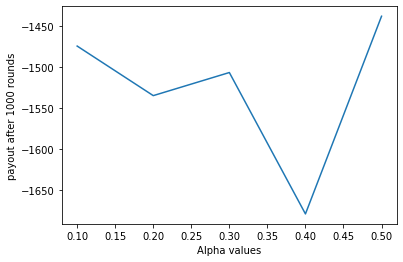

In [176]:
plt.plot(epsilon_values,epoch_vs_epsilon)
plt.xlabel('epsilon values')
plt.ylabel('After 100 rounds')
plt.show()

The optimal value for epsilon is 0.50

In [178]:
gamma_values = [0.2,0.4,0.6,0.8,1]
epoch_vs_gamma=[]
for g in gamma_values:
    steps, s_rewards, Q = rummy.train( rummy_env,
                                   gamma=g, 
                                   alpha=0.3, 
                                   epsilon=0.5, 
                                   maxiter=20, 
                                   maxstep=100)
    epoch_vs_gamma.append(sum(s_rewards)/len(s_rewards))

**********************************
		Game Starts : 0
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 6S, 4H
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 7D, 6S, 4H, 6H
State  [7, 6, 4, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 4H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 4H, 6H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 4H, 6H, AH
State  [6, 4, 6, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 6H, AH
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 6H, AH
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 6H, AH, 3C
State  [6, 6, 1, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 6H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 6H, 3C
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 6H, 3C,

Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 6D, 3D, 6S
State  [2, 6, 3, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 6S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6D, 3D, 6S, 5C
State  [6, 3, 6, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 6S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 6S, 5C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6D, 6S, 5C, 3D
State  [6, 6, 5, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5C, 3D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 5C, 3D, 7H
State  [6, 5, 3, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 3D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S,

p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 3H, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 3H, AH
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 3H, AH, AS
State  [5, 3, 1, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 7 
 Stash : 5D, AH, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 5D, AH, AS
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, AS, 3H
State  [5, 1, 1, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 5 
 Stash : AH, AS, 3H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AH, AS, 3H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AH, AS, 3H, 5D
State  [1, 1, 3, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 3H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 3H, 5D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AS, 3H, 5D, 7H
State  [1, 3, 5, 7]


Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3C, 3D, AD
State  [1, 3, 3, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3C, AD
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3C, AD
Card in pile D3
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 28
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 7H, 4C
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7H, 4C, 2S
State  [2, 7, 4, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 4C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 4C, 2S
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 4C, 2S, 3C
State  [2, 4, 2, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 2S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 2S, 3C

 Stash : 2D, 5H, AH
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 5H, AH, 6C
State  [2, 5, 1, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, AH, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, AH, 6C
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, AH, 6C, 3C
State  [5, 1, 6, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6C, 3C
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 6C, 3C, 6S
State  [5, 6, 3, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 3C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 3C, 6S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 3C, 6S, 6C
State  [5, 3, 6, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 6S, 6C
p3 Plays
Player Name : p3 
 Stash Sco

Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 5S, 6C, 2S
State  [1, 5, 6, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 6C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 6C, 2S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 6C, 2S, AH
State  [5, 6, 2, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2S, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2S, AH
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 2S, AH, 5S
State  [6, 2, 1, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, AH, 5S
**********************************
		Game Starts : 43
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, AH, 3S
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AH, 3S, 4H
State  [3, 1, 3, 4]
p3 drops card 3S
Player Name : p3 
 Stash Sc

 Stash : 2S, 5S, 7D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, 5S, 7D, 2C
State  [2, 5, 7, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 7D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 7D, 2C
Card in pile S5
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 50
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4S, 2S, 2H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 2S, 2H, 3S
State  [4, 2, 2, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 2H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 2H, 3S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 2H, 3S, 3C
State  [4, 2, 3, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, 3S, 3C
p3 Plays
Player Name : p3 
 Stash Score:

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 4C, 5D
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 4C, 5D, 3H
State  [1, 4, 5, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 5D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 5D, 3H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 5D, 3H, AC
State  [4, 5, 3, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 3H, AC
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 3H, AC, 4C
State  [5, 3, 1, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, AC, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, AC, 4C
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, AC, 4C, 7S
State  [3, 1, 4, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AC,

p3 drops card 5H
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 2C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 2C, 5S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 2C, 5S, 3D
State  [2, 2, 5, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 5S, 3D, 7H
State  [2, 5, 3, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3D, 7H
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 3D, 7H, 4S
State  [2, 3, 7, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 3D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 3D, 4S
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 3D, 4S, 4C
State  [2, 3, 4,

p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 4C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 4C, 6D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5D, 4C, 6D, 7C
State  [5, 4, 6, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6D, 7C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4C, 6D, 7C, 5C
State  [4, 6, 7, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 7C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 7C, 5C
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 4C, 7C, 5C, 5S
State  [4, 7, 5, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 5C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 5C, 5S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 5C, 5S, 3C
State  [4, 5

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AH, 4D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, AH, 4D, 5D
State  [6, 1, 4, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 4D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 4D, 5D
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 4D, 5D, AH
State  [6, 4, 5, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5D, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5D, AH
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 5D, AH, 4S
State  [4, 5, 1, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, AH, 4S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, AH, 4S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, AH, 4S, 3S
State  [4, 1, 4, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 4

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 2C, 4H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 2C, 4H, AC
State  [5, 2, 4, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, 4H, AC
**********************************
		Game Starts : 86
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 4S, 5D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 4S, 5D, 3D
State  [7, 4, 5, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 5D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 5D, 3D
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 5D, 3D, 4S
State  [7, 5, 3, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 3D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 3D, 4S
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 3D, 4S,

Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 5H, 2H
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 5H, 2H, 4D
State  [5, 5, 2, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 2H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 2H, 4D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 2H, 4D, 5H
State  [5, 2, 4, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4D, 5H
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4D, 5H, 2D
State  [2, 4, 5, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 5H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 5H, 2D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 5H, 2D, 6S
State  [2, 5, 2, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6S
p3 

State  [1, 3, 2, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 4 
 Stash : AH, 2S, AS
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AH, 2S, AS
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 2S, AS, 5D
State  [1, 2, 1, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 7 
 Stash : AH, AS, 5D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, AS, 5D
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : AH, AS, 5D, 2S
State  [1, 1, 5, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 5D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 5D, 2S
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 5D, 2S, 3H
State  [1, 5, 2, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 5D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 5D, 3H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 5D, 3H, AD
St

Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 2S, 6C, 2D
State  [3, 2, 6, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 6C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 6C, 2D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 6C, 2D, 3S
State  [2, 6, 2, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 2D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 2D, 3S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 2D, 3S, 6H
State  [6, 2, 3, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 3S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 3S, 6H
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 3S, 6H, 4H
State  [6, 3, 6, 4]
p3 drops card 3S
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 6H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 3H, 3C
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, 3H, 3C, 2H
State  [5, 3, 3, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 5H, 3H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5H, 3H, 2H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, 3H, 2H, 3C
State  [5, 3, 2, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 2H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 2H, 3C
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 2H, 3C, 6H
State  [3, 2, 3, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 3C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 3C, 6H
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 3C, 6H, 2H
State  [3, 3, 6, 2]
p3 drops card 3H
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 6

 Stash : 5S, 7C, 7H, 4C
State  [5, 7, 7, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 7H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 7H, 4C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7C, 7H, 4C, 5C
State  [7, 7, 4, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 4C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 4C, 5C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 4C, 5C, AS
State  [7, 4, 5, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 5C, AS
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 5C, AS
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5C, AS, 6S
State  [7, 5, 1, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, AS, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, AS, 6S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Sco

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, AC, 3H
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, AC, 3H, 4C
State  [7, 1, 3, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 3H, 4C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 3H, 4C, 5D
State  [1, 3, 4, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 4C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 4C, 5D
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 4C, 5D, 3H
State  [1, 4, 5, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 5D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 5D, 3H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 5D, 3H, AC
State  [4, 5, 3, 1]
p3 drops card 4C
Player Name : 

p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AS, 3S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AD, AS, 3S, 6C
State  [1, 1, 3, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3S, 6C
Card in pile DA
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : AS, 3S, 6C, 6S
State  [1, 3, 6, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3S, 6S
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AS, 3S, 6S, 7S
State  [1, 3, 6, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 3S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 3S, 7S
Card in pile S6
p3 takes action 2
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 3S, 7S, 2C
State  [1, 3, 7, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 3

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, AH, 2S
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AH, 2S, 2D
State  [6, 1, 2, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, AH, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, AH, 2D
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, AH, 2D, 6S
State  [6, 1, 2, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, AH, 6S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, AH, 6S
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, AH, 6S, 2D
State  [6, 1, 6, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 6S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 6S, 2D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 6S, 2D, 6H
State  [1, 6, 2, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 2D, 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 6S, 4S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3H, 6S, 4S, 5H
State  [3, 6, 4, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 4S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 4S, 5H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 4S, 5H, 5S
State  [6, 4, 5, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 5H, 5S, 4S
State  [6, 5, 5, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 5S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 5S, 4S
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 5S, 4S, 6S
State  [5, 5, 4, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 15 
 Stash : 5S,

State  [3, 6, 4, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 4H, AS
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 4H, AS
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 4H, AS, 3D
State  [6, 4, 1, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AS, 3D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AS, 3D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, AS, 3D, 6H
State  [4, 1, 3, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 3D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 3D, 6H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 3D, 6H, AS
State  [4, 3, 6, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 6H, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 6H, AS
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 6H, A

p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AC, AH, 2S
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, AH, 2S, 7H
State  [1, 1, 2, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 2S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 2S, 7H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 2S, 7H, AD
State  [1, 2, 7, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 7H, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 7H, AD
Card in pile S2
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 7H, AD, 5D
State  [1, 7, 1, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7H, 5D
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AC, 7H, 5D, 5C
State  [1, 7, 5, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5D

State  [5, 3, 4, 3]
p3 drops card 3H
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4C, 3D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 4C, 3D, 3C
State  [5, 4, 3, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 3D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 3D, 3C
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 3D, 3C, 4C
State  [5, 3, 3, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 3C, 4C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 3C, 4C, AD
State  [3, 3, 4, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 4C, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 4C, AD
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 4C, AD

Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7D, 4S, 7S, 3C
State  [7, 4, 7, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 7S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 7S, 3C
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 4S, 7S, 3C, 7D
State  [4, 7, 3, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 3C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 3C, 7D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 3C, 7D, 5S
State  [7, 3, 7, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 7D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 7D, 5S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 7D, 5S, 3C
State  [7, 7, 5, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 5S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D,

p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 4C, 4S, 7H
State  [6, 4, 4, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 4S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 4S, 7H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 4S, 7H, 5D
State  [6, 4, 7, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7H, 5D
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 7H, 5D, 4S
State  [6, 7, 5, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 5D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 5D, 4S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 5D, 4S, AH
State  [7, 5, 4, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 4S, AH
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 4S, AH
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 3D, 7H
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AC, 3D, 7H, 6H
State  [1, 3, 7, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3D, 6H
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 3D, 6H, AH
State  [1, 3, 6, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3D, AH
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3D, AH
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3D, AH, 5S
State  [1, 3, 1, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 7 
 Stash : AC, AH, 5S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AC, AH, 5S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AC, AH, 5S, 3D
State  [1, 1, 5, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 5S, 

State  [4, 6, 6, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 6D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 6D, 4H
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 6D, 4H, 2S
State  [6, 6, 4, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 6D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 6D, 2S
Card in pile H4
p3 takes action 2
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 6D, 2S, 7H
State  [6, 6, 2, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 6D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 6D, 7H
Card in pile S2
p3 takes action 2
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 97
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 4D, 2C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 4D,

State  [6, 4, 3, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 3H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 3H, 7D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 3H, 7D, 4H
State  [6, 3, 7, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 7D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 7D, 4H
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 7D, 4H, 3H
State  [6, 7, 4, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4H, 3H
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 4H, 3H, 3C
State  [7, 4, 3, 3]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 3H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 3H, 3C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 3H,

Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7D, 6D, 5D, 3C
State  [7, 6, 5, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 5D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 5D, 3C
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 5D, 3C, 4H
State  [6, 5, 3, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3C, 4H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 3C, 4H, 5D
State  [6, 3, 4, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4H, 5D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 4H, 5D, 2S
State  [3, 4, 5, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C,

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 5C, 7C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6H, 5C, 7C, 4S
State  [6, 5, 7, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 7C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 7C, 4S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 7C, 4S, 2S
State  [6, 7, 4, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 4S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 4S, 2S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 4S, 2S, 7C
State  [6, 4, 2, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 2S, 7C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 2S, 7C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 2S, 7C, 2C
State  [4, 2, 7, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 4S,

State  [7, 5, 2, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 2C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 2C, 6S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5S, 2C, 6S, 7C
State  [5, 2, 6, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6S, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6S, 7C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 2C, 6S, 7C, 5S
State  [2, 6, 7, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7C, 5S
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 7C, 5S, 2C
State  [6, 7, 5, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 5S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 5S, 2C
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 5S,

 Stash : 4C, AC, 4S, 6S
State  [4, 1, 4, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 4S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 4S, 6S
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 4S, 6S, 2H
State  [4, 4, 6, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 6S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 6S, 2H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6S, 2H, 3D
State  [4, 6, 2, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 2H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 2H, 3D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 2H, 3D, 6S
State  [4, 2, 3, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3D, 6S
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 7D, AH
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 7D, AH, 2D
State  [2, 7, 1, 2]
p3 drops card 2H
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, AH, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, AH, 2D
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AH, 2D, 2H
State  [7, 1, 2, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 5 
 Stash : AH, 2D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AH, 2D, 2H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 2D, 2H, 4D
State  [1, 2, 2, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 2H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 2H, 4D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 2H, 4D, 4C
State  [1, 2, 4, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4D, 4

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 7S, 6C
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 7S, 6C, AD
State  [2, 7, 6, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 6C, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 6C, AD
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 6C, AD, 7S
State  [2, 6, 1, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, AD, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, AD, 7S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, AD, 7S, 2H
State  [6, 1, 7, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 7S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 7S, 2H
Card in pile C6
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 7S, 2H, 7D
State  [1, 7, 2, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7

p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 5H, 5C, 7H, 4H
State  [5, 5, 7, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 7H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 7H, 4H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 7H, 4H, 4S
State  [5, 7, 4, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, 4H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, 4H, 4S
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5H, 4H, 4S, 6S
State  [5, 4, 4, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 4S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 4S, 6S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 4S, 6S, 3S
State  [5, 4, 6, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 6S, 3S
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6D, 5H
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 6D, 5H, 4H
State  [2, 6, 5, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 5H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 5H, 4H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 5H, 4H, 2D
State  [6, 5, 4, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 4H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 4H, 2D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 4H, 2D, AC
State  [5, 4, 2, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 8 
 Stash : 5H, 2D, AC
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5H, 2D, AC
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 2D, AC, 4H
State  [5, 2, 1, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AC

Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 3S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 3S, 5D
Card in pile C4
p3 takes action 2
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 3S, 5D, AS
State  [5, 3, 5, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, 3S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, 3S, AS
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 3S, AS, 5D
State  [5, 3, 1, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AS, 5D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AS, 5D
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, AS, 5D, 5C
State  [3, 1, 5, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 5D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 5D, 5C
Card in pile S3
p3 takes action 2
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
******************************

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, AC, 6S
Card in pile D3
p3 takes action 2
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, AC, 6S, 7S
State  [6, 1, 6, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AC, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AC, 7S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, AC, 7S, 6C
State  [6, 1, 7, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 7S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 7S, 6C
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 6H, 7S, 6C, 5C
State  [6, 7, 6, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 6C, 5C
**********************************
		Game Starts : 74
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 3H, 3C
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 3H, 3C

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6C, 7C
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 5S, 6C, 7C, 7D
State  [5, 6, 7, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7C, 7D
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 6C, 7C, 7D, 5S
State  [6, 7, 7, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 7D, 5S
**********************************
		Game Starts : 79
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 7H, 3C
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 7H, 3C, 2H
State  [1, 7, 3, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 3C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 3C, 2H
Card in pile H7
p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 3C, 2H, 3

p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 3S, 2H, 3C
State  [7, 3, 2, 3]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2H, 3C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 2H, 3C, 5S
State  [7, 2, 3, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 3C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 3C, 5S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3C, 5S, AC
State  [7, 3, 5, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5S, AC
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5S, AC
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 5S, AC, 2C
State  [7, 5, 1, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 10 
 Stash : 7S, AC, 2C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7S, AC, 2C
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 4C, 5D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 4C, 5D, 7C
State  [1, 4, 5, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5D, 7C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 5D, 7C, 4S
State  [4, 5, 7, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 7C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 7C, 4S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 7C, 4S, AS
State  [4, 7, 4, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 4S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 4S, AS
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 4S, AS, 2S
State  [4, 4, 1, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 7 
 Stash : 4C, AS

Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, AH, 6C, 4S
State  [6, 1, 6, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 6C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 6C, 4S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6D, 6C, 4S, 7D
State  [6, 6, 4, 7]
p3 drops card 6C
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 4S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 4S, 7D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 6D, 4S, 7D, 6C
State  [6, 4, 7, 6]
p3 drops card 6D
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 7D, 6C
**********************************
		Game Starts : 4
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 3D, 4C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 3D, 4C, 4H
State  [7, 3, 4, 4]
p3 drops card 7H
Player Name : p3 
 Stash

 Stash : 6S, 3C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 3C, 6H
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 3C, 6H, 3D
State  [6, 3, 6, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6H, 3D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 6H, 3D, 6S
State  [3, 6, 3, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 3D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 3D, 6S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 3D, 6S, 3C
State  [6, 3, 6, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 6S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 6S, 3C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 6S, 3C, 7C
State  [3, 6, 3, 7]
p3 drops card 6S
Player Name : p3 
 Stash Sco

 Stash : 4D, 2D, 5H
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 2D, 5H, 4H
State  [4, 2, 5, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 5H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 5H, 4H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 5H, 4H, 6D
State  [2, 5, 4, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 4H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 4H, 6D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 4H, 6D, 5S
State  [2, 4, 6, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6D, 5S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 2D, 6D, 5S, 7C
State  [2, 6, 5, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 5S, 7C
p3 Plays
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6S, 7D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 5D, 6S, 7D, 7C
State  [5, 6, 7, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 7D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 7D, 7C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 6S, 7D, 7C, 5D
State  [6, 7, 7, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 7C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 7C, 5D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7D, 7C, 5D, 5H
State  [7, 7, 5, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 5D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 5D, 5H
Card in pile C7
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 26
****************************

Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 4C, 5H, 5D, 7D
State  [4, 5, 5, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 5D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 5D, 7D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 5D, 7D, 3D
State  [5, 5, 7, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 7D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 7D, 3D
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 7D, 3D, 2D
State  [5, 7, 3, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 5H, 3D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5H, 3D, 2D
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 3D, 2D, 7C
State  [5, 3, 2, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 2D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 7H, 6D
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 7H, 6D, AC
State  [2, 7, 6, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6D, AC
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6D, AC
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 6D, AC, 2H
State  [7, 6, 1, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, AC, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, AC, 2H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, AC, 2H, 6C
State  [6, 1, 2, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 2H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 2H, 6C
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 2H, 6C, AC
State  [6, 2, 6, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 6C

 Stash : 2S, 4D, 3H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 4D, 3H, 6H
State  [2, 4, 3, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 3H, 6H, 2D
State  [2, 3, 6, 2]
p3 drops card 3H
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 6H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 6H, 2D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 6H, 2D, 3C
State  [2, 6, 2, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2D, 3C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 2D, 3C, 6C
State  [2, 2, 3, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score

Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 6D, 5C, AC
State  [5, 6, 5, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 5C, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 5C, AC
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 5C, AC, 5D
State  [6, 5, 1, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, AC, 5D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, AC, 5D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, AC, 5D, 6D
State  [5, 1, 5, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5D, 6D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 5D, 6D, AD
State  [1, 5, 6, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 6D, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 6D, AD
Card in pile D5
p3 takes act

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4S, 3D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 4S, 3D, 7S
State  [5, 4, 3, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3D, 7S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 4S, 3D, 7S, 7C
State  [4, 3, 7, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 7S, 7C
**********************************
		Game Starts : 65
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2D, AS
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 2D, AS, 2H
State  [6, 2, 1, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 5 
 Stash : 2D, AS, 2H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2D, AS, 2H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, AS, 2H, 6

State  [7, 2, 5, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 5S, 3H, AH
State  [2, 5, 3, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, 3H, AH
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, 3H, AH
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 3H, AH, 4D
State  [2, 3, 1, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 3H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 3H, 4D
Card in pile HA
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 3H, 4D, 6H
State  [2, 3, 4, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 3H, 6H
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 3H, 6H,

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3C, 2S
Card in pile S5
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3C, 2S, 5C
State  [2, 3, 2, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 3C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 3C, 5C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3C, 5C, 2S
State  [2, 3, 5, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5C, 2S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 5C, 2S, 3H
State  [3, 5, 2, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 2S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 2S, 3H
Card in pile C5
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 79
*******************************

 Stash : 4D, 5H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 5H, 7S
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 5H, 7S, AD
State  [4, 5, 7, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 7S, AD
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 7S, AD
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 7S, AD, 5H
State  [4, 7, 1, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AD, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AD, 5H
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, AD, 5H, 4D
State  [7, 1, 5, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 5H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 5H, 4D
Card in pile S7
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 5H, 4D, 2C
State  [1, 5, 4, 2]
p3 drops card 4D
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 2C, 5D
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 2C, 5D, 4D
State  [1, 2, 5, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 5D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 5D, 4D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 5D, 4D, 7D
State  [2, 5, 4, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4D, 7D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 4D, 7D, 5D
State  [2, 4, 7, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 7D, 5D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 4D, 7D, 5D, 7H
State  [4, 7, 5, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 

State  [3, 4, 1, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 7 
 Stash : 4C, AC, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4C, AC, 2S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, AC, 2S, 3D
State  [4, 1, 2, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 2S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 2S, 3D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 2S, 3D, 7H
State  [1, 2, 3, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 3D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 3D, 7H
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 3D, 7H, 2S
State  [1, 3, 7, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7H, 2S
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7H, 2S,

p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AD, AC, 3S, 7D
State  [1, 1, 3, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3S, 7D
Card in pile CA
p3 takes action 2
Player Name : p3 
 Stash Score: 18 
 Stash : AD, 3S, 7D, 7H
State  [1, 3, 7, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3S, 7H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 3S, 7H, 4C
State  [1, 3, 7, 4]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 7H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 7H, 4C
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7H, 4C, 3S
State  [1, 7, 4, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 4C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 4C, 3S
Card in 

Card in pile D2
p3 takes action 2
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, AC, 2C, 3H
State  [6, 1, 2, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AC, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AC, 3H
Card in pile C2
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AC, 3H, AH
State  [6, 1, 3, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AC, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6C, AC, AH
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, AC, AH, 5H
State  [6, 1, 1, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, AH, 5H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, AH, 5H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, AH, 5H, AS
State  [6, 1, 5, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 5H, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 5

State  [1, 7, 3, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, 3D, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, 3D, AC
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 3D, AC, 5C
State  [7, 3, 1, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, AC, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, AC, 5C
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, AC, 5C, 4C
State  [7, 1, 5, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 5C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 5C, 4C
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 5C, 4C, 5D
State  [7, 5, 4, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 4C, 5D
**********************************
		Game Starts : 18
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 2D,

State  [2, 1, 6, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6D, 3C
**********************************
		Game Starts : 26
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 6H, 5H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 6H, 5H, 4C
State  [5, 6, 5, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 5H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 5H, 4C
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 5H, 4C, 6H
State  [5, 5, 4, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 4C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 4C, 6H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 4C, 6H, 5C
State  [5, 4, 6, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6H,

 Stash : 4S, 4D, AS, 2H
State  [4, 4, 1, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, AS, 2H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, AS, 2H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AS, 2H, 4S
State  [4, 1, 2, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 7 
 Stash : AS, 2H, 4S
**********************************
		Game Starts : 34
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 3D, 7C
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 3D, 7C, 3S
State  [6, 3, 7, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7C, 3S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 7C, 3S, 3D
State  [6, 7, 3, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 3S, 3D
p3 Plays
Player Name : p3 
 Stash Score:

Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 3H, 4C, 5H
State  [7, 3, 4, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 4C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 4C, 5H
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3H, 4C, 5H, 7H
State  [3, 4, 5, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5H, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5H, 7H
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4C, 5H, 7H, 3H
State  [4, 5, 7, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 7H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 7H, 3H
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5H, 7H, 3H, 4C
State  [5, 7, 3, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 3H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H,

p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 3D, 4S, 7D
State  [5, 3, 4, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 4S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 4S, 7D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 4S, 7D, 5D
State  [3, 4, 7, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7D, 5D
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 7D, 5D, AS
State  [4, 7, 5, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, 5D, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4S, 5D, AS
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 5D, AS, 2D
State  [4, 5, 1, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 7 
 Stash : 4S, AS, 2D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4S, AS, 2D
Card in pi

State  [2, 6, 5, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 5C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 5C, 5S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 5C, 5S, 2H
State  [6, 5, 5, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 5S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 5S, 2H
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 5S, 2H, 6C
State  [5, 5, 2, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 2H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 2H, 6C
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 2H, 6C, 2S
State  [5, 2, 6, 2]
p3 drops card 2H
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 6C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 6C, 2S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6C,

Player Name : p3 
 Stash Score: 10 
 Stash : 3S, AC, 6H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, AC, 6H, 4H
State  [3, 1, 6, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 6H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 6H, 4H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 6H, 4H, AC
State  [3, 6, 4, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 4H, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 4H, AC
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 4H, AC, 3S
State  [6, 4, 1, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AC, 3S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AC, 3S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, AC, 3S, 6H
State  [4, 1, 3, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3S, 6H
p3 

p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, 6D, 6C, 3S
State  [3, 6, 6, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 6C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 6C, 3S
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 6C, 3S, 4C
State  [6, 6, 3, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3S, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 3S, 4C
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 3S, 4C, 5S
State  [6, 3, 4, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4C, 5S
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 4C, 5S, 3S
State  [6, 4, 5, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 5S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 5S, 3S
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, AH, 7S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AS, AH, 7S, 5H
State  [1, 1, 7, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7S, 5H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 7S, 5H, AS
State  [1, 7, 5, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5H, AS
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5H, AS
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 5H, AS, 3H
State  [7, 5, 1, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, AS, 3H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, AS, 3H
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, AS, 3H, AC
State  [7, 1, 3, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4H, 3C
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 4H, 3C, 5H
State  [7, 4, 3, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 3C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 3C, 5H
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 3C, 5H, 7D
State  [4, 3, 5, 7]
p3 drops card 4H
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 5H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 5H, 7D
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3C, 5H, 7D, 4H
State  [3, 5, 7, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 7D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 7D, 4H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5H, 7D, 4H, 3C
State  [5, 7, 4, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 14 
 Stash : 7D,

 Stash : 6D, AS, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6D, AS, 3C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, AS, 3C, 2H
State  [6, 1, 3, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 3C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 3C, 2H
Card in pile D6
p3 takes action 2
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3C, 2H, 4C
State  [1, 3, 2, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3C, 4C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 3C, 4C, 2H
State  [1, 3, 4, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 4C, 2H
**********************************
		Game Starts : 92
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 6S, 6H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Sta

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 7H, AD
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 7H, AD, 2H
State  [1, 7, 1, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, AD, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, AD, 2H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, AD, 2H, 7C
State  [7, 1, 2, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 2H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 2H, 7C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 2H, 7C, 5H
State  [7, 2, 7, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 7C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 7C, 5H
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 7C, 5H, 2H
State  [7, 7, 5, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 

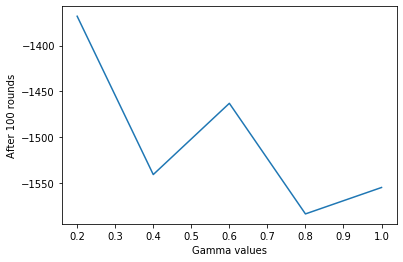

In [179]:
plt.plot(gamma_values,epoch_vs_gamma)
plt.xlabel('Gamma values')
plt.ylabel('After 100 rounds')
plt.show()

The Gamma value 0.6 looks good from the above graph.

## Reading and analysis of learning results and plots

#### Retrain Model with optimal hyper-parameters

The model is re-trained on the optimal values selected from the above graphs.
**THE FINAL MODEL **
The final values for hyper-parameters will be:<br>
alpha = 0.3 <br>
gamma = 0.6 <br>
epsilon = 0.5<br>

In [180]:
steps, s_rewards, Q = rummy.train( rummy_env,
                                   gamma=0.6, 
                                   alpha=0.3, 
                                   epsilon=0.5, 
                                   maxiter=20, 
                                   maxstep=1000)

**********************************
		Game Starts : 0
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4S, 7D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 2H, 4S, 7D, 6C
State  [2, 4, 7, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 7D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 7D, 6C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 2H, 7D, 6C, 7H
State  [2, 7, 6, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6C, 7H
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 2H, 6C, 7H, 7D
State  [2, 6, 7, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7H, 7D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6C, 7H, 7D,

 Stash : AD, 3C, 4D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 3C, 4D, 2C
State  [1, 3, 4, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 4D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 4D, 2C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 4D, 2C, 4H
State  [1, 4, 2, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2C, 4H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 2C, 4H, 4C
State  [1, 2, 4, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 4H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 4H, 4C
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 4H, 4C, 6C
State  [1, 4, 4, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 4C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 11

State  [6, 4, 1, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, AS, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, AS, 6D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, AS, 6D, 6H
State  [4, 1, 6, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6D, 6H, AD
State  [1, 6, 6, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6H, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6H, AD
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6H, AD, 2H
State  [1, 6, 1, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 4 
 Stash : AS, AD, 2H
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AS, AD, 2H
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AS, AD, 2H,

Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 7S, 5C, AC
State  [5, 7, 5, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5C, AC
**********************************
		Game Starts : 23
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2D, AS
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2D, AS, 5C
State  [4, 2, 1, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, AS, 5C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, AS, 5C
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, AS, 5C, 5D
State  [4, 1, 5, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 5C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 5C, 5D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, 5C, 5D, 4C
State  [4, 5, 5, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 5D, 4C
p3

 Stash : AS, 3C, 7D, 6C
State  [1, 3, 7, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 7D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 7D, 6C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 3C, 7D, 6C, 6D
State  [3, 7, 6, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 6C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 6C, 6D
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 6C, 6D, AD
State  [3, 6, 6, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6D, AD
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6D, AD
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 6D, AD, 6C
State  [3, 6, 1, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AD, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AD, 6C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Sco

p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4S, 3S, 2C
State  [6, 4, 3, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 3S, 2C
**********************************
		Game Starts : 37
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 6C, 4S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 6C, 4S, 5H
State  [2, 6, 4, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4S, 5H
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 4S, 5H, 6S
State  [6, 4, 5, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 5H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 5H, 6S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 5H, 6S, 4S
State  [6, 5, 6, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Sta

p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 2H, 7D, 3H, 6H
State  [2, 7, 3, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3H, 6H
Card in pile D7
p3 takes action 2
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 3H, 6H, 5D
State  [2, 3, 6, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3H, 5D
Card in pile H6
p3 takes action 2
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 3H, 5D, AC
State  [2, 3, 5, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3H, AC
Card in pile D5
p3 takes action 2
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3H, AC, 3C
State  [2, 3, 1, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, 3H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, 3H, 3C
Card in pile 

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 7H, 3S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 7H, 3S, 5S
State  [6, 7, 3, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 3S, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 3S, 5S
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 3S, 5S, 6S
State  [7, 3, 5, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 5S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 5S, 6S
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3S, 5S, 6S, 7H
State  [3, 5, 6, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6S, 7H
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5S, 6S, 7H, 3S
State  [5, 6, 7, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 16 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, AH, 5D
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, AH, 5D, 2S
State  [5, 1, 5, 2]
p3 drops card 5H
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 5D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 5D, 2S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 5D, 2S, AC
State  [1, 5, 2, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 4 
 Stash : AH, 2S, AC
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AH, 2S, AC
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 2S, AC, 2C
State  [1, 2, 1, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 4 
 Stash : AH, AC, 2C
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AH, AC, 2C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 7 
 Stash : AH, AC, 2C, 3S
State  [1, 1, 2, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 2C, 3S
p3

 Stash : 4S, 5S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 5S, 6S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4S, 5S, 6S, 5H
State  [4, 5, 6, 5]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6S, 5H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4S, 6S, 5H, 5S
State  [4, 6, 5, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5S
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5H, 5S, AS
State  [6, 5, 5, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5S, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5S, AS
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 5S, AS, 3C
State  [6, 5, 1, 3]
p3 drops card 5S
Player Name : p3 
 Stash Sco

Player Name : p3 
 Stash Score: 9 
 Stash : 4H, 3D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4H, 3D, 2H
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 3D, 2H, 5D
State  [4, 3, 2, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 2H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 2H, 5D
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 2H, 5D, 5S
State  [4, 2, 5, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 5D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 5D, 5S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 5D, 5S, 2H
State  [4, 5, 5, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 5S, 2H
**********************************
		Game Starts : 68
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3C, 4C
Card in pile HA
p3 takes action 2
Pl

State  [2, 6, 1, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AH, 4C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AH, 4C
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, AH, 4C, 6C
State  [2, 1, 4, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 4C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 4C, 6C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 4C, 6C, AH
State  [2, 4, 6, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 6C, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 6C, AH
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 6C, AH, 3C
State  [4, 6, 1, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : 4C, AH, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4C, AH, 3C
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, AH, 3C,

State  [3, 5, 6, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 6D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 6D, 4H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6D, 4H, 3C
State  [5, 6, 4, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 4H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 4H, 3C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 4H, 3C, 5D
State  [6, 4, 3, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 3C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 3C, 5D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 3C, 5D, 3S
State  [4, 3, 5, 3]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 5D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 5D, 3S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5D,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 5D, AC
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 5D, AC, 3S
State  [5, 5, 1, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : 5H, AC, 3S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5H, AC, 3S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, AC, 3S, 5D
State  [5, 1, 3, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 3S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 3S, 5D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 3S, 5D, 5H
State  [1, 3, 5, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5D, 5H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 5D, 5H, AC
State  [3, 5, 5, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 5H,

 Stash : 2S, 4D, 4C, 5D
State  [2, 4, 4, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 4C, 5D
**********************************
		Game Starts : 90
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 3S, 4S
Card in pile H2
p3 takes action 2
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 3S, 4S, 3H
State  [5, 3, 4, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 3S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 3S, 3H
Card in pile S4
p3 takes action 2
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 3S, 3H, 6D
State  [5, 3, 3, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3S, 6D
Card in pile H3
p3 takes action 2
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 3S, 6D, 5H
State  [5, 3, 6, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 3S, 5H
p3 Plays
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 7D, 6C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 2C, 7D, 6C, 6D
State  [2, 7, 6, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 6C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 6C, 6D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 6C, 6D, 3H
State  [7, 6, 6, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 6D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 6D, 3H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 6D, 3H, 4S
State  [7, 6, 3, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 3H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 3H, 4S
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3H, 4S, AH
State  [7, 3, 4, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 12 
 Stash : 7D,

In [181]:
steps, s_rewards, Q = rummy.train( rummy_env,
                                   gamma=0.3, 
                                   alpha=0.7, 
                                   epsilon=0.6, 
                                   maxiter=20, 
                                   maxstep=1000)

**********************************
		Game Starts : 0
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 3D, 6C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 3D, 6C, 7H
State  [6, 3, 6, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 6C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 6C, 7H
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 3D, 6C, 7H, 6S
State  [3, 6, 7, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7H, 6S
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7H, 6S, AS
State  [6, 7, 6, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 6S, AS
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 6S, AS
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 6S, AS,

State  [3, 7, 6, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 6H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 6H, 2C
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 6H, 2C, 2S
State  [3, 6, 2, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 2C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 2C, 2S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 2C, 2S, 6H
State  [3, 2, 2, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 2S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 2S, 6H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2C, 2S, 6H, 7C
State  [2, 2, 6, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6H, 7C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2C, 6H, 7

Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 7S, 6S, 3H
State  [1, 7, 6, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 6S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 6S, 3H
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 6S, 3H, AD
State  [7, 6, 3, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 6S, 3H, AD
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6S, 3H, AD
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 3H, AD, 7S
State  [6, 3, 1, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AD, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AD, 7S
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, AD, 7S, 6S
State  [3, 1, 7, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 7S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AD,

Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 6D, 4S, 3D
State  [7, 6, 4, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 4S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 4S, 3D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 4S, 3D, AH
State  [7, 4, 3, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3D, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3D, AH
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 3D, AH, 2H
State  [7, 3, 1, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, AH, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, AH, 2H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, AH, 2H, 5S
State  [7, 1, 2, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 2H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C,

Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3C, 7H, 5H, 4H
State  [3, 7, 5, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 5H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 5H, 4H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 5H, 4H, 3C
State  [7, 5, 4, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 4H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 4H, 3C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 4H, 3C, 6S
State  [5, 4, 3, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 3C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 3C, 6S
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 3C, 6S, 4H
State  [5, 3, 6, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 6S, 4H
**********************************
		Game Starts : 33
***

State  [7, 6, 6, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 6H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 6H, 3C
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 6H, 3C, 6S
State  [7, 6, 3, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 3C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 3C, 6S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 6H, 3C, 6S, 7D
State  [6, 3, 6, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 6S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 6S, 7D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 3C, 6S, 7D, 6H
State  [3, 6, 7, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 7D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 7D, 6H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 7D,

State  [6, 3, 7, 4]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7C, 4D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 7C, 4D, 2D
State  [6, 7, 4, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 4D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 4D, 2D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 4D, 2D, 5D
State  [6, 4, 2, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 2D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 2D, 5D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 2D, 5D, AD
State  [6, 2, 5, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5D, AD
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5D, AD
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 5D,

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 4S, AH
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 4S, AH, AS
State  [3, 4, 1, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 5 
 Stash : 3C, AH, AS
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 3C, AH, AS
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, AH, AS, 4S
State  [3, 1, 1, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 6 
 Stash : AH, AS, 4S
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AH, AS, 4S
Card in pile C3
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 55
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 7C, 6D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4C, 7C, 6D, 2H
State  [4, 7, 6, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 6D, 2H

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3D, 6C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 3D, 6C, 2H
State  [6, 3, 6, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 6C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 6C, 2H
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 6C, 2H, 6H
State  [3, 6, 2, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 2H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 2H, 6H
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 2H, 6H, 6C
State  [3, 2, 6, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 6H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 6H, 6C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 6H, 6C, 3D
State  [2, 6, 6, 3]
p3 drops card 2H
Player Name 

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 7D, 2C
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 7D, 2C, 2D
State  [5, 7, 2, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 9 
 Stash : 5H, 2C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5H, 2C, 2D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 2C, 2D, 7D
State  [5, 2, 2, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 2D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 2D, 7D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, 2D, 7D, 5H
State  [2, 2, 7, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 7D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 7D, 5H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 2D, 7D, 5H, 5C
State  [2, 7, 5, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 5

p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 6S, 7H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 26 
 Stash : 7C, 6S, 7H, 6C
State  [7, 6, 7, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 7H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 7H, 6C
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 7H, 6C, AD
State  [7, 7, 6, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 6C, AD
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 6C, AD
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 6C, AD, 2H
State  [7, 6, 1, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, AD, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, AD, 2H
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, AD, 2H, 6C
State  [7, 1, 2, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 

State  [5, 2, 4, 7]
p3 drops card 2C
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 4D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 4D, 7H
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 4D, 7H, 2C
State  [5, 4, 7, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 7H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 7H, 2C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, 7H, 2C, 5C
State  [4, 7, 2, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 2C, 5C
**********************************
		Game Starts : 79
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 6C, 3H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 6C, 3H, 7D
State  [4, 6, 3, 7]
p3 drops card 6C
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 3H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 3H,

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 5D, 7S
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5S, 5D, 7S, 4H
State  [5, 5, 7, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 7S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 7S, 4H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 7S, 4H, 5S
State  [5, 7, 4, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 4H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 4H, 5S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 4H, 5S, 6H
State  [7, 4, 5, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5S, 6H
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 5S, 6H, 4H
State  [7, 5, 6, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 5S,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4S, 6H
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 4S, 6H, AS
State  [3, 4, 6, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6H, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6H, AS
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 6H, AS, 5C
State  [3, 6, 1, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, AS, 5C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, AS, 5C
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, AS, 5C, 6H
State  [3, 1, 5, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 5C, 6H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 5C, 6H, 3C
State  [1, 5, 6, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 6

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 7C, 3D
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7H, 7C, 3D, 5S
State  [7, 7, 3, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3D, 5S
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 3D, 5S, 7H
State  [7, 3, 5, 7]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 5S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 5S, 7H
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 3D, 5S, 7H, 7C
State  [3, 5, 7, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 7H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 7H, 7C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5S, 7H, 7C, 3D
State  [5, 7, 7, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 17 
 Stash : 7H,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 7C, 3C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 7C, 3C, 5C
State  [5, 7, 3, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3C, 5C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 3C, 5C, 5D
State  [7, 3, 5, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 5C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 5C, 5D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 5C, 5D, 4H
State  [3, 5, 5, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 5D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 5D, 4H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 5D, 4H, 5C
State  [3, 5, 4, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 5D,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 5D, 6H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 2C, 5D, 6H, 7S
State  [2, 5, 6, 7]
p3 drops card 2C
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6H, 7S
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 6H, 7S, 2C
State  [5, 6, 7, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 7S, 2C
**********************************
		Game Starts : 108
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2C, 3H
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, 2C, 3H, AD
State  [2, 2, 3, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 6 
 Stash : 2C, 3H, AD
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2C, 3H, AD
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 3H, AD, 2S

Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 3S, 2D, 5C
State  [7, 3, 2, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, 2D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, 2D, 5C
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 2D, 5C, 7D
State  [3, 2, 5, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 5C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 5C, 7D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 5C, 7D, 3S
State  [2, 5, 7, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 7D, 3S
**********************************
		Game Starts : 110
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 7H, 4C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 7H, 4C, 3H
State  [1, 7, 4, 3]
p3 drops card 7H
Player Name : p3 
 Sta

p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 4C, 7C, AH
State  [3, 4, 7, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 7C, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 7C, AH
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7C, AH, 3S
State  [3, 7, 1, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, AH, 3S
**********************************
		Game Starts : 116
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 7C, 6S
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5S, 7C, 6S, 2C
State  [5, 7, 6, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 6S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 6S, 2C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 6S, 2C, 5D
State  [7, 6, 2, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 St

Player Name : p3 
 Stash Score: 18 
 Stash : AD, 5C, 7S, 5H
State  [1, 5, 7, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7S, 5H
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7S, 5H, AD
State  [5, 7, 5, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5H, AD
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 5H, AD
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5H, AD, 5D
State  [7, 5, 1, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AD, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AD, 5D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, AD, 5D, 7D
State  [7, 1, 5, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5D, 7D
Card in pile DA
p3 takes a

p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 3D, 2S, 2C
State  [3, 3, 2, 2]
p3 drops card 3H
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 2S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 2S, 2C
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2S, 2C, 3H
State  [3, 2, 2, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2C, 3H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2C, 3H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 2C, 3H, 6D
State  [2, 2, 3, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3H, 6D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 3H, 6D, 6S
State  [2, 3, 6, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 6D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 6D, 6S
Card in pile

Player Name : p3 
 Stash Score: 13 
 Stash : AC, 4D, 2D, 6S
State  [1, 4, 2, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2D, 6S
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 2D, 6S, AC
State  [4, 2, 6, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 6S, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 6S, AC
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 6S, AC, 2S
State  [2, 6, 1, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 5 
 Stash : 2D, AC, 2S
**********************************
		Game Starts : 135
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6D, AH, AS
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AH, AS, 5S
State  [6, 1, 1, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 7 
 Stash : AH, AS, 5S
p3 Pl

 Stash : 5D, 2H, 6H
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5D, 2H, 6H, 7C
State  [5, 2, 6, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 6H, 7C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 2H, 6H, 7C, 7H
State  [2, 6, 7, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 7C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 7C, 7H
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 2H, 7C, 7H, 6H
State  [2, 7, 7, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 7H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 7H, 6H
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 7H, 6H, AD
State  [7, 7, 6, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 6H, AD
p3 Plays
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 7H, 5C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7D, 7H, 5C, 2S
State  [7, 7, 5, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 5C, 2S
**********************************
		Game Starts : 146
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7C, 6H
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5C, 7C, 6H, 3S
State  [5, 7, 6, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 6H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 6H, 3S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 6H, 3S, 5C
State  [7, 6, 3, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3S, 5C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6H, 3S, 5

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7C, 4D, AS
State  [6, 7, 4, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 11 
 Stash : 6D, 4D, AS
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6D, 4D, AS
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 4D, AS, 2C
State  [6, 4, 1, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, AS, 2C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, AS, 2C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AS, 2C, 4D
State  [6, 1, 2, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 7 
 Stash : AS, 2C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AS, 2C, 4D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 2C, 4D, 6D
State  [1, 2, 4, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 4D,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 6C, 2H
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 6C, 2H, AH
State  [6, 6, 2, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2H, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2H, AH
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 2H, AH, 4D
State  [6, 2, 1, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AH, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AH, 4D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, AH, 4D, AD
State  [6, 1, 4, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 4D, AD
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 4D, AD
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 4D, AD, AH
State  [6, 4, 1, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 6 
 Stash : 4D, AD

Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3D, AC, 6S
State  [4, 3, 1, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AC, 6S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AC, 6S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, AC, 6S, 3D
State  [4, 1, 6, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 6S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 6S, 3D
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 6S, 3D, 4D
State  [1, 6, 3, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 3D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 3D, 4D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 3D, 4D, 5D
State  [6, 3, 4, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 4D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 3D, 7H
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 3D, 7H, 2C
State  [6, 3, 7, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7H, 2C
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 7H, 2C, 7C
State  [3, 7, 2, 7]
p3 drops card 7H
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 2C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 2C, 7C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 2C, 7C, 7H
State  [3, 2, 7, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, 7C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, 7C, 7H
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 2C, 7C, 7H, 3D
State  [2, 7, 7, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 17 
 Stash : 7C,

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 7D, 6S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 7D, 6S, 2D
State  [4, 7, 6, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 6S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 6S, 2D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 6S, 2D, 7D
State  [4, 6, 2, 7]
p3 drops card 4D
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 2D, 7D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 2D, 7D, 4S
State  [6, 2, 7, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7D, 4S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6S, 7D, 4S, 6D
State  [6, 7, 4, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 16 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AH, 4H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, AH, 4H, 2D
State  [7, 1, 4, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4H, 2D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 4H, 2D, 7C
State  [1, 4, 2, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 2D, 7C
**********************************
		Game Starts : 176
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 4C, 5H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4C, 5H, 2S
State  [6, 4, 5, 2]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5H, 2S
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 5H, 2S,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AH, 7H
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, AH, 7H, 3S
State  [2, 1, 7, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7H, 3S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AH, 7H, 3S, 7S
State  [1, 7, 3, 7]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 3S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 3S, 7S
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : AH, 3S, 7S, 7H
State  [1, 3, 7, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 7S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 7S, 7H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 3S, 7S, 7H, 5C
State  [3, 7, 7, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 3S,

Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, AD, 7D, 5D
State  [6, 1, 7, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 7D, 5D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AD, 7D, 5D, 6S
State  [1, 7, 5, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5D, 6S
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5D, 6S, AD
State  [7, 5, 6, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 6S, AD
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 6S, AD
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 6S, AD, 7D
State  [5, 6, 1, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, AD, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 5D, 2C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 5D, 2C, 2S
State  [6, 5, 2, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, 2C, 2S
**********************************
		Game Starts : 192
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 7C, 2D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 7C, 2D, 5C
State  [2, 7, 2, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 2D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 2D, 5C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 2D, 5C, 7C
State  [2, 2, 5, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 5C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 5C, 7C
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 2D, 5C, 7C, 

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, AS, 4C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, AS, 4C, 2D
State  [3, 1, 4, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, 4C, 2D
**********************************
		Game Starts : 197
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 5H, 3C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5H, 3C, 3H
State  [1, 5, 3, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 3C, 3H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 3C, 3H
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 3C, 3H, 5D
State  [1, 3, 3, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 3H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 3H, 5D
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 3H, 5D, 2C
S

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 5H, 5D
Card in pile S2
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 203
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, AH, 7S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5H, AH, 7S, 6D
State  [5, 1, 7, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 7S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 7S, 6D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AH, 7S, 6D, 3D
State  [1, 7, 6, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6D, 3D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6D, 3D, 3C
State  [1, 6, 3, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 7 
 Stash : AH,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, AS, 6C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, AS, 6C, 2H
State  [3, 1, 6, 2]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6C, 2H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6C, 2H, AH
State  [1, 6, 2, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 4 
 Stash : AS, 2H, AH
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AS, 2H, AH
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 2H, AH, 6H
State  [1, 2, 1, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : AS, AH, 6H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, AH, 6H
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AS, AH, 6H, 2H
State  [1, 1, 6, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 6H, 2H

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5H, 5C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6S, 5H, 5C, 6C
State  [6, 5, 5, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5C, 6C
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 5C, 6C, 4C
State  [6, 5, 6, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 6C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 6C, 4C
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 6C, 4C, 4H
State  [6, 6, 4, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 4C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 4C, 4H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 4C, 4H, 3D
State  [6, 4, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3C, 4H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3C, 4H, 2D
State  [7, 3, 4, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 4H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 4H, 2D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 4H, 2D, 2S
State  [3, 4, 2, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 2D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 2D, 2S
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 2D, 2S, 4H
State  [3, 2, 2, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 2S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 2S, 4H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 2S, 4H, 3C
State  [2, 2, 4, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 4H, 3C

 Stash : 7S, 3D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3D, 6D
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 3D, 6D, 4C
State  [7, 3, 6, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 6D, 4C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3D, 6D, 4C, 7D
State  [3, 6, 4, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 4C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 4C, 7D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 4C, 7D, 2H
State  [3, 4, 7, 2]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7D, 2H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 7D, 2H, AC
State  [3, 7, 2, 1]
p3 drops card 7D
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5S, 6D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 5S, 6D, 7C
State  [4, 5, 6, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6D, 7C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 6D, 7C, 5D
State  [4, 6, 7, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 7C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4H, 7C, 5D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 7C, 5D, 6D
State  [4, 7, 5, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 5D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 5D, 6D
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 5D, 6D, 4H
State  [7, 5, 6, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 5D,

 Stash : 6S, 3D, 4D
**********************************
		Game Starts : 232
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 5C, 4D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 5C, 4D, 3S
State  [6, 5, 4, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 4D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 4D, 3S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 4D, 3S, 5C
State  [6, 4, 3, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 3S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 3S, 5C
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, 3S, 5C, 6S
State  [4, 3, 5, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 5C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 5C, 6S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 18

p3 drops card AC
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AH, 7C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, AH, 7C
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, AH, 7C, AD
State  [3, 1, 7, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 7C, AD
**********************************
		Game Starts : 236
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 3H, 7D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 3H, 7D, 4D
State  [3, 3, 7, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7D, 4D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 7D, 4D, 5H
State  [3, 7, 4, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 4D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 4D, 5H
Card in pile D7

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 2D, 6S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 2D, 6S, 6C
State  [4, 2, 6, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 6S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 6S, 6C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 2D, 6S, 6C, 5S
State  [2, 6, 6, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6C, 5S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 6C, 5S, 3C
State  [2, 6, 5, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 5S, 3C, 6C
State  [2, 5, 3, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 5S,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 4H, 5D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 4H, 5D, 5C
State  [3, 4, 5, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 5D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 5D, 5C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 5D, 5C, 4H
State  [3, 5, 5, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 5C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 5C, 4H
Card in pile H3
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 246
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 3S, 5H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 3S, 5H, 6D
State  [7, 3, 5, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 3S

p3 drops card 2D
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 7D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 7D, 7S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3D, 7D, 7S, 4D
State  [3, 7, 7, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7S, 4D
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 7S, 4D, 3C
State  [3, 7, 4, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 4D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 4D, 3C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 4D, 3C, AH
State  [3, 4, 3, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 3C, AH
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 3C, AH
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 3C, AH, 5C
State  [3, 3, 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 2H, 4C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 2H, 4C, 3S
State  [7, 2, 4, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 4C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 4C, 3S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 4C, 3S, AS
State  [7, 4, 3, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3S, AS
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3S, AS
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3S, AS, 4C
State  [7, 3, 1, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, AS, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, AS, 4C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, AS, 4C, 7C
State  [3, 1, 4, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 4

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6H, AS
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 6H, AS, 4C
State  [7, 6, 1, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AS, 4C
**********************************
		Game Starts : 260
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6H, AH
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 6H, AH, 7C
State  [7, 6, 1, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, AH, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, AH, 7C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, AH, 7C, 2S
State  [7, 1, 7, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 7C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 7C, 2S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7H, 7C, 2

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 5S, 7S
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 5S, 7S, AH
State  [1, 5, 7, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 7S, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 7S, AH
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 7S, AH, 5S
State  [1, 7, 1, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AH, 5S
**********************************
		Game Starts : 264
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7D, AH, 2H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, AH, 2H, 5S
State  [7, 1, 2, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 2H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 2H, 5S
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 2H, 5S, 4

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7C, 5S
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 7C, 5S, 2C
State  [1, 7, 5, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 5S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 5S, 2C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 5S, 2C, AH
State  [7, 5, 2, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 8 
 Stash : 5S, 2C, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5S, 2C, AH
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 2C, AH, 7C
State  [5, 2, 1, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, AH, 7C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, AH, 7C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, AH, 7C, 6H
State  [2, 1, 7, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 7

Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 4C, 7D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3S, 4C, 7D, 5H
State  [3, 4, 7, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7D, 5H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 7D, 5H, 5D
State  [3, 7, 5, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5H, 5D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 5H, 5D, 7D
State  [3, 5, 5, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 5D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 5D, 7D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 5D, 7D, 3S
State  [5, 5, 7, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 7D, 3S
p

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 4D, 2D
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 4D, 2D, AD
State  [5, 4, 2, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 8 
 Stash : 5S, 2D, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5S, 2D, AD
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 2D, AD, 4D
State  [5, 2, 1, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AD, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AD, 4D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, AD, 4D, 3H
State  [2, 1, 4, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 4D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 4D, 3H
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 4D, 3H, AD
State  [2, 4, 3, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, 3H, AD

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4S, 3H
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 4S, 3H, 4D
State  [7, 4, 3, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 3H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 3H, 4D
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 3H, 4D, 7H
State  [4, 3, 4, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, 7H
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 4D, 7H, 3H
State  [4, 4, 7, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 7H, 3H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 7H, 3H, AD
State  [4, 7, 3, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, 

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, 3D, AC
Card in pile H7
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 285
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6D, AH, AS
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 6D, AH, AS, 3D
State  [6, 1, 1, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 5 
 Stash : AH, AS, 3D
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AH, AS, 3D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, AS, 3D, 7S
State  [1, 1, 3, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 3D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 3D, 7S
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 3D, 7S, 4H
State  [1, 3, 7, 4]
p3 drops card 3D
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 7S

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 7S, 4S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 7S, 4S, 4D
State  [2, 7, 4, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 4S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 4S, 4D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 4S, 4D, AH
State  [7, 4, 4, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 4D, AH
**********************************
		Game Starts : 289
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 7S, 5D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5H, 7S, 5D, 2C
State  [5, 7, 5, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 5D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5H, 5D, 2C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5H, 5D, 2

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 2S, 5S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 2S, 5S, 7C
State  [3, 2, 5, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 5S, 7C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 5S, 7C
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 5S, 7C, 3H
State  [2, 5, 7, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 7C, 3H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 7C, 3H
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 7C, 3H, 2S
State  [5, 7, 3, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, 3H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, 3H, 2S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 3H, 2S, 5S
State  [7, 3, 2, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 10 
 Stash : 3H,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 6S, 5C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4D, 6S, 5C, 7D
State  [4, 6, 5, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 5C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 5C, 7D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4D, 5C, 7D, 6S
State  [4, 5, 7, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7D, 6S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5C, 7D, 6S, 4D
State  [5, 7, 6, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 6S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 6S, 4D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 6S, 4D, AC
State  [7, 6, 4, 1]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 7D,

 Stash : 4H, 7S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 7S, 6H
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 4H, 7S, 6H, 4D
State  [4, 7, 6, 4]
p3 drops card 4H
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 6H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 6H, 4D
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 6H, 4D, 7C
State  [7, 6, 4, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 4D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 4D, 7C
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 4D, 7C, 6H
State  [7, 4, 7, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 7C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 7C, 6H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4D, 7C, 6H, 5S
State  [4, 7, 6, 5]
p3 drops card 7C
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 2S, 7C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 2S, 7C, 3D
State  [5, 2, 7, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 7C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 7C, 3D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 7C, 3D, 5H
State  [2, 7, 3, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3D, 5H
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 3D, 5H, 2S
State  [7, 3, 5, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 5H, 2S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 5H, 2S, 7C
State  [3, 5, 2, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 5H,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, AH, 5D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, AH, 5D, 6H
State  [7, 1, 5, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5D, 6H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AH, 5D, 6H, 7S
State  [1, 5, 6, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6H, 7S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 6H, 7S, AH
State  [5, 6, 7, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7S, AH
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7S, AH
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6H, 7S, AH, 7D
State  [6, 7, 1, 7]
p3 drops card 7S
Player Name : p3 
 Stash Score: 14 
 Stash : 6H,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 6H, 6D
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6H, 6D, AH
State  [4, 6, 6, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 6D, AH
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 6D, AH
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 6D, AH, 4D
State  [6, 6, 1, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AH, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, AH, 4D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, AH, 4D, 6D
State  [6, 1, 4, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 4D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 4D, 6D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AH, 4D, 6D, 6H
State  [1, 4, 6, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 16 
 Stash : 4D,

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3H, 2C, AH
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 2C, AH, 7S
State  [3, 2, 1, 7]
p3 drops card 2C
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AH, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AH, 7S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, AH, 7S, 6H
State  [3, 1, 7, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 7S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 7S, 6H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 3H, 7S, 6H, 7D
State  [3, 7, 6, 7]
p3 drops card 7S
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6H, 7D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 3H, 6H, 7D, 6C
State  [3, 6, 7, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 

p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 7H, 6D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7S, 7H, 6D, 3C
State  [7, 7, 6, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 6D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 6D, 3C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 7S, 6D, 3C, 7H
State  [7, 6, 3, 7]
p3 drops card 7S
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3C, 7H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 6D, 3C, 7H, 7S
State  [6, 3, 7, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 7H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 7H, 7S
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 7H, 7S, 4C
State  [3, 7, 7, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 3C,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5D, 5C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3S, 5D, 5C, 6D
State  [3, 5, 5, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 5C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 5C, 6D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 5C, 6D, 3S
State  [5, 5, 6, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 6D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 6D, 3S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 6D, 3S, 4H
State  [5, 6, 3, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 3S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 3S, 4H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 3S, 4H, 6D
State  [5, 3, 4, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 3S,

**********************************
		Game Starts : 331
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 4D, 3D
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 4D, 3D, 6C
State  [4, 4, 3, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 3D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 3D, 6C
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 3D, 6C, 5S
State  [4, 3, 6, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6C, 5S
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 4S, 6C, 5S, 6D
State  [4, 6, 5, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 5S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 5S, 6D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 4S, 5S, 6

 Stash : 7C, 6C, 5S
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 6C, 5S, AD
State  [7, 6, 5, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 5S, AD
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 5S, AD
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 5S, AD, 6C
State  [7, 5, 1, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, AD, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, AD, 6C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, AD, 6C, 7C
State  [5, 1, 6, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 6C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 6C, 7C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AD, 6C, 7C, 5S
State  [1, 6, 7, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 7C, 5S
p3 Plays
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 2S, 4S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 2S, 4S, 3C
State  [4, 2, 4, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 4S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 4S, 3C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, 4S, 3C, 7S
State  [2, 4, 3, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 3C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 3C, 7S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2S, 3C, 7S, 4S
State  [2, 3, 7, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 7S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 7S, 4S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 7S, 4S, 4D
State  [3, 7, 4, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 4

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AH, AS, 4S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AH, AS, 4S, 7S
State  [1, 1, 4, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 4S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 4S, 7S
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 4S, 7S, 3C
State  [1, 4, 7, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7S, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7S, 3C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 7S, 3C, 4S
State  [1, 7, 3, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3C, 4S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 3C, 4S, AH
State  [7, 3, 4, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 4

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 6D, 7H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 3S, 6D, 7H, 7D
State  [3, 6, 7, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 7H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 7H, 7D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 3S, 7H, 7D, 6D
State  [3, 7, 7, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 7D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 7D, 6D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7H, 7D, 6D, 4H
State  [7, 7, 6, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 6D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 6D, 4H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 6D, 4H, 3C
State  [7, 6, 4, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : 7H,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5D, AC
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 5D, AC, 3C
State  [4, 5, 1, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, AC, 3C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5D, AC, 3C
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, AC, 3C, 7S
State  [5, 1, 3, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 3C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 3C, 7S
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 3C, 7S, AC
State  [5, 3, 7, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 7S, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 7S, AC
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 7S, AC, AS
State  [3, 7, 1, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 5 
 Stash : 3C, AC

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 3C, 6D
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 3C, 6D, 4S
State  [4, 3, 6, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 6D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 6D, 4S
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 6D, 4S, 2S
State  [4, 6, 4, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 4S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 4S, 2S
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 4S, 2S, 3H
State  [4, 4, 2, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 2S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 2S, 3H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 2S, 3H, 7S
State  [4, 2, 3, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 3D, 7S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 3D, 7S, 5S
State  [6, 3, 7, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7S, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7S, 5S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3D, 7S, 5S, 6C
State  [3, 7, 5, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 5S, 6C
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 25 
 Stash : 7S, 5S, 6C, 7C
State  [7, 5, 6, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6C, 7C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 6C, 7C, 4H
State  [7, 6, 7, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 18 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 2S, 5C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 2S, 5C, 6C
State  [4, 2, 5, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 5C, 6C
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 5C, 6C, 4C
State  [2, 5, 6, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 6C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 6C, 4C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 6C, 4C, 2S
State  [5, 6, 4, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 4C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 4C, 2S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 4C, 2S, 7C
State  [6, 4, 2, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 15 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 4C, 2D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 4C, 2D, 3H
State  [7, 4, 2, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, 2D, 3H
**********************************
		Game Starts : 369
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 2D, 3C
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 2D, 3C, 3D
State  [6, 2, 3, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 3C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 3C, 3D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 3C, 3D, 4S
State  [6, 3, 3, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 3D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 3D, 4S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 3D, 4

Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 5D, 2S, 7S
State  [3, 5, 2, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 2S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 2S, 7S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3S, 2S, 7S, 5D
State  [3, 2, 7, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7S, 5D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 7S, 5D, 3S
State  [2, 7, 5, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 5D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 5D, 3S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 5D, 3S, 7H
State  [7, 5, 3, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 3S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 5D, 6C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2C, 5D, 6C, 3D
State  [2, 5, 6, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6C, 3D
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6C, 3D, 2C
State  [5, 6, 3, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 3D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 3D, 2C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 3D, 2C, 5D
State  [6, 3, 2, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2C, 5D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, 2C, 5D, AC
State  [3, 2, 5, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7D, 2D, 2S
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 2D, 2S, 4C
State  [7, 2, 2, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 2S, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 2S, 4C
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 2S, 4C, 7D
State  [2, 2, 4, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 4C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 4C, 7D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 4C, 7D, AH
State  [2, 4, 7, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7D, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7D, AH
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7D, AH, 4C
State  [2, 7, 1, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, A

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, AC, 7H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, AC, 7H, 6D
State  [4, 1, 7, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 7H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, 7H, 6D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4S, 7H, 6D, 5D
State  [4, 7, 6, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 6D, 5D
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4S, 6D, 5D, 7H
State  [4, 6, 5, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 5D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 5D, 7H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6D, 5D, 7H, 5C
State  [6, 5, 7, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 18 
 Stash : 6D,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 4S, 3H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 4S, 3H, AS
State  [3, 4, 3, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 3H, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 3H, AS
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 3H, AS, 4S
State  [3, 3, 1, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, AS, 4S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, AS, 4S
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AS, 4S, AC
State  [3, 1, 4, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 4S, AC
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 4S, AC
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 4S, AC, 5D
State  [3, 4, 1, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AC, 5D


p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 5H, 3S
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5S, 5H, 3S, 7H
State  [5, 5, 3, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 3S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 3S, 7H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5H, 3S, 7H, 5S
State  [5, 3, 7, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7H, 5S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 7H, 5S, 5H
State  [3, 7, 5, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 5S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 5S, 5H
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 5S, 5H, 3S
State  [7, 5, 5, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 5S,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AC, 7D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, AC, 7D, 5D
State  [3, 1, 7, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7D, 5D
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : AC, 7D, 5D, 6S
State  [1, 7, 5, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 5D, 6S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AC, 5D, 6S, 7D
State  [1, 5, 6, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6S, 7D
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 6S, 7D, AC
State  [5, 6, 7, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 3D, 7S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 3D, 7S, 2H
State  [3, 3, 7, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7S, 2H
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7S, 2H, 3S
State  [3, 7, 2, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7S, 2H, 3S
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 2H, 3S, 4D
State  [7, 2, 3, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3S, 4D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3S, 4D, 2S
State  [7, 3, 4, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 13 
 Stash : 7S,

p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, AD, 5D, 7H
State  [5, 1, 5, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 5D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 5D, 7H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : AD, 5D, 7H, 7D
State  [1, 5, 7, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7H, 7D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : AD, 7H, 7D, 5D
State  [1, 7, 7, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 7D, 5D
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 25 
 Stash : 7H, 7D, 5D, 6S
State  [7, 7, 5, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 5D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 5D, 6S
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 2H, 2S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, 2H, 2S, AH
State  [7, 2, 2, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 5 
 Stash : 2H, 2S, AH
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2H, 2S, AH
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 2S, AH, 7C
State  [2, 2, 1, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AH, 7C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AH, 7C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, AH, 7C, 2H
State  [2, 1, 7, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 7C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 7C, 2H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 7C, 2H, 4H
State  [1, 7, 2, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 2H

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 5D, AH
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 5D, AH, 4C
State  [5, 5, 1, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, 4C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AH, 4C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, AH, 4C, 5S
State  [5, 1, 4, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4C, 5S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 4C, 5S, 3D
State  [1, 4, 5, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 5S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 5S, 3D
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 5S, 3D, 4C
State  [1, 5, 3, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 3

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4D, 2H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4D, 2H, 3C
State  [1, 4, 2, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 2H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 2H, 3C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 2H, 3C, AH
State  [4, 2, 3, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3C, AH
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2H, 3C, AH
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3C, AH, 4D
State  [2, 3, 1, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, AH, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, AH, 4D
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AH, 4D, 2H
State  [3, 1, 4, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4D, 2H


p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 6H, 4H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 3H, 6H, 4H, 7S
State  [3, 6, 4, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 4H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 4H, 7S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 4H, 7S, 3H
State  [6, 4, 7, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7S, 3H
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4H, 7S, 3H, 6H
State  [4, 7, 3, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3H, 6H
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 3H, 6H, AD
State  [7, 3, 6, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AS, 2S, 2C
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 2S, 2C, 6D
State  [1, 2, 2, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 2C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 2C, 6D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 2C, 6D, 2D
State  [1, 2, 6, 2]
p3 drops card 2C
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6D, 2D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AS, 6D, 2D, 7C
State  [1, 6, 2, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 2D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 2D, 7C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : AS, 2D, 7C, 6D
State  [1, 2, 7, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7C, 

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 2C, 2D
Card in pile D5
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 426
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 2D, 3C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 2D, 3C, 3D
State  [4, 2, 3, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 3C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 3C, 3D
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3C, 3D, 4S
State  [2, 3, 3, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 3D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 3D, 4S
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 3D, 4S, 2D
State  [3, 3, 4, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 4S,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, AS, 7D
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, AS, 7D, AH
State  [2, 1, 7, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 7D, AH
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 7D, AH
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 7D, AH, AS
State  [2, 7, 1, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : 7D, AH, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 7D, AH, AS
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, AH, AS, 4D
State  [7, 1, 1, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AS, 4D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AS, 4D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, AS, 4D, 4C
State  [7, 1, 4, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 4

p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 7C, 6H
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 26 
 Stash : 7S, 7C, 6H, 6D
State  [7, 7, 6, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 6H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 6H, 6D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6H, 6D, AC
State  [7, 6, 6, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 6D, AC
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 6D, AC
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6D, AC, 6H
State  [7, 6, 1, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AC, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AC, 6H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6D, AC, 6H, 7S
State  [6, 1, 6, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 14 
 Stash : AC,

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AH, 5C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, AH, 5C, 2S
State  [3, 1, 5, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 5C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 5C, 2S
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 5C, 2S, 3S
State  [1, 5, 2, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 2S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 2S, 3S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 2S, 3S, AH
State  [5, 2, 3, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 6 
 Stash : 2S, 3S, AH
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2S, 3S, AH
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 3S, AH, 5C
State  [2, 3, 1, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AH, 5

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3H, 2H, AS
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, 2H, AS, AC
State  [3, 2, 1, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AS, AC
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AS, AC
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, AS, AC, 3H
State  [2, 1, 1, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 5 
 Stash : AS, AC, 3H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AS, AC, 3H
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AS, AC, 3H, 4H
State  [1, 1, 3, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3H, 4H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 3H, 4H, AC
State  [1, 3, 4, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 4H, AC
p3 P

p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 442
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 5C, 4S
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 5C, 4S, AD
State  [2, 5, 4, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 4S, AD
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 4S, AD
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 4S, AD, 3D
State  [5, 4, 1, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AD, 3D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AD, 3D
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, AD, 3D, 4S
State  [5, 1, 3, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3D, 4S
Card in pil

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 3D, 4S
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 3D, 4S, 4C
State  [1, 3, 4, 4]
p3 drops card 3D
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 4S, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 4S, 4C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 4S, 4C, 3D
State  [1, 4, 4, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 4C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 4C, 3D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 4C, 3D, 7S
State  [4, 4, 3, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3D, 7S
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 4S, 3D, 7S, 7C
State  [4, 3, 7, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 7S

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 7H, 5D
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 7H, 5D, 2D
State  [3, 7, 5, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 5D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 5D, 2D
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 5D, 2D, 3D
State  [7, 5, 2, 3]
p3 drops card 7H
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 2D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 2D, 3D
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 2D, 3D, 7H
State  [5, 2, 3, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3D, 7H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 3D, 7H, 5D
State  [2, 3, 7, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 3D,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 5D, 5C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6C, 5D, 5C, 7D
State  [6, 5, 5, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 5C, 7D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 5C, 7D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 6C, 5C, 7D, 5D
State  [6, 5, 7, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7D, 5D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7D, 5D, AH
State  [5, 7, 5, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 5D, AH
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 5D, AH
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 5D, AH, 7D
State  [5, 5, 1, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 5D,

Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AD, 4C, 4S, 7H
State  [1, 4, 4, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 4S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 4S, 7H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AD, 4S, 7H, 6S
State  [1, 4, 7, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 7H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 7H, 6S
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : AD, 7H, 6S, 6D
State  [1, 7, 6, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 6S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 6S, 6D
Card in pile H7
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 457
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 4D, 2D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 4D, 2D, 6C
State  [3, 4, 2, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2D, 6C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 2D, 6C, 5D
State  [4, 2, 6, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 6C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 6C, 5D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 6C, 5D, 4S
State  [4, 6, 5, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 5D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 5D, 4S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 5D, 4S, AC
State  [4, 5, 4, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 4

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, AH, 5D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, AH, 5D, 2C
State  [7, 1, 5, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 5D, 2C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 5D, 2C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 5D, 2C, AH
State  [7, 5, 2, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, 2C, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, 2C, AH
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 2C, AH, 7C
State  [5, 2, 1, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, AH, 7C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, AH, 7C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, AH, 7C, 5D
State  [2, 1, 7, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 7

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AH, 7H
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, AH, 7H, AS
State  [2, 1, 7, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7H, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7H, AS
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 7H, AS, AH
State  [2, 7, 1, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 7H, AS, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 7H, AS, AH
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, AS, AH, 6C
State  [7, 1, 1, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, AH, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, AH, 6C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, AH, 6C, AD
State  [7, 1, 6, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 6

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 7C, 6S
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 3S, 7C, 6S, 7D
State  [3, 7, 6, 7]
p3 drops card 7C
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 6S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3S, 6S, 7D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3S, 6S, 7D, 2S
State  [3, 6, 7, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 7D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 7D, 2S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7D, 2S, 3D
State  [3, 7, 2, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, 2S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, 2S, 3D
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 2S, 3D, 4D
State  [3, 2, 3, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, 3

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 2C, 5S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 2C, 5S, 3D
State  [3, 2, 5, 3]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 5S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 5S, 3D
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 5S, 3D, AS
State  [2, 5, 3, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 6 
 Stash : 2C, 3D, AS
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2C, 3D, AS
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 3D, AS, 5S
State  [2, 3, 1, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, AS, 5S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, AS, 5S
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, AS, 5S, 2C
State  [3, 1, 5, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 5S, 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6S
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AS, 6D, 6S, 5D
State  [1, 6, 6, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 6S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 6S, 5D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : AS, 6S, 5D, 6D
State  [1, 6, 5, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5D, 6D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 5D, 6D, 2D
State  [6, 5, 6, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 6D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 6D, 2D
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6D, 2D, 3H
State  [6, 6, 2, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 7D, AH
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 7D, AH, 4H
State  [2, 7, 1, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AH, 4H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, AH, 4H
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, AH, 4H, 3C
State  [7, 1, 4, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4H, 3C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 4H, 3C, AH
State  [7, 4, 3, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, 3C, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, 3C, AH
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 3C, AH, 7S
State  [4, 3, 1, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, A

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 5D, 6H
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3H, 5D, 6H, 6D
State  [3, 5, 6, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 6H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 6H, 6D
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 6H, 6D, 2H
State  [3, 6, 6, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 6D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 6D, 2H
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 6D, 2H, 6H
State  [3, 6, 2, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 2H, 6H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 2H, 6H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 2H, 6H, 3C
State  [6, 2, 6, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : 6D,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, 4D, 3S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 4D, 3S, 6H
State  [4, 4, 3, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 3S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 3S, 6H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 3S, 6H, 7S
State  [4, 3, 6, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 6H, 7S
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 6H, 7S, 3S
State  [4, 6, 7, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7S, 3S
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 7S, 3S, 4C
State  [6, 7, 3, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 7S, 6S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AC, 7S, 6S, 5C
State  [1, 7, 6, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 6S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 6S, 5C
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 25 
 Stash : 7S, 6S, 5C, 7H
State  [7, 6, 5, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5C, 7H
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 7S, 5C, 7H, 6S
State  [7, 5, 7, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 7H, 6S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 5C, 7H, 6S, 7S
State  [5, 7, 6, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 20 
 Stash : 7H,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3S, 7C
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 3S, 7C, AS
State  [4, 3, 7, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 7C, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 7C, AS
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7C, AS, 4D
State  [4, 7, 1, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, AS, 4D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, AS, 4D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, AS, 4D, 5D
State  [4, 1, 4, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 4D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 4D, 5D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, 5D, 2D
State  [4, 4, 5, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 5

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 7S, 7D
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4H, 7S, 7D, 2S
State  [4, 7, 7, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 7D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 7D, 2S
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 7D, 2S, 4H
State  [7, 7, 2, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 2S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 2S, 4H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 2S, 4H, 5S
State  [7, 2, 4, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 4H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 4H, 5S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 4H, 5S, 6S
State  [7, 4, 5, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 18 
 Stash : 7D,

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 4C, 7C
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 4C, 7C, AC
State  [6, 4, 7, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7C, AC
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7C, AC
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 7C, AC, 4C
State  [6, 7, 1, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AC, 4C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AC, 4C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, AC, 4C, 7S
State  [7, 1, 4, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 4C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 4C, 7S
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7C, 4C, 7S, AC
State  [7, 4, 7, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 12 
 Stash : 4C,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 3S, 5S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 3S, 5S, 7D
State  [4, 3, 5, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 5S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4D, 5S, 7D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 5S, 7D, AC
State  [4, 5, 7, 1]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 7D, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 7D, AC
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 7D, AC, 5C
State  [4, 7, 1, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, AC, 5C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, AC, 5C
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, AC, 5C, 4S
State  [4, 1, 5, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 13 
 Stash : 4D,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5S, AH
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 5S, AH, 3C
State  [4, 5, 1, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, AH, 3C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5S, AH, 3C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AH, 3C, 4D
State  [5, 1, 3, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 3C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AH, 3C, 4D
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 3C, 4D, 5S
State  [1, 3, 4, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4D, 5S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 4D, 5S, AH
State  [3, 4, 5, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5S,

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 6H, 5D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3S, 6H, 5D, 7H
State  [3, 6, 5, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 5D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 5D, 7H
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 5D, 7H, 5S
State  [3, 5, 7, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7H, 5S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 7H, 5S, 5C
State  [3, 7, 5, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5S, 5C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 5S, 5C, 7C
State  [3, 5, 5, 7]
p3 drops card 5S
Player Name 

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 2C, 6C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 2C, 6C, 4S
State  [1, 2, 6, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 6C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 6C, 4S
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6C, 4S, 3H
State  [2, 6, 4, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 4S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 4S, 3H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4S, 3H, 4C
State  [2, 4, 3, 4]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 3H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 3H, 4C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 3H, 4C, 4S
State  [2, 3, 4, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 4C, 

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 7H, 2H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 7H, 2H, 6D
State  [5, 7, 2, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2H, 6D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 2H, 6D, 6S
State  [5, 2, 6, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 6D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 6D, 6S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 6D, 6S, 2H
State  [5, 6, 6, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 6S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 6S, 2H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 6S, 2H, 2C
State  [6, 6, 2, 2]
p3 drops card 6S
Player Name 

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 3C, 2C
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : AS, 3C, 2C, AC
State  [1, 3, 2, 1]
p3 drops card AS
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, 2C, AC
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, 2C, AC
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : 3C, 2C, AC, AS
State  [3, 2, 1, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 4 
 Stash : 2C, AC, AS
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : 2C, AC, AS
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, AC, AS, 3C
State  [2, 1, 1, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 5 
 Stash : AC, AS, 3C
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, AS, 3C
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AS, 3C, 3H
State  [1, 1, 3, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 3C, 3H
p3 P

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AS, 4H, AD
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 4H, AD, 7D
State  [1, 4, 1, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, AD, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, AD, 7D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, AD, 7D, 3C
State  [4, 1, 7, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7D, 3C
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 7D, 3C, AD
State  [4, 7, 3, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : 7D, 3C, AD
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7D, 3C, AD
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3C, AD, 4C
State  [7, 3, 1, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 7S, 2H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 7S, 2H, 6D
State  [4, 7, 2, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 2H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 2H, 6D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 2H, 6D, 6S
State  [7, 2, 6, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 6D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 6D, 6S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 6D, 6S, 2H
State  [7, 6, 6, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 6S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 6S, 2H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 6S, 2H, 7D
State  [6, 6, 2, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 15 
 Stash : 6D,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, AH, 5H
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AH, 5H, 2S
State  [6, 1, 5, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 5H, 2S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 5H, 2S, AS
State  [6, 5, 2, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2S, AS
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 2S, AS, 2H
State  [6, 2, 1, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, AS, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, AS, 2H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, AS, 2H, 3H
State  [6, 1, 2, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 2H,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 7D, 3C
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 7D, 3C, 4C
State  [5, 7, 3, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 3C, 4C
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3C, 4C, AC
State  [7, 3, 4, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 4C, AC
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 4C, AC
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 4C, AC, 5H
State  [7, 4, 1, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, AC, 5H
**********************************
		Game Starts : 534
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 3C, 3D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 3C, 3D

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4H, 3S, 2S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 3S, 2S, AS
State  [4, 3, 2, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 7 
 Stash : 4H, 2S, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4H, 2S, AS
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 4H, 2S, AS, 3C
State  [4, 2, 1, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AS, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4H, AS, 3C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, AS, 3C, 6C
State  [4, 1, 3, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 3C, 6C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 3C, 6C, 5S
State  [4, 3, 6, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 6C, 

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 5S, 7C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 5S, 7C, 6D
State  [3, 5, 7, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 7C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 7C, 6D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5S, 7C, 6D, 3C
State  [5, 7, 6, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 6D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 6D, 3C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 6D, 3C, 5S
State  [7, 6, 3, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 3C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 3C, 5S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 3C, 5S, 7C
State  [6, 3, 5, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 15 
 Stash : 3C,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 5D, 6D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 2C, 5D, 6D, 6H
State  [2, 5, 6, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 6D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 6D, 6H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 5D, 6D, 6H, 5C
State  [5, 6, 6, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6H, 5C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5D, 6H, 5C, 6D
State  [5, 6, 5, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 5C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 5C, 6D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 6H, 5C, 6D, 5D
State  [6, 5, 6, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 16 
 Stash : 5C,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7D, 7S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AD, 7D, 7S, 4S
State  [1, 7, 7, 4]
p3 drops card AD
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 7S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 7S, 4S
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 7S, 4S, 4D
State  [7, 7, 4, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 4S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 4S, 4D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 4S, 4D, 7S
State  [7, 4, 4, 7]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, 7S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4S, 4D, 7S, 7D
State  [4, 4, 7, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 18 
 Stash : 4D,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 4H, 2H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 4H, 2H, 3H
State  [4, 4, 2, 3]
p3 drops card 4H
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 2H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 2H, 3H
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 2H, 3H, 4H
State  [4, 2, 3, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3H, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3H, 4H
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 3H, 4H, 7S
State  [2, 3, 4, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 4H, 7S
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 4H, 7S, 4S
State  [2, 4, 7, 4]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 7S,

p3 drops card 7S
Player Name : p3 
 Stash Score: 7 
 Stash : 5H, AD, AC
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 5H, AD, AC
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, AD, AC, 7S
State  [5, 1, 1, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 9 
 Stash : AD, AC, 7S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, AC, 7S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AD, AC, 7S, 2S
State  [1, 1, 7, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 7S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 7S, 2S
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 7S, 2S, 4D
State  [1, 7, 2, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2S, 4D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 2S, 4D, 7S
State  [1, 2, 4, 7

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 7D, 5C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 7D, 5C, AC
State  [5, 7, 5, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 5C, AC
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5S, 5C, AC
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 5C, AC, 7D
State  [5, 5, 1, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, AC, 7D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, AC, 7D
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, AC, 7D, 5S
State  [5, 1, 7, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7D, 5S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : AC, 7D, 5S, 6D
State  [1, 7, 5, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : AC,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5S, 6S
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 5S, 6S, 4S
State  [4, 5, 6, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 6S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 6S, 4S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 6S, 4S, 5S
State  [4, 6, 4, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 4S, 5S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 4S, 5S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 4S, 5S, AD
State  [6, 4, 5, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5S, AD
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5S, AD
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5S, AD, 4S
State  [6, 5, 1, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : 5S,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 6D, 3H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6D, 3H, 2H
State  [6, 6, 3, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 3H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, 3H, 2H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 3H, 2H, 6D
State  [6, 3, 2, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 2H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 2H, 6D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 2H, 6D, 6S
State  [3, 2, 6, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 6D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 6D, 6S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2H, 6D, 6S, 3H
State  [2, 6, 6, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : 6D,

 Stash : 7D, 6C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 6C, 7S
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 26 
 Stash : 7D, 6C, 7S, 6S
State  [7, 6, 7, 6]
p3 drops card 7D
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 7S, 6S
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 26 
 Stash : 6C, 7S, 6S, 7C
State  [6, 7, 6, 7]
p3 drops card 7S
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 6S, 7C
**********************************
		Game Starts : 564
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 5C, 6S
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4D, 5C, 6S, 7H
State  [4, 5, 6, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 6S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 6S, 7H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 22

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 6H, 6D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 6H, 6D, 2S
State  [1, 6, 6, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 6D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 6D, 2S
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 6D, 2S, 2D
State  [1, 6, 2, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 5 
 Stash : AD, 2S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AD, 2S, 2D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 2S, 2D, 4H
State  [1, 2, 2, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2D, 4H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 2D, 4H, 2C
State  [1, 2, 4, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 4H, 2C
p

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 5C, 2S
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 5C, 2S, AH
State  [6, 5, 2, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2S, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2S, AH
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 2S, AH, 5C
State  [6, 2, 1, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, AH, 5C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, AH, 5C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, AH, 5C, 6C
State  [2, 1, 5, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5C, 6C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AH, 5C, 6C, 6D
State  [1, 5, 6, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6C,

State  [7, 2, 7, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7C, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7C, AS
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7C, AS, 4C
State  [2, 7, 1, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, AS, 4C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, AS, 4C
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, AS, 4C, 7C
State  [2, 1, 4, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 4C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 4C, 7C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 4C, 7C, 2S
State  [1, 4, 7, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 7C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 7C, 2S
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 7C, 2

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, 5S, AD
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 5S, AD, AC
State  [3, 5, 1, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 7 
 Stash : 5S, AD, AC
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 5S, AD, AC
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 5S, AD, AC, 3H
State  [5, 1, 1, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AC, 3H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AC, 3H
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 7 
 Stash : AD, AC, 3H, 2H
State  [1, 1, 3, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 3H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 3H, 2H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3H, 2H, 5D
State  [1, 3, 2, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 2H, 5D
p

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 6C, 2D
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 6C, 2D, 2S
State  [4, 6, 2, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 2D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 2D, 2S
Card in pile S4
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 581
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2D, AH
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 2D, AH, 7H
State  [6, 2, 1, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AH, 7H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AH, 7H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, AH, 7H, 2D
State  [6, 1, 7, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : AH,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 3C, 3H
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 3C, 3H, 7H
State  [5, 3, 3, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 3H, 7H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 3H, 7H
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 3H, 7H, 5H
State  [3, 3, 7, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 7H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 7H, 5H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3H, 7H, 5H, 6D
State  [3, 7, 5, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 5H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 5H, 6D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 5H, 6D, 2C
State  [3, 5, 6, 2]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 3H,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 7C, 5S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 2H, 7C, 5S, 4S
State  [2, 7, 5, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 5S, 4S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 5S, 4S, 2C
State  [7, 5, 4, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 4S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, 4S, 2C
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 4S, 2C, 7H
State  [7, 4, 2, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 2C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 2C, 7H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, 2C, 7H, 2S
State  [7, 2, 7, 2]
p3 drops card 2C
Player Name : p3 
 Stash Score: 16 
 Stash : 7C,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 6H, 3S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7C, 6H, 3S, 5H
State  [7, 6, 3, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3S, 5H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 3S, 5H, 5S
State  [6, 3, 5, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 5H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 5H, 5S
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6H, 5H, 5S, 6S
State  [6, 5, 5, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 5S, 6S
**********************************
		Game Starts : 589
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 2D, 3H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 2D, 3

Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : 3S, AC, 2D, AH
State  [3, 1, 2, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 4 
 Stash : AC, 2D, AH
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AC, 2D, AH
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 2D, AH, 5H
State  [1, 2, 1, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 7 
 Stash : AC, AH, 5H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AC, AH, 5H
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, AH, 5H, 4S
State  [1, 1, 5, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 5H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 5H, 4S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AC, 5H, 4S, 7H
State  [1, 5, 4, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 4S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 4S, 7

p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 3H, 2D
Card in pile S6
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 596
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3C, 7S
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 3C, 7S, 4D
State  [4, 3, 7, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 7S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 7S, 4D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 7S, 4D, 3C
State  [4, 7, 4, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 4D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 4D, 3C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 4D, 3C, 4S
State  [7, 4, 3, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 11 
 Stash : 4D,

**********************************
		Game Starts : 599
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 4S, 5D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 4S, 5D, AH
State  [3, 4, 5, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, 5D, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, 5D, AH
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, 5D, AH, AC
State  [3, 5, 1, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 5 
 Stash : 3S, AH, AC
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 3S, AH, AC
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, AH, AC, 5D
State  [3, 1, 1, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 7 
 Stash : AH, AC, 5D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, AC, 5D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AH, AC, 5D, 6S


Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 3S, 7D, 2H
State  [2, 3, 7, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 7D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 7D, 2H
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 7D, 2H, 3S
State  [2, 7, 2, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 2H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 2H, 3S
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2H, 3S, 2S
State  [7, 2, 3, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, 3S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2H, 3S, 2S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 3S, 2S, 7D
State  [2, 3, 2, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 2S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 2S, 7D
Card in pile H2
p3 takes act

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6D, 3S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 6D, 3S, 3D
State  [2, 6, 3, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6D, 3S, 3D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 3S, 3D, 7C
State  [6, 3, 3, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3D, 7C
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 3D, 7C, 3S
State  [6, 3, 7, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 7C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 7C, 3S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 7C, 3S, 6D
State  [3, 7, 3, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 7C,

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, AH, 6H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AS, AH, 6H, 7S
State  [1, 1, 6, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6H, 7S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 6H, 7S, AD
State  [1, 6, 7, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 7S, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 7S, AD
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 7S, AD, 4H
State  [1, 7, 1, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 6 
 Stash : AS, AD, 4H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AS, AD, 4H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, AD, 4H, 4C
State  [1, 1, 4, 4]
p3 drops card AD
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 4H, 4

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 7H, 2C
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 7H, 2C, AD
State  [1, 7, 2, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 4 
 Stash : AC, 2C, AD
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AC, 2C, AD
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 2C, AD, 6D
State  [1, 2, 1, 6]
p3 drops card 2C
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AD, 6D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AD, 6D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AC, AD, 6D, 2S
State  [1, 1, 6, 2]
p3 drops card AD
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 6D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 6D, 2S
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 6D, 2S, AD
State  [1, 6, 2, 1]
p3 drops card AC
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, 2S, AD

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 5H, 4D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4S, 5H, 4D, 7D
State  [4, 5, 4, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 4D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 4D, 7D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 5H, 4D, 7D, 6D
State  [5, 4, 7, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 7D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5H, 7D, 6D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 5H, 7D, 6D, 4H
State  [5, 7, 6, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 6D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 6D, 4H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 6D, 4H, AC
State  [5, 6, 4, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 5H,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 7S, 4C
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3H, 7S, 4C, 4S
State  [3, 7, 4, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 4C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 4C, 4S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3H, 4C, 4S, 7S
State  [3, 4, 4, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 4S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 4S, 7S
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 4C, 4S, 7S, 7H
State  [4, 4, 7, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 7S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 7S, 7H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4C, 7S, 7H, 4S
State  [4, 7, 7, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 18 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 7D, 3D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 7D, 3D, 3S
State  [2, 7, 3, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 3D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 3D, 3S
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 3D, 3S, 6H
State  [7, 3, 3, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 3S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 3S, 6H
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 3S, 6H, 3D
State  [7, 3, 6, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 6H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, 6H, 3D
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 6H, 3D, AC
State  [3, 6, 3, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 7 
 Stash : 3S, 

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 4S, 7S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 4S, 7S, 3D
State  [4, 4, 7, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7S, 3D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4H, 7S, 3D, 5H
State  [4, 7, 3, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 3D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 3D, 5H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 3D, 5H, 3S
State  [4, 3, 5, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 5H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 5H, 3S
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5H, 3S, 3D
State  [4, 5, 3, 3]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : 5H,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 6C, AC
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 6C, AC, AH
State  [5, 6, 1, 1]
p3 drops card 6C
Player Name : p3 
 Stash Score: 7 
 Stash : 5C, AC, AH
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 5C, AC, AH
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, AC, AH, 6C
State  [5, 1, 1, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AH, 6C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AH, 6C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AC, AH, 6C, 5C
State  [1, 1, 6, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 6C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 6C, 5C
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6C, 5C, AC
State  [1, 6, 5, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 5C,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 3H, 6H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 3H, 6H, AH
State  [6, 3, 6, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 6H, AH
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 6H, AH
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 6H, AH, 3H
State  [6, 6, 1, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, AH, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, AH, 3H
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, AH, 3H, 6D
State  [6, 1, 3, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 3H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 3H, 6D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : AH, 3H, 6D, 6H
State  [1, 3, 6, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 3H,

State  [6, 2, 5, 2]
p3 drops card 2H
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 5D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 5D, 2S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 5D, 2S, AH
State  [6, 5, 2, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, 2S, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, 2S, AH
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 2S, AH, 6C
State  [6, 2, 1, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AH, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, AH, 6C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6D, AH, 6C, 7S
State  [6, 1, 6, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 6C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 6C, 7S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6D, 6C, 7

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 2H, 5H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 2H, 5H, 6C
State  [4, 2, 5, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 5H, 6C
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 5H, 6C, 2C
State  [4, 5, 6, 2]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 6C, 2C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4H, 6C, 2C
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6C, 2C, 5H
State  [4, 6, 2, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 2C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 2C, 5H
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 2C, 5H, 4S
State  [6, 2, 5, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 15 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, 3D, AS
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3D, AS, AD
State  [2, 3, 1, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 4 
 Stash : 2D, AS, AD
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : 2D, AS, AD
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, AS, AD, 4D
State  [2, 1, 1, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AD, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, AD, 4D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, AD, 4D, 7C
State  [2, 1, 4, 7]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 4D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 4D, 7C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 4D, 7C, 3S
State  [2, 4, 7, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 7C, 3S

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 6D, 5C
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 5D, 6D, 5C, 6H
State  [5, 6, 5, 6]
p3 drops card 6D
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 5C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 5C, 6H
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5D, 5C, 6H, 3D
State  [5, 5, 6, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 6H, 3D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6H, 3D, 4C
State  [5, 6, 3, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 3D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 3D, 4C
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 3D, 4C, 6H
State  [5, 3, 4, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 13 
 Stash : 3D,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6H, 7S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 6H, 7S, 2H
State  [2, 6, 7, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 7S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 7S, 2H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 7S, 2H, 2D
State  [6, 7, 2, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 2H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 2H, 2D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 2H, 2D, 6H
State  [7, 2, 2, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 2D, 6H, 6D
State  [2, 2, 6, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 2H,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 4S, 4D
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6D, 4S, 4D, AS
State  [6, 4, 4, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 4D, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 4D, AS
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 4D, AS, 6D
State  [4, 4, 1, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AS, 6D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AS, 6D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, AS, 6D, 7H
State  [4, 1, 6, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 6D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 6D, 7H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4D, 6D, 7H, 2D
State  [4, 6, 7, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 7

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 7D, 5D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3S, 7D, 5D, 6D
State  [3, 7, 5, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5D, 6D
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7D, 5D, 6D, 5C
State  [7, 5, 6, 5]
p3 drops card 5D
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 6D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 6D, 5C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7D, 6D, 5C, 6C
State  [7, 6, 5, 6]
p3 drops card 6D
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5C, 6C
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5C, 6C, AH
State  [7, 5, 6, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 7D,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 7D, AS
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 7D, AS, 4H
State  [7, 7, 1, 4]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, AS, 4H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, AS, 4H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, AS, 4H, 4S
State  [7, 1, 4, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4H, 4S
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 4H, 4S, AS
State  [7, 4, 4, 1]
p3 drops card 7H
Player Name : p3 
 Stash Score: 9 
 Stash : 4H, 4S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4H, 4S, AS
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 4S, AS, 2C
State  [4, 4, 1, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 7 
 Stash : 4H, AS

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 3D, 6D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AC, 3D, 6D, 6H
State  [1, 3, 6, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 6D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 6D, 6H
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AC, 6D, 6H, 4C
State  [1, 6, 6, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 6H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 6H, 4C
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AC, 6H, 4C, 4H
State  [1, 6, 4, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 4C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 4C, 4H
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 4C, 4H, 5H
State  [1, 4, 4, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 4

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 4H, 2S
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 4H, 2S, 2C
State  [7, 4, 2, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 2S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7S, 2S, 2C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 2S, 2C, 4H
State  [7, 2, 2, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, 2C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, 2C, 4H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2S, 2C, 4H, 7S
State  [2, 2, 4, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2C, 4H, 7S
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 4H, 7S, 2S
State  [2, 4, 7, 2]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 7

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5H, 4H, 4C
Card in pile DA
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 661
***********************************
**********************************
		Game Starts : 662
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6D, 5C, 3H
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 5C, 3H, 7C
State  [6, 5, 3, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 3H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 3H, 7C
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 3H, 7C, 4S
State  [5, 3, 7, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 7C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 7C, 4S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 7C, 

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 2D, 6S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6H, 2D, 6S, 7S
State  [6, 2, 6, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6S, 7S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 2D, 6S, 7S, 6H
State  [2, 6, 7, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 7S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 7S, 6H
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 6S, 7S, 6H, 5H
State  [6, 7, 6, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6H, 5H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 6H, 5H, 4C
State  [6, 6, 5, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, AD, 7C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, AD, 7C, AC
State  [7, 1, 7, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 7C, AC
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 7C, AC
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 7C, AC, AD
State  [7, 7, 1, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 9 
 Stash : 7C, AC, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 7C, AC, AD
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, AC, AD, 7S
State  [7, 1, 1, 7]
p3 drops card 7C
Player Name : p3 
 Stash Score: 9 
 Stash : AC, AD, 7S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AC, AD, 7S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AC, AD, 7S, 5D
State  [1, 1, 7, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7S,

**********************************
		Game Starts : 670
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, 4D, 2C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4D, 2C, 2H
State  [7, 4, 2, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, 2C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, 2C, 2H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 2C, 2H, 3S
State  [7, 2, 2, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 2H, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 2H, 3S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 2H, 3S, 6S
State  [7, 2, 3, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 3S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 3S, 6S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7H, 3S, 6

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 7C, AC
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 7C, AC, 6H
State  [4, 7, 1, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, AC, 6H
**********************************
		Game Starts : 673
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 7S, 4H
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 5S, 7S, 4H, 6D
State  [5, 7, 4, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 4H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 4H, 6D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5S, 4H, 6D, 7S
State  [5, 4, 6, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 6D, 7S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 6D, 7

Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 4C, 6S, 4D
State  [2, 4, 6, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 6S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 6S, 4D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 6S, 4D, 2S
State  [4, 6, 4, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 4D, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 4D, 2S
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 4D, 2S, 6S
State  [4, 4, 2, 6]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2S, 6S
**********************************
		Game Starts : 676
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5C, 7C
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7D, 5C, 7C, 2C
State  [7, 5, 7, 2]
p3 drops card 7D
Player Name : p3 
 Sta

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 5C, 3D
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5C, 3D, 4C
State  [7, 5, 3, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7S, 3D, 4C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 3D, 4C, 5C
State  [7, 3, 4, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 4C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 4C, 5C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 4C, 5C, 7S
State  [3, 4, 5, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 4C, 5C, 7S
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 5C, 7S, 2H
State  [4, 5, 7, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 13 
 Stash : 4C,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 6H, AD
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 6H, AD, AH
State  [4, 6, 1, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 6 
 Stash : 4S, AD, AH
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 4S, AD, AH
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, AD, AH, 6H
State  [4, 1, 1, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 8 
 Stash : AD, AH, 6H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, AH, 6H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AD, AH, 6H, 7D
State  [1, 1, 6, 7]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 6H, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 6H, 7D
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 6H, 7D, AH
State  [1, 6, 7, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7D,

**********************************
		Game Starts : 688
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5D, 3D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 5D, 3D, 7C
State  [6, 5, 3, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 3D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 3D, 7C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 3D, 7C, AS
State  [6, 3, 7, 1]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 7C, AS
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 7C, AS
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7C, AS, 3D
State  [6, 7, 1, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, AS, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, AS, 3D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, AS, 3

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 5D, AH
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 5D, AH, 2D
State  [3, 5, 1, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, AH, 2D
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, AH, 2D
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AH, 2D, 4C
State  [3, 1, 2, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 2D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3C, 2D, 4C
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 2D, 4C, AH
State  [3, 2, 4, 1]
p3 drops card 3C
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 4C, AH
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 4C, AH
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 4C, AH, 3C
State  [2, 4, 1, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 8 
 Stash : 4C, AH, 3C


p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2C, 2S, 3H
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 2S, 3H, AD
State  [2, 2, 3, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 6 
 Stash : 2S, 3H, AD
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2S, 3H, AD
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 3H, AD, 7H
State  [2, 3, 1, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AD, 7H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, AD, 7H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, AD, 7H, AC
State  [2, 1, 7, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7H, AC
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 7H, AC
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 7H, AC, AD
State  [2, 7, 1, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 7H, AC, 

Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, AH, 3S, 4D
State  [3, 1, 3, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 3S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 3S, 4D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 3S, 4D, 6H
State  [3, 3, 4, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 4D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 4D, 6H
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 4D, 6H, 3C
State  [3, 4, 6, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 6H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 6H, 3C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6H, 3C, 4D
State  [3, 6, 3, 4]
p3 drops card 3H
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 3C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 3H, 5S
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 3H, 5S, 2H
State  [2, 3, 5, 2]
p3 drops card 3H
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 5S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 5S, 2H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 5S, 2H, 3C
State  [2, 5, 2, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 2H, 3C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, 2H, 3C, 5S
State  [2, 2, 3, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 3C, 5S
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 3C, 5S, 2S
State  [2, 3, 5, 2]
p3 drops card 2H
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5S,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 4C, 6S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5S, 4C, 6S, 5C
State  [5, 4, 6, 5]
p3 drops card 5S
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 6S, 5C
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 6S, 5C, 5S
State  [4, 6, 5, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5C, 5S
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6S, 5C, 5S, 7S
State  [6, 5, 5, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 5S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 5S, 7S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 6S, 5S, 7S, 5C
State  [6, 5, 7, 5]
p3 drops card 6S
Player Name : p3 
 Stash Score: 17 
 Stash : 5S,

**********************************
		Game Starts : 707
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 2D, 6S, AH
State  [2, 2, 6, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 6S, AH
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 6S, AH
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 6S, AH, 2H
State  [2, 6, 1, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, AH, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6S, AH, 2H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 6S, AH, 2H, 2D
State  [6, 1, 2, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 5 
 Stash : AH, 2H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AH, 2H, 2D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 2H, 2D, 6S


p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 6D, 5D
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 6D, 5D, 3C
State  [2, 6, 5, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 5D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 5D, 3C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 5D, 3C, 6D
State  [2, 5, 3, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 3C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 3C, 6D
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5D, 3C, 6D, 2H
State  [5, 3, 6, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 6D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 6D, 2H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 6D, 2H, 5D
State  [3, 6, 2, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 6D,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 3C, 4S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 3C, 4S, 7D
State  [3, 3, 4, 7]
p3 drops card 3D
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 4S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 4S, 7D
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 4S, 7D, 3H
State  [3, 4, 7, 3]
p3 drops card 4S
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 7D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 7D, 3H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 3C, 7D, 3H, 4S
State  [3, 7, 3, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 3H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 3H, 4S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 3H, 4S, 3C
State  [7, 3, 4, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 3H,

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 4S, 6S
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 6C, 4S, 6S, 7H
State  [6, 4, 6, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 6S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6C, 6S, 7H
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 6S, 7H, AS
State  [6, 6, 7, 1]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7H, AS
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7H, AS
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7H, AS, 6S
State  [6, 7, 1, 6]
p3 drops card 6C
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, AS, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, AS, 6S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, AS, 6S, 3D
State  [7, 1, 6, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 7H,

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4D, AH, 3H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, AH, 3H, 5S
State  [4, 1, 3, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 3H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 3H, 5S
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 3H, 5S, 6S
State  [1, 3, 5, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5S, 6S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5S, 6S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 5S, 6S, 3H
State  [1, 5, 6, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 6S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 6S, 3H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 5S, 6S, 3H, 4C
State  [5, 6, 3, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, 3H

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3C, AC
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 3C, AC, 4D
State  [6, 3, 1, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AC, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AC, 4D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, AC, 4D, 3C
State  [6, 1, 4, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 4D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 4D, 3C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 4D, 3C, 6C
State  [1, 4, 3, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 3C, 6C
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3C, 6C, AC
State  [4, 3, 6, 1]
p3 drops card 4D
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 6

 Stash : 7C, AC, 5S, AS
State  [7, 1, 5, 1]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 5S, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 5S, AS
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 5S, AS, 7C
State  [1, 5, 1, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AS, 7C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, AS, 7C
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, AS, 7C, 4H
State  [5, 1, 7, 4]
p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 5S, 7C, 4H
**********************************
		Game Starts : 725
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 2S, 6H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 2S, 6H, 6S
State  [3, 2, 6, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 6H, 6S
p3 Plays
Player Name : p3 
 Stash Scor

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 7H, 2H
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 2D, 7H, 2H, 7C
State  [2, 7, 2, 7]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 2H, 7C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 2H, 7C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 2H, 7C, 6S
State  [2, 2, 7, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7C, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7C, 6S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 2D, 7C, 6S, 7S
State  [2, 7, 6, 7]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6S, 7S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6S, 7S
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 2D, 6S, 7S, 7C
State  [2, 6, 7, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 20 
 Stash : 6S,

p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 4C, AS, AD
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, AS, AD, 6D
State  [4, 1, 1, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 11 
 Stash : 4C, AD, 6D
**********************************
		Game Starts : 730
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 2D, 7S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 2D, 7S, AS
State  [1, 2, 7, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 7S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 7S, AS
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7S, AS, 2D
State  [1, 7, 1, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 7S, AS, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7S, AS, 2D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, AS, 2D, 

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 2C, 3S
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 2C, 3S, 5C
State  [4, 2, 3, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 3S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, 3S, 5C
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 3S, 5C, 2C
State  [4, 3, 5, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, 5C, 2C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3S, 5C, 2C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3S, 5C, 2C, AD
State  [3, 5, 2, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 6 
 Stash : 3S, 2C, AD
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3S, 2C, AD
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, 2C, AD, 3C
State  [3, 2, 1, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 7 
 Stash : 3S, AD, 

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 6S, 4C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 6S, 4C, 2S
State  [5, 6, 4, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 4C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 4C, 2S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4C, 2S, AD
State  [5, 4, 2, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, 2S, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, 2S, AD
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 2S, AD, 4C
State  [5, 2, 1, 4]
p3 drops card 5D
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, AD, 4C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, AD, 4C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2S, AD, 4C, 5D
State  [2, 1, 4, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 4C,

p3 drops card AS
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 5D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 5D, 4C
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 5D, 4C, AS
State  [7, 5, 4, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 4C, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 4C, AS
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5D, 4C, AS, 7S
State  [5, 4, 1, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, AS, 7S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, AS, 7S
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 4C, AS, 7S, 7H
State  [4, 1, 7, 7]
p3 drops card AS
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 7S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 4C, 7S, 7H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 4C, 7S, 7H, 2H
State  [4, 7

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, 7S, 3H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 5S, 7S, 3H, 6D
State  [5, 7, 3, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3H, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5S, 3H, 6D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5S, 3H, 6D, 7S
State  [5, 3, 6, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7S
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3H, 6D, 7S, 5S
State  [3, 6, 7, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7S, 5S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7S, 5S
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6D, 7S, 5S, 3H
State  [6, 7, 5, 3]
p3 drops card 6D
Player Name : p3 
 Stash Score: 15 
 Stash : 7S,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 5D, 3D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 5D, 3D, 6S
State  [7, 5, 3, 6]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 3D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 3D, 6S
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 3D, 6S, 7H
State  [5, 3, 6, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 6S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 6S, 7H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3D, 6S, 7H, 5D
State  [3, 6, 7, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 7H, 5D
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6S, 7H, 5D, 3D
State  [6, 7, 5, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 15 
 Stash : 7H,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3S, 5H, 5C
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 5H, 5C, AD
State  [3, 5, 5, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 5C, AD
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 5C, AD
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 5C, AD, 3S
State  [5, 5, 1, 3]
p3 drops card 5H
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AD, 3S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AD, 3S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, AD, 3S, 3H
State  [5, 1, 3, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 3S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 3S, 3H
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 3S, 3H, AD
State  [5, 3, 3, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 7 
 Stash : 3S, 3H

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 4D, AH
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 4D, AH, 3S
State  [3, 4, 1, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, AH, 3S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, AH, 3S
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, AH, 3S, 2S
State  [3, 1, 3, 2]
p3 drops card AH
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 3S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 3S, 2S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 3S, 2S, 2C
State  [3, 3, 2, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, 2S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3H, 2S, 2C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 2S, 2C, 7C
State  [3, 2, 2, 7]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 2C, 7C


p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 2S, 4C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 2S, 4C, 2H
State  [4, 2, 4, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 4C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 4C, 2H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 4C, 2H, AS
State  [4, 4, 2, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2H, AS
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4D, 2H, AS
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, 2H, AS, 6H
State  [4, 2, 1, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AS, 6H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AS, 6H
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4D, AS, 6H, 2H
State  [4, 1, 6, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6H

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3H, 2S, 3C
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3H, 2S, 3C, 6D
State  [3, 2, 3, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 3C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3H, 3C, 6D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3H, 3C, 6D, 7S
State  [3, 3, 6, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6D, 7S
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 3H, 6D, 7S, 7D
State  [3, 6, 7, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 7S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 3H, 7S, 7D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 3H, 7S, 7D, 6D
State  [3, 7, 7, 6]
p3 drops card 3H
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 3C, 2D
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 3C, 2D, 7D
State  [6, 3, 2, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 2D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 2D, 7D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3C, 2D, 7D, 6H
State  [3, 2, 7, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7D, 6H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 2D, 7D, 6H, 3C
State  [2, 7, 6, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 6H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 6H, 3C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 6H, 3C, 2D
State  [7, 6, 3, 2]
p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 6H,

p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 7H, 7C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 6S, 7H, 7C, 4D
State  [6, 7, 7, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 7C, 4D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, 7C, 4D, 3H
State  [6, 7, 4, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 4D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 4D, 3H
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 4D, 3H, 3C
State  [6, 4, 3, 3]
p3 drops card 4D
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 3H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 3H, 3C
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 3H, 3C, 4D
State  [6, 3, 3, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : 3H,

State  [3, 5, 2, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 2D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 2D, 6S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 2D, 6S, 5C
State  [3, 2, 6, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 6S, 5C
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2D, 6S, 5C, 3C
State  [2, 6, 5, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5C, 3C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5C, 3C, 2D
State  [6, 5, 3, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 3C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 3C, 2D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 3C,

 Stash : AD, 6C, 5C, 2D
State  [1, 6, 5, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 5C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 5C, 2D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 5C, 2D, 6C
State  [1, 5, 2, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 2D, 6C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 2D, 6C, AS
State  [5, 2, 6, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 6C, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 6C, AS
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 6C, AS, 2D
State  [5, 6, 1, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, AS, 2D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, AS, 2D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 

***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 7D, 5C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AS, 7D, 5C, 6C
State  [1, 7, 5, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7D, 5C, 6C
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5C, 6C, AS
State  [7, 5, 6, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 6C, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 6C, AS
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 6C, AS, 2C
State  [5, 6, 1, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, AS, 2C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, AS, 2C
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, AS, 2C, 7S
State  [5, 1, 2, 7]
p3 drops card AS
Player Name : 

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 6C, 4S
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AH, 6C, 4S, 4H
State  [1, 6, 4, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4S, 4H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4S, 4H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4S, 4H, AC
State  [1, 4, 4, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 4H, AC
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 4H, AC
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 4H, AC, 7S
State  [1, 4, 1, 7]
p3 drops card 4H
Player Name : p3 
 Stash Score: 9 
 Stash : AH, AC, 7S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, AC, 7S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, AC, 7S, 3C
State  [1, 1, 7, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 7S, 3

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 7S, 2H
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 7S, 2H, AH
State  [5, 7, 2, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, 2H, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, 2H, AH
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 2H, AH, 3S
State  [5, 2, 1, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AH, 3S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, AH, 3S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, AH, 3S, 2H
State  [5, 1, 3, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 3S, 2H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 3S, 2H
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 3S, 2H, 3C
State  [1, 3, 2, 3]
p3 drops card 3S
Player Name : p3 
 Stash Score: 6 
 Stash : AH, 2H, 3C


p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 4C, 7C
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 4C, 7C, AS
State  [6, 4, 7, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7C, AS
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7C, AS
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 7C, AS, 4C
State  [6, 7, 1, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AS, 4C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AS, 4C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7C, AS, 4C, 6C
State  [7, 1, 4, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 4C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 4C, 6C
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AS, 4C, 6C, 7H
State  [1, 4, 6, 7]
p3 drops card 4C
Player Name : p3 
 Stash Score: 14 
 Stash : AS,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 5H, 5C
Card in pile S5
p3 takes action 0
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 788
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6H, 7H
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 2D, 6H, 7H, 6S
State  [2, 6, 7, 6]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7H, 6S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 2D, 7H, 6S, 6H
State  [2, 7, 6, 6]
p3 drops card 2D
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 6S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7H, 6S, 6H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 6S, 6H, 2D
State  [7, 6, 6, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 6S

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4D, 5C, 3S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4D, 5C, 3S, 5D
State  [4, 5, 3, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 3S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 3S, 5D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 3S, 5D, 7D
State  [5, 3, 5, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 5D, 7D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 5D, 7D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 5C, 5D, 7D, 3S
State  [5, 5, 7, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 7D, 3S
**********************************
		Game Starts : 792
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AC
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 3H, A

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 6S, 3C
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 4S, 6S, 3C, 6C
State  [4, 6, 3, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6S, 3C, 6C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 3C, 6C, 2C
State  [6, 3, 6, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 6C, 2C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 6C, 2C
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6C, 2C, 3C
State  [6, 6, 2, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 2C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 2C, 3C
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 6C, 2C, 3C, AH
State  [6, 2, 3, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 7D, 2H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AD, 7D, 2H, 5D
State  [1, 7, 2, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 2H, 5D
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7D, 2H, 5D, 7H
State  [7, 2, 5, 7]
p3 drops card 2H
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5D, 7H
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 5D, 7H, 3D
State  [7, 5, 7, 3]
p3 drops card 5D
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 7H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 7H, 3D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7D, 7H, 3D, 5D
State  [7, 7, 3, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 15 
 Stash : 7H,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3S, 6D, 6C
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 3S, 6D, 6C, 5H
State  [3, 6, 6, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 6C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 6C, 5H
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 6C, 5H, 2S
State  [6, 6, 5, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 5H, 2S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 5H, 2S, 5S
State  [6, 5, 2, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 2S, 5S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6D, 2S, 5S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 2S, 5S, 5H
State  [6, 2, 5, 5]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 2S,

**********************************
		Game Starts : 803
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 3D, 4H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2H, 3D, 4H, 5C
State  [2, 3, 4, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4H, 5C
Card in pile D3
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2H, 4H, 5C, 4S
State  [2, 4, 5, 4]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 5C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 5C, 4S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 5C, 4S, 2D
State  [2, 5, 4, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, 4S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, 4S, 2D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4S, 2D, 

p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 7C, 6H
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7H, 7C, 6H, 2H
State  [7, 7, 6, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 6H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 6H, 2H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 6H, 2H, 2D
State  [7, 6, 2, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 2H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 2H, 2D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7C, 2H, 2D, 6H
State  [7, 2, 2, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 2D, 6H
Card in pile C7
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 806
***************************

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, AS, 7S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, AS, 7S, 6D
State  [5, 1, 7, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 7S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 7S, 6D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 7S, 6D, AD
State  [1, 7, 6, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6D, AD
**********************************
		Game Starts : 810
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5C, AH, 2S
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, AH, 2S, 3S
State  [5, 1, 2, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 2S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, 2S, 3S
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 2S, 3S,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, 6C, 2S
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 6C, 2S, AS
State  [2, 6, 2, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6C, 2S, AS
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, 2S, AS, 2H
State  [6, 2, 1, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 5 
 Stash : 2S, AS, 2H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2S, AS, 2H
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, AS, 2H, 6C
State  [2, 1, 2, 6]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 2H, 6C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 2H, 6C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 2H, 6C, 5D
State  [1, 2, 6, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : AS, 6C, 5

Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 3C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 3C, 4C
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 2S, 3C, 4C, 5C
State  [2, 3, 4, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4C, 5C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 4C, 5C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 4C, 5C, 4D
State  [3, 4, 5, 4]
p3 drops card 4C
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 5C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 5C, 4D
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 5C, 4D, 4C
State  [3, 5, 4, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 4D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 4D, 4C
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 4D, 4C, AH
State  [5, 4, 4, 1]
p3 drops ca

 Stash : 7S, 3H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3H, 6S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 7S, 3H, 6S, 7C
State  [7, 3, 6, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6S, 7C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6S, 7C
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 6S, 7C, 4D
State  [7, 6, 7, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 7C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 7C, 4D
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 7C, 4D, 4C
State  [7, 7, 4, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 4D, 4C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 4D, 4C
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 4D, 4C, 3D
State  [7, 4, 4, 3]
p3 drops card 4D
Player Name : p3 
 Stash Sco

p3 drops card 6D
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 2S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 2S, 7D
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6C, 2S, 7D, AH
State  [6, 2, 7, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7D, AH
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 7D, AH
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 7D, AH, 3H
State  [6, 7, 1, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AH, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, AH, 3H
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 6C, AH, 3H, AC
State  [6, 1, 3, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AC
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6C, 3H, AC
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6C, 3H, AC, 3C
State  [6, 3

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5D, 6C, 7S
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 6C, 7S, 3S
State  [5, 6, 7, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 7S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5D, 7S, 3S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 7S, 3S, 6C
State  [5, 7, 3, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3S, 6C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7S, 3S, 6C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 3S, 6C, 5D
State  [7, 3, 6, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 6C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, 6C, 5D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3S, 6C, 5D, 7S
State  [3, 6, 5, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 18 
 Stash : 6C,

p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 6D, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 6D, AD
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 6D, AD, AH
State  [2, 6, 1, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 8 
 Stash : 6D, AD, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6D, AD, AH
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 6D, AD, AH, 2C
State  [6, 1, 1, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 4 
 Stash : AD, AH, 2C
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AD, AH, 2C
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AD, AH, 2C, 6D
State  [1, 1, 2, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 2C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 2C, 6D
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 2C, 6D, 3H
State  [1, 2, 6, 3]


State  [7, 5, 4, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4S, 4C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4S, 4C
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 4S, 4C, 5H
State  [7, 4, 4, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 4C, 5H
**********************************
		Game Starts : 827
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 3H, 6D
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 3H, 6D, 4S
State  [4, 3, 6, 4]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 6D, 4S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3H, 6D, 4S
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3H, 6D, 4S, 2S
State  [3, 6, 4, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, 4S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, 4S, 

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, AS, 6H
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6S, AS, 6H, 7S
State  [6, 1, 6, 7]
p3 drops card 6S
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6H, 7S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AS, 6H, 7S, 3S
State  [1, 6, 7, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 7S, 3S
**********************************
		Game Starts : 829
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 6H, AS, 3D
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, AS, 3D, 3C
State  [6, 1, 3, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 3D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 3D, 3C
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3D, 3

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AD, 7C
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, AD, 7C, 3C
State  [6, 1, 7, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 7C, 3C
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 7C, 3C, AD
State  [6, 7, 3, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3C, AD
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7C, 3C, AD
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 3C, AD, 4H
State  [7, 3, 1, 4]
p3 drops card 3C
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AD, 4H
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, AD, 4H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 7C, AD, 4H, AC
State  [7, 1, 4, 1]
p3 drops card AD
Player Name : p3 
 Stash Score: 12 
 Stash : 7C,

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 4S, 2S
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 4S, 2S, 5D
State  [3, 4, 2, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2S, 5D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 2S, 5D, 5H
State  [3, 2, 5, 5]
p3 drops card 2S
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 5D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 5D, 5H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 5D, 5H, 6S
State  [3, 5, 5, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 5H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 5H, 6S
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 3D, 5H, 6S, 5D
State  [3, 5, 6, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 

p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AH, 5D, 6S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : AH, 5D, 6S, 6H
State  [1, 5, 6, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6S, 6H
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : AH, 6S, 6H, 5D
State  [1, 6, 6, 5]
p3 drops card AH
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6H, 5D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 6H, 5D
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6S, 6H, 5D, 2D
State  [6, 6, 5, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 5D, 2D
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 5D, 2D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 5D, 2D, 3D
State  [6, 5

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 6C, 5S
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 6C, 5S, 2D
State  [3, 6, 5, 2]
p3 drops card 6C
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5S, 2D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 5S, 2D, 3S
State  [3, 5, 2, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 2D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 2D, 3S
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 2D, 3S, 5D
State  [3, 2, 3, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 3S, 5D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 3S, 5D
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 3S, 5D, 2S
State  [3, 3, 5, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 5

p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 7C, 6C
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7H, 7C, 6C, 4S
State  [7, 7, 6, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 6C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7H, 6C, 4S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7H, 6C, 4S, 3H
State  [7, 6, 4, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 4S, 3H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7H, 4S, 3H
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 4S, 3H, 2C
State  [7, 4, 3, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 3H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7H, 3H, 2C
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 3H, 2C, 4S
State  [7, 3, 2, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, 

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 5S, AD
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 3D, 5S, AD, 6C
State  [3, 5, 1, 6]
p3 drops card 3D
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, AD, 6C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5S, AD, 6C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5S, AD, 6C, 3D
State  [5, 1, 6, 3]
p3 drops card 5S
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 6C, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 6C, 3D
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 6C, 3D, 7S
State  [1, 6, 3, 7]
p3 drops card 6C
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 3D, 7S
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 3D, 7S, 6C
State  [1, 3, 7, 6]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 

p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 3S, 4C, 7S
State  [6, 3, 4, 7]
p3 drops card 3S
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 4C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 4C, 7S
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, 4C, 7S, 3S
State  [6, 4, 7, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 7S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 7S, 3S
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 7S, 3S, 3D
State  [4, 7, 3, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 3S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 3S, 3D
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 3S, 3D, 5S
State  [4, 3, 3, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 3D, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 3D, 5S
Card in 

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 6D, 2H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6D, 2H, AC
State  [1, 6, 2, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, 2H, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6D, 2H, AC
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 6D, 2H, AC, AH
State  [6, 2, 1, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AC, AH
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : 2H, AC, AH
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2H, AC, AH, 6D
State  [2, 1, 1, 6]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AH, 6D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, AH, 6D
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AC, AH, 6D, 2H
State  [1, 1, 6, 2]
p3 drops card AC
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 6D, 2H


p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, AS, 6D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, AS, 6D, 6S
State  [7, 1, 6, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AS, 6D, 6S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6D, 6S, AH
State  [1, 6, 6, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6S, AH
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 6S, AH
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6S, AH, 2D
State  [1, 6, 1, 2]
p3 drops card 6S
Player Name : p3 
 Stash Score: 4 
 Stash : AS, AH, 2D
p3 Plays
Player Name : p3 
 Stash Score: 4 
 Stash : AS, AH, 2D
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AS, AH, 2D, 6S
State  [1, 1, 2, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 2D, 

p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AS, 2D, 6H, 2H
State  [1, 2, 6, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6H, 2H
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, 6H, 2H
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 6H, 2H, 5C
State  [1, 6, 2, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 2H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AS, 2H, 5C
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AS, 2H, 5C, 6H
State  [1, 2, 5, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 5C, 6H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2H, 5C, 6H
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 5C, 6H, 3H
State  [2, 5, 6, 3]
p3 drops card 5C
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 6H, 3H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 6H, 3H
Card in pile

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 4H, 6S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : AC, 4H, 6S, 5H
State  [1, 4, 6, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 6S, 5H
**********************************
		Game Starts : 859
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3S, 5H
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 3S, 5H, AH
State  [6, 3, 5, 1]
p3 drops card 3S
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 5H, AH
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 5H, AH
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 5H, AH, 7H
State  [6, 5, 1, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AH, 7H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, AH, 7H
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 6H, AH, 7

p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 3C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7H, 3C, 6C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7H, 3C, 6C, 5D
State  [7, 3, 6, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 6C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 6C, 5D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 6C, 5D, 7C
State  [3, 6, 5, 7]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 5D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 3C, 5D, 7C
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 5D, 7C, 6D
State  [3, 5, 7, 6]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 7C, 6D
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 3C, 7C, 6D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 7C, 6D, 5D
State  [3, 7

 Stash : 4S, 6S, 3C, 5H
State  [4, 6, 3, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 3C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 3C, 5H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6S, 3C, 5H, 4S
State  [6, 3, 5, 4]
p3 drops card 6S
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 5H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 5H, 4S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3C, 5H, 4S, AC
State  [3, 5, 4, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 4S, AC
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, 4S, AC
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 4S, AC, 6C
State  [3, 4, 1, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AC, 6C
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AC, 6C
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score

p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 2S, 7C, 4C
State  [4, 2, 7, 4]
p3 drops card 4H
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 7C, 4C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 2S, 7C, 4C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 2S, 7C, 4C, 4H
State  [2, 7, 4, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 7C, 4C, 4H
**********************************
		Game Starts : 869
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7C, 7S, 6C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 25 
 Stash : 7C, 7S, 6C, 5D
State  [7, 7, 6, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 6C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 6C, 5D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 6C, 5D, 3C
State  [7, 6, 5, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 S

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, AH, 6H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, AH, 6H, 3C
State  [3, 1, 6, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 6H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 6H, 3C
Card in pile HA
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 871
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 7S, AH
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 7S, AH, 3H
State  [1, 7, 1, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AH, 3H
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AD, AH, 3H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AD, AH, 3H, 4C
State  [1, 1, 3, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 8 
 Stash : AD, 3H,

 Stash : 5C, 6H, 4H, 7S
State  [5, 6, 4, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 4H, 7S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 4H, 7S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 5C, 4H, 7S, 6H
State  [5, 4, 7, 6]
p3 drops card 5C
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 7S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 4H, 7S, 6H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 4H, 7S, 6H, 5C
State  [4, 7, 6, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 6H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 6H, 5C
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7S, 6H, 5C, 4H
State  [7, 6, 5, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 5C, 4H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 5C, 4H
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Sco

**********************************
		Game Starts : 878
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AS, AD, 3C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 7 
 Stash : AS, AD, 3C, 2D
State  [1, 1, 3, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 3C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AD, 3C, 2D
Card in pile SA
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 3C, 2D, 6D
State  [1, 3, 2, 6]
p3 drops card 3C
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 2D, 6D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 2D, 6D
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 2D, 6D, 3C
State  [1, 2, 6, 3]
p3 drops card AD
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 6D, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 6D, 3C
Card in pile DA
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 6D, 3C, AC


p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2C, AC, 3D
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, AC, 3D, 5H
State  [2, 1, 3, 5]
p3 drops card AC
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 3D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 3D, 5H
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2C, 3D, 5H, AC
State  [2, 3, 5, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 5H, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 5H, AC
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 5H, AC, 7S
State  [3, 5, 1, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, AC, 7S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3D, AC, 7S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, AC, 7S, 7D
State  [3, 1, 7, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 17 
 Stash : 3D, 7S

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AS, 6H, 3H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AS, 6H, 3H, 5S
State  [1, 6, 3, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 3H, 5S
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 3H, 5S, AS
State  [6, 3, 5, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, 5S, AS
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3H, 5S, AS
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 3H, 5S, AS, 2C
State  [3, 5, 1, 2]
p3 drops card 5S
Player Name : p3 
 Stash Score: 6 
 Stash : 3H, AS, 2C
**********************************
		Game Starts : 888
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 2D, AC, 3S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, AC, 3S, 7

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3S, AH, 4H
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 3S, AH, 4H, 4C
State  [3, 1, 4, 4]
p3 drops card 3S
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AH, 4H, 4C
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 4H, 4C, 5D
State  [1, 4, 4, 5]
p3 drops card 4H
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4C, 5D
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : AH, 4C, 5D, 4H
State  [1, 4, 5, 4]
p3 drops card AH
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 5D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4C, 5D, 4H
Card in pile HA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 5D, 4H, AH
State  [4, 5, 4, 1]
p3 drops card 4C
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, 4H

p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 2D, 4H, 4D
State  [5, 2, 4, 4]
p3 drops card 5H
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 4H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 4H, 4D
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 4H, 4D, 5H
State  [2, 4, 4, 5]
p3 drops card 2D
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 4D, 5H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4H, 4D, 5H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 4D, 5H, 2D
State  [4, 4, 5, 2]
p3 drops card 4H
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 5H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 5H, 2D
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 5H, 2D, 4H
State  [4, 5, 2, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 2D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5H, 2D, 4H
Card in 

**********************************
		Game Starts : 896
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4D, 5H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AH, 4D, 5H, AS
State  [1, 4, 5, 1]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5H, AS
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4D, 5H, AS
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 5H, AS, AD
State  [4, 5, 1, 1]
p3 drops card 5H
Player Name : p3 
 Stash Score: 6 
 Stash : 4D, AS, AD
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 4D, AS, AD
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, AS, AD, 5H
State  [4, 1, 1, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 7 
 Stash : AS, AD, 5H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AS, AD, 5H
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AS, AD, 5H, 2H

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AH, 6H, 6C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : AH, 6H, 6C, 3S
State  [1, 6, 6, 3]
p3 drops card 6H
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 6C, 3S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : AH, 6C, 3S, 6H
State  [1, 6, 3, 6]
p3 drops card AH
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 3S, 6H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 3S, 6H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6C, 3S, 6H, 2S
State  [6, 3, 6, 2]
p3 drops card 3S
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 6H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6C, 6H, 2S
Card in pile S3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 6C, 6H, 2S, 7D
State  [6, 6, 2, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 3D, 7S, 2H
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 3D, 7S, 2H, AC
State  [3, 7, 2, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 6 
 Stash : 3D, 2H, AC
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3D, 2H, AC
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, 2H, AC, 4D
State  [3, 2, 1, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, AC, 4D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, AC, 4D
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3D, AC, 4D, 2H
State  [3, 1, 4, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 4D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 4D, 2H
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 4D, 2H, 3D
State  [1, 4, 2, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 9 
 Stash : 4D, 2H, 3D

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 4H, 7S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6H, 4H, 7S, 4D
State  [6, 4, 7, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 7S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4H, 7S, 4D
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 4H, 7S, 4D, 6H
State  [4, 7, 4, 6]
p3 drops card 4H
Player Name : p3 
 Stash Score: 17 
 Stash : 7S, 4D, 6H
**********************************
		Game Starts : 903
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AD, 7S, 2H
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 7S, 2H, 4C
State  [1, 7, 2, 4]
p3 drops card 7S
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2H, 4C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2H, 4C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : AD, 2H, 4C,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 7C, AH
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7C, AH, 5C
State  [2, 7, 1, 5]
p3 drops card 7C
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, AH, 5C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, AH, 5C
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, AH, 5C, 3H
State  [2, 1, 5, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5C, 3H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5C, 3H
Card in pile HA
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 5C, 3H, 2C
State  [2, 5, 3, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3H, 2C
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 3H, 2C, AC
State  [2, 3, 2, 1]
p3 drops card 3H
Player Name : p3 
 Stash Score: 5 
 Stash : 2D, 2C, A

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 7S, 5D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 2C, 7S, 5D, 5C
State  [2, 7, 5, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 5D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2C, 5D, 5C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 2C, 5D, 5C, 7C
State  [2, 5, 5, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 5C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 2C, 5C, 7C
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 2C, 5C, 7C, 5D
State  [2, 5, 7, 5]
p3 drops card 2C
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7C, 5D
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 7C, 5D, 2C
State  [5, 7, 5, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 14 
 Stash : 7C,

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : AC, 6S, 7D
Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : AC, 6S, 7D, 3H
State  [1, 6, 7, 3]
p3 drops card 6S
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 7D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 7D, 3H
Card in pile S6
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AC, 7D, 3H, 6S
State  [1, 7, 3, 6]
p3 drops card AC
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 3H, 6S
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 3H, 6S
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 3H, 6S, AC
State  [7, 3, 6, 1]
p3 drops card 7D
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 6S, AC
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 3H, 6S, AC
Card in pile D7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 3H, 6S, AC, 6H
State  [3, 6, 1, 6]
p3 drops card 6S
Player Name : p3 
 Stash Score: 10 
 Stash : 3H,

p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 2H, 2S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 2H, 2S, 4S
State  [1, 2, 2, 4]
p3 drops card AC
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, 2S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2H, 2S, 4S
Card in pile CA
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 2H, 2S, 4S, AC
State  [2, 2, 4, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 4S, AC
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 4S, AC
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 2S, 4S, AC, 2H
State  [2, 4, 1, 2]
p3 drops card 2S
Player Name : p3 
 Stash Score: 7 
 Stash : 4S, AC, 2H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 4S, AC, 2H
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, AC, 2H, 2S
State  [4, 1, 2, 2]
p3 drops card 4S
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 2H, 2S
p3 P

State  [4, 1, 5, 5]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 5C, 5D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4S, 5C, 5D
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4S, 5C, 5D, AS
State  [4, 5, 5, 1]
p3 drops card 4S
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 5D, AS
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 5D, AS
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 5D, AS, 4S
State  [5, 5, 1, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AS, 4S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 5D, AS, 4S
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, AS, 4S, 3S
State  [5, 1, 4, 3]
p3 drops card AS
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 5D, 4S, 3S
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 4S,

p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 5S, 7H, 7S
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 5S, 7H, 7S, 5C
State  [5, 7, 7, 5]
p3 drops card 7H
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 7S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 7S, 5C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 24 
 Stash : 5S, 7S, 5C, 7H
State  [5, 7, 5, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 7S, 5C, 7H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 5C, 7H, 5S
State  [7, 5, 7, 5]
p3 drops card 7S
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5C, 7H, 5S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 24 
 Stash : 5C, 7H, 5S, 7S
State  [5, 7, 5, 7]
p3 drops card 5C
Player Name : p3 
 Stash Score: 19 
 Stash : 7H,

p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, AD, 7C, 4D
State  [6, 1, 7, 4]
p3 drops card AD
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 6D, 7C, 4D
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7C, 4D, AD
State  [6, 7, 4, 1]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, 4D, AD
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7C, 4D, AD
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, 4D, AD, 2S
State  [7, 4, 1, 2]
p3 drops card 4D
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, AD, 2S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7C, AD, 2S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 7C, AD, 2S, 4D
State  [7, 1, 2, 4]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AD, 2S, 4D
Card in pi

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6H, 2C, 5C
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 2C, 5C, 4S
State  [6, 2, 5, 4]
p3 drops card 2C
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 5C, 4S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 5C, 4S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6H, 5C, 4S, 2D
State  [6, 5, 4, 2]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 4S, 2D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6H, 4S, 2D
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 4S, 2D, 6S
State  [6, 4, 2, 6]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 2D, 6S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 2D, 6S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 2D, 6S, 4S
State  [6, 2, 6, 4]
p3 drops card 6H
Player Name : p3 
 Stash Score: 12 
 Stash : 2D,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 2D, 7C
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 2D, 7C, 3S
State  [1, 2, 7, 3]
p3 drops card AC
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 7C, 3S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 7C, 3S
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 2D, 7C, 3S, 2S
State  [2, 7, 3, 2]
p3 drops card 7C
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2D, 3S, 2S
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 3S, 2S, 6D
State  [2, 3, 2, 6]
p3 drops card 3S
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 2S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 2S, 6D
Card in pile S3
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 2S, 6D, 3S
State  [2, 2, 6, 3]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 3C, 6H, 2S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 3C, 6H, 2S, AH
State  [3, 6, 2, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, 2S, AH
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, 2S, AH
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, 2S, AH, 4C
State  [3, 2, 1, 4]
p3 drops card 2S
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, AH, 4C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3C, AH, 4C
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 3C, AH, 4C, 2S
State  [3, 1, 4, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4C, 2S
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : AH, 4C, 2S
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : AH, 4C, 2S, 3C
State  [1, 4, 2, 3]
p3 drops card AH
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 2S, 3C

 Stash : 7D, 2C, 5S, AC
State  [7, 2, 5, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 5S, AC
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 5S, AC
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 5S, AC, 6H
State  [7, 5, 1, 6]
p3 drops card 5S
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, AC, 6H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, AC, 6H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, AC, 6H, 5S
State  [7, 1, 6, 5]
p3 drops card 7D
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 6H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : AC, 6H, 5S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 19 
 Stash : AC, 6H, 5S, 7D
State  [1, 6, 5, 7]
p3 drops card AC
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 5S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 5S, 7D
Card in pile CA
p3 takes action 1
Player Name : p3 
 Stash Sco

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 2S, 4D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 2S, 4D, 3D
State  [7, 2, 4, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4D, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 7D, 4D, 3D
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 4D, 3D, 5D
State  [7, 4, 3, 5]
p3 drops card 4D
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7D, 3D, 5D
Card in pile D4
p3 takes action 1
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 3D, 5D, 5C
State  [7, 3, 5, 5]
p3 drops card 3D
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 5D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 5D, 5C
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 20 
 Stash : 7D, 5D, 5C, 3D
State  [7, 5, 5, 3]
p3 drops card 7D
Player Name : p3 
 Stash Score: 13 
 Stash : 5D,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : AC, 6H, 3C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 6H, 3C, AD
State  [1, 6, 3, 1]
p3 drops card 6H
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3C, AD
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : AC, 3C, AD
Card in pile H6
p3 takes action 1
p3 Wins the round
Player Name : p3 
 Stash Score: 0 
 Stash : 
**********************************
		Game Starts : 943
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7S, 5D, 3D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 7S, 5D, 3D, 6C
State  [7, 5, 3, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 3D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5D, 3D, 6C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5D, 3D, 6C, 7S
State  [5, 3, 6, 7]
p3 drops card 5D
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 

Card in pile H4
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 5C, 6C, 5D, 3S
State  [5, 6, 5, 3]
p3 drops card 6C
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 5D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5C, 5D, 3S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 5D, 3S, AC
State  [5, 5, 3, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, 3S, AC
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 5C, 3S, AC
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 5C, 3S, AC, 5D
State  [5, 3, 1, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AC, 5D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 3S, AC, 5D
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 3S, AC, 5D, 5C
State  [3, 1, 5, 5]
p3 drops card 3S
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5D, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 5D,

p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2C, 6D, 7D
Card in pile H3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 2C, 6D, 7D, 3H
State  [2, 6, 7, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 7D, 3H
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6D, 7D, 3H
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 6D, 7D, 3H, 2C
State  [6, 7, 3, 2]
p3 drops card 6D
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 3H, 2C
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 3H, 2C
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 7D, 3H, 2C, 7C
State  [7, 3, 2, 7]
p3 drops card 3H
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 2C, 7C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7D, 2C, 7C
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 7D, 2C, 7C, AH
State  [7, 2, 7, 1]
p3 drops card 2C
Player Name : p3 
 Stash Score: 15 
 Stash : 7D,

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : AD, 6S, 6H
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : AD, 6S, 6H, 4C
State  [1, 6, 6, 4]
p3 drops card AD
Player Name : p3 
 Stash Score: 16 
 Stash : 6S, 6H, 4C
**********************************
		Game Starts : 951
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 19 
 Stash : 6D, 6C, 7S
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 26 
 Stash : 6D, 6C, 7S, 7H
State  [6, 6, 7, 7]
p3 drops card 6D
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7S, 7H
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 6C, 7S, 7H
Card in pile D6
p3 takes action 1
Player Name : p3 
 Stash Score: 22 
 Stash : 6C, 7S, 7H, 2S
State  [6, 7, 7, 2]
p3 drops card 7S
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 7H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 6C, 7H, 2S
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 6C, 7H, 2

p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 7S, 2H
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 7S, 2H, 3D
State  [4, 7, 2, 3]
p3 drops card 7S
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 2H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4S, 2H, 3D
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 4S, 2H, 3D, 7S
State  [4, 2, 3, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 3D, 7S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 2H, 3D, 7S
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 3D, 7S, 4S
State  [2, 3, 7, 4]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7S, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7S, 4S
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 3D, 7S, 4S, 2H
State  [3, 7, 4, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 13 
 Stash : 7S, 4

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 6C, 2C
Card in pile S7
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 6C, 2C, 5S
State  [2, 6, 2, 5]
p3 drops card 6C
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 2C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 2C, 5S
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 2C, 5S, 3S
State  [2, 2, 5, 3]
p3 drops card 2C
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3S
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, 5S, 3S
Card in pile C2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 2D, 5S, 3S, 7D
State  [2, 5, 3, 7]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 3S, 7D
**********************************
		Game Starts : 956
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 5H, 6D
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7H, 5H, 6D,

p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2S, 3C, 3D
Card in pile C6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 3C, 3D, 2H
State  [2, 3, 3, 2]
p3 drops card 3C
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 3D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 2S, 3D, 2H
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 3D, 2H, 3C
State  [2, 3, 2, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2H, 3C
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 3D, 2H, 3C
Card in pile S2
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 2H, 3C, AH
State  [3, 2, 3, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 3C, AH
p3 Plays
Player Name : p3 
 Stash Score: 7 
 Stash : 3D, 3C, AH
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 9 
 Stash : 3D, 3C, AH, 2H
State  [3, 3, 1, 2]
p3 drops card 3D
Player Name : p3 
 Stash Score: 6 
 Stash : 3C, AH, 2H
p3

 Stash : 4S, AC, 7D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4S, AC, 7D
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4S, AC, 7D, 5C
State  [4, 1, 7, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 13 
 Stash : AC, 7D, 5C
**********************************
		Game Starts : 962
***********************************
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 2H, 4H
Card in pile S5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 5C, 2H, 4H, 5S
State  [5, 2, 4, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4H, 5S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2H, 4H, 5S
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 16 
 Stash : 2H, 4H, 5S, 5C
State  [2, 4, 5, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 5S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 5S, 5C
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 21

p3 drops card 7D
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 5H, 2S
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4S, 5H, 2S
Card in pile D7
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4S, 5H, 2S, 7D
State  [4, 5, 2, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 2S, 7D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 5H, 2S, 7D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 2S, 7D, 3S
State  [5, 2, 7, 3]
p3 drops card 2S
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 7D, 3S
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 7D, 3S
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 7D, 3S, 2S
State  [5, 7, 3, 2]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 3S, 2S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 7D, 3S, 2S
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 7D, 3S, 2S, AS
State  [7, 3

p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3C, 4H, 7C
Card in pile H7
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 3C, 4H, 7C, 7H
State  [3, 4, 7, 7]
p3 drops card 3C
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 7C, 7H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 7C, 7H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 4H, 7C, 7H, 3D
State  [4, 7, 7, 3]
p3 drops card 7C
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7H, 3D
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 7H, 3D
Card in pile C7
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4H, 7H, 3D, 4D
State  [4, 7, 3, 4]
p3 drops card 7H
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 3D, 4D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4H, 3D, 4D
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4H, 3D, 4D, 3S
State  [4, 3, 4, 3]
p3 drops card 3D
Player Name : p3 
 Stash Score: 11 
 Stash : 4H,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5C, 4C, 2D
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 5C, 4C, 2D, 4H
State  [5, 4, 2, 4]
p3 drops card 5C
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 2D, 4H
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 4C, 2D, 4H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 4C, 2D, 4H, 5C
State  [4, 2, 4, 5]
p3 drops card 4C
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 4H, 5C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 4H, 5C
Card in pile C4
p3 takes action 1
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 4H, 5C, AD
State  [2, 4, 5, 1]
p3 drops card 4H
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 5C, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 2D, 5C, AD
Card in pile H4
p3 takes action 0
Player Name : p3 
 Stash Score: 12 
 Stash : 2D, 5C, AD, 4H
State  [2, 5, 1, 4]
p3 drops card 2D
Player Name : p3 
 Stash Score: 10 
 Stash : 5C, A

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 4C, 2H, 3C
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 2H, 3C, 5S
State  [4, 2, 3, 5]
p3 drops card 2H
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 3C, 5S
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 4C, 3C, 5S
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 3C, 5S, 5C
State  [4, 3, 5, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 5S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4C, 5S, 5C
Card in pile C3
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 4C, 5S, 5C, 3C
State  [4, 5, 5, 3]
p3 drops card 4C
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 5C, 3C
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 5S, 5C, 3C
Card in pile C4
p3 takes action 0
Player Name : p3 
 Stash Score: 17 
 Stash : 5S, 5C, 3C, 4C
State  [5, 5, 3, 4]
p3 drops card 5S
Player Name : p3 
 Stash Score: 12 
 Stash : 5C, 

p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 7C, 2D, 7S
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 7C, 2D, 7S, 6D
State  [7, 2, 7, 6]
p3 drops card 7C
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7S, 6D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 2D, 7S, 6D
Card in pile C7
p3 takes action 0
Player Name : p3 
 Stash Score: 22 
 Stash : 2D, 7S, 6D, 7C
State  [2, 7, 6, 7]
p3 drops card 2D
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6D, 7C
p3 Plays
Player Name : p3 
 Stash Score: 20 
 Stash : 7S, 6D, 7C
Card in pile D2
p3 takes action 1
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 6D, 7C, 4D
State  [7, 6, 7, 4]
p3 drops card 6D
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 7C, 4D
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 7S, 7C, 4D
Card in pile D6
p3 takes action 0
Player Name : p3 
 Stash Score: 24 
 Stash : 7S, 7C, 4D, 6D
State  [7, 7, 4, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 17 
 Stash : 7C,

p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AD, 2S, 6H
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : AD, 2S, 6H, 2D
State  [1, 2, 6, 2]
p3 drops card AD
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 6H, 2D
p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 2S, 6H, 2D
Card in pile DA
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 2S, 6H, 2D, AD
State  [2, 6, 2, 1]
p3 drops card 2S
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2D, AD
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 6H, 2D, AD
Card in pile S2
p3 takes action 0
Player Name : p3 
 Stash Score: 11 
 Stash : 6H, 2D, AD, 2S
State  [6, 2, 1, 2]
p3 drops card 6H
Player Name : p3 
 Stash Score: 5 
 Stash : 2D, AD, 2S
p3 Plays
Player Name : p3 
 Stash Score: 5 
 Stash : 2D, AD, 2S
Card in pile H6
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 2D, AD, 2S, 5S
State  [2, 1, 2, 5]
p3 drops card AD
Player Name : p3 
 Stash Score: 9 
 Stash : 2D, 2S, 5

State  [3, 5, 7, 5]
p3 drops card 3H
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 7S, 5C
p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 7S, 5C
Card in pile H3
p3 takes action 1
Player Name : p3 
 Stash Score: 23 
 Stash : 5H, 7S, 5C, 6C
State  [5, 7, 5, 6]
p3 drops card 7S
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 5C, 6C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 5H, 5C, 6C
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 5H, 5C, 6C, 7S
State  [5, 5, 6, 7]
p3 drops card 5H
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 6C, 7S
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 5C, 6C, 7S
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 5C, 6C, 7S, 5H
State  [5, 6, 7, 5]
p3 drops card 5C
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 7S, 5H
p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6C, 7S, 5H
Card in pile C5
p3 takes action 0
Player Name : p3 
 Stash Score: 23 
 Stash : 6C, 7S,

p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 2D, 5D, 4S
Card in pile C2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 2D, 5D, 4S, 2C
State  [2, 5, 4, 2]
p3 drops card 2D
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 4S, 2C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 5D, 4S, 2C
Card in pile D2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 5D, 4S, 2C, 2D
State  [5, 4, 2, 2]
p3 drops card 5D
Player Name : p3 
 Stash Score: 8 
 Stash : 4S, 2C, 2D
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 4S, 2C, 2D
Card in pile D5
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 4S, 2C, 2D, 5D
State  [4, 2, 2, 5]
p3 drops card 4S
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 2D, 5D
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : 2C, 2D, 5D
Card in pile S4
p3 takes action 1
Player Name : p3 
 Stash Score: 10 
 Stash : 2C, 2D, 5D, AS
State  [2, 2, 5, 1]
p3 drops card 2D
Player Name : p3 
 Stash Score: 8 
 Stash : 2C, 5D, 

p3 Plays
Player Name : p3 
 Stash Score: 17 
 Stash : 5H, 6C, 6H
Card in pile S5
p3 takes action 1
Player Name : p3 
 Stash Score: 21 
 Stash : 5H, 6C, 6H, 4D
State  [5, 6, 6, 4]
p3 drops card 6C
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 6H, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 5H, 6H, 4D
Card in pile C6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 5H, 6H, 4D, 6C
State  [5, 6, 4, 6]
p3 drops card 5H
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 4D, 6C
p3 Plays
Player Name : p3 
 Stash Score: 16 
 Stash : 6H, 4D, 6C
Card in pile H5
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 6H, 4D, 6C, 5H
State  [6, 4, 6, 5]
p3 drops card 6H
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 6C, 5H
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 4D, 6C, 5H
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 21 
 Stash : 4D, 6C, 5H, 6H
State  [4, 6, 5, 6]
p3 drops card 4D
Player Name : p3 
 Stash Score: 17 
 Stash : 6C,

p3 Plays
Player Name : p3 
 Stash Score: 10 
 Stash : 7H, 2H, AC
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, 2H, AC, 3C
State  [7, 2, 1, 3]
p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, AC, 3C
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 7H, AC, 3C
Card in pile H2
p3 takes action 0
Player Name : p3 
 Stash Score: 13 
 Stash : 7H, AC, 3C, 2H
State  [7, 1, 3, 2]
p3 drops card 7H
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 3C, 2H
p3 Plays
Player Name : p3 
 Stash Score: 6 
 Stash : AC, 3C, 2H
Card in pile H7
p3 takes action 1
Player Name : p3 
 Stash Score: 11 
 Stash : AC, 3C, 2H, 5H
State  [1, 3, 2, 5]
p3 drops card 3C
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 2H, 5H
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : AC, 2H, 5H
Card in pile C3
p3 takes action 1
Player Name : p3 
 Stash Score: 9 
 Stash : AC, 2H, 5H, AH
State  [1, 2, 5, 1]
p3 drops card 2H
Player Name : p3 
 Stash Score: 7 
 Stash : AC, 5H, A

 Stash : 6S, 5C, 5H, AS
State  [6, 5, 5, 1]
p3 drops card 5C
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AS
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, 5H, AS
Card in pile C5
p3 takes action 1
Player Name : p3 
 Stash Score: 17 
 Stash : 6S, 5H, AS, 5D
State  [6, 5, 1, 5]
p3 drops card 5H
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, AS, 5D
p3 Plays
Player Name : p3 
 Stash Score: 12 
 Stash : 6S, AS, 5D
Card in pile H5
p3 takes action 1
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, AS, 5D, 2H
State  [6, 1, 5, 2]
p3 drops card AS
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 5D, 2H
p3 Plays
Player Name : p3 
 Stash Score: 13 
 Stash : 6S, 5D, 2H
Card in pile SA
p3 takes action 0
Player Name : p3 
 Stash Score: 14 
 Stash : 6S, 5D, 2H, AS
State  [6, 5, 2, 1]
p3 drops card 6S
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, 2H, AS
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 5D, 2H, AS
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score

p3 drops card 2H
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 4S, 3D
p3 Plays
Player Name : p3 
 Stash Score: 11 
 Stash : 4D, 4S, 3D
Card in pile H2
p3 takes action 1
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, 4S, 3D, 7H
State  [4, 4, 3, 7]
p3 drops card 4S
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3D, 7H
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 4D, 3D, 7H
Card in pile S4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 4D, 3D, 7H, 4S
State  [4, 3, 7, 4]
p3 drops card 4D
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7H, 4S
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 3D, 7H, 4S
Card in pile D4
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 3D, 7H, 4S, 4D
State  [3, 7, 4, 4]
p3 drops card 3D
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4S, 4D
p3 Plays
Player Name : p3 
 Stash Score: 15 
 Stash : 7H, 4S, 4D
Card in pile D3
p3 takes action 0
Player Name : p3 
 Stash Score: 18 
 Stash : 7H, 4S, 4D, 3D
State  [7, 4

p3 Plays
Player Name : p3 
 Stash Score: 18 
 Stash : 6H, 5D, 7S
Card in pile S6
p3 takes action 1
Player Name : p3 
 Stash Score: 19 
 Stash : 6H, 5D, 7S, AS
State  [6, 5, 7, 1]
p3 drops card 5D
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7S, AS
p3 Plays
Player Name : p3 
 Stash Score: 14 
 Stash : 6H, 7S, AS
Card in pile D5
p3 takes action 1
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, 7S, AS, AD
State  [6, 7, 1, 1]
p3 drops card 7S
Player Name : p3 
 Stash Score: 8 
 Stash : 6H, AS, AD
p3 Plays
Player Name : p3 
 Stash Score: 8 
 Stash : 6H, AS, AD
Card in pile S7
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : 6H, AS, AD, 7S
State  [6, 1, 1, 7]
p3 drops card 6H
Player Name : p3 
 Stash Score: 9 
 Stash : AS, AD, 7S
p3 Plays
Player Name : p3 
 Stash Score: 9 
 Stash : AS, AD, 7S
Card in pile H6
p3 takes action 0
Player Name : p3 
 Stash Score: 15 
 Stash : AS, AD, 7S, 6H
State  [1, 1, 7, 6]
p3 drops card AS
Player Name : p3 
 Stash Score: 14 
 Stash : AD, 7S,

In [182]:
pickle_out = open("jeet.pickle","wb")
pickle.dump(Q, pickle_out)
pickle_out.close()

# V. Conclusions

In this assignment I have learned algorithms of Reinforcement learning like SARSA learning and Q Learning. I have analysed working of both the algorithms and can exactly figure out what is the difference between the two.<br>

The main challenge that I faced was to identify the correct dimension of Q-table. And also to design the proper states and actions performed by an agent was the challenging part.

## References

1) Arthur Juliani - https://medium.com/emergent-future/simple-reinforcement-learning-with-tensorflow-part-0-q-learning-with-tables-and-neural-networks-d195264329d0

2) Lecture Notes: http://localhost:8888/notebooks/Notebook/Note-ReinforcementLearning.Sol.ipynb

# Extra Credit for Tournament Top16!

- In two classes, we will have qualification and tournament.
- To participate the tournament, you need to use this [client](http://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/StudentClient.ipynb) codes.
- Locally you can run the [server](http://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/SERVER.ipynb) to verify your run. 

### Qualification Round 

- In qualification game, individual will play against a fixed policy agent on the server
  - You can access the server: TBA
  
  - Highly ranked (by the profit) will proceed to the tournament.
  - max. 32 players will be cut for main tournament (by 11 pm on Dec 1st).
  
### Tournament

- In tournament, 4 players will be play in each round.
  - In a table game, two best scoring players will proceed to next round
  - In final, the game will ends in 50 rounds and winner will be the one with lowest balance. 

## Grading

We will test your notebook with an additional grid.txt file. Please make sure to test in different maze input files. 

points | | description
--|--|:--
5 | Overview| states the objective and the appraoch 
35 | Methods | 
 |10| Review of the SARSA and Q-Learning
 | 5| Choice of TD learning and Reason
 | 5| Choice of Function Approximation and Reason
 |10| Implementation of the selected approach (RLAgent)
 | 5| explanation of the codes
45 | Results 
 |10| Reports the selected parameters 
 |15| Experimental outputs that show the choice of parameters. How do you choose them?
 |10| Output plots (5 for each)
 |10| reading and analysis of learning results and plots
10 | Participation to the tournament.
5 | Conclusions 
